In [2]:
import numpy as np
import csv
import h5py
import matplotlib.pyplot as plt
import os
import re
import json
import matplotlib
import scipy.stats as stats
import math
from math import sqrt
from scipy.signal import find_peaks
from sklearn.metrics import mean_squared_error
from matplotlib.gridspec import GridSpec
import seaborn as sns
from scipy.stats import norm

In [3]:
def find_peaks_seismic_cycle_tau(tau_fault):
    seismic_phase_tau = np.zeros(len(tau_fault))

    # CLASSIFY INTERSEISMIC AND COSEISMIC
    diff_tau = tau_fault[1:] - tau_fault[0:-1]
    index_cos_tau = np.where(diff_tau < 0)
    index_inter_tau = np.where(diff_tau > 0)

    # FIND COSEISMIC START

    seismic_phase_tau[index_cos_tau] = 1
    diff_phase_tau = seismic_phase_tau[1:] - seismic_phase_tau[0:-1]
    index_cos_start_tau = np.where(diff_phase_tau > 0)
    mean_tau_fault = tau_fault.mean()
    index_upper_tau = np.where(tau_fault[index_cos_start_tau] > mean_tau_fault)
    index_cos_start_tau = index_cos_start_tau[0][index_upper_tau]

    return index_cos_start_tau

In [4]:
def find_peaks_seismic_cycle_vel(vel_fault):
    seismic_phase_vel = np.zeros(len(vel_fault))

    # CLASSIFY INTERSEISMIC AND COSEISMIC
    diff_vel = vel_fault[1:] - vel_fault[0:-1]
    index_cos_vel = np.where(diff_vel < 0)
    index_inter_vel = np.where(diff_vel > 0)

    # FIND COSEISMIC START

    seismic_phase_vel[index_cos_vel] = 1
    diff_phase_vel = seismic_phase_vel[1:] - seismic_phase_vel[0:-1]
    index_cos_start_vel = np.where(diff_phase_vel > 0)
    mean_vel_fault = vel_fault.mean()
    index_upper_vel = np.where(vel_fault[index_cos_start_vel] > mean_vel_fault)
    index_cos_start_vel = index_cos_start_vel[0][index_upper_vel]

    return index_cos_start_vel

In [5]:
def find_peaks_seismic_cycle_theta(theta_fault):
    seismic_phase_theta = np.zeros(len(theta_fault))

    # CLASSIFY INTERSEISMIC AND COSEISMIC
    diff_theta = np.log10(theta_fault[1:]) - np.log10(theta_fault[0:-1])
    index_cos_theta = np.where(diff_theta < 0)
    index_inter_theta = np.where(diff_theta > 0)

    # FIND COSEISMIC START

    seismic_phase_theta[index_cos_theta] = 1
    diff_phase_theta = seismic_phase_theta[1:] - seismic_phase_theta[0:-1]
    index_cos_start_theta = np.where(diff_phase_theta < 0)
    mean_theta_fault = theta_fault.mean()
    index_upper_theta = np.where(theta_fault[index_cos_start_theta] > mean_theta_fault)
    index_cos_start_theta = index_cos_start_theta[0][index_upper_theta]

    return index_cos_start_theta

# Load relevant information

In [6]:
exp_name = "rsf_50_pub_01_fast_right_david"
mem = 20
pos = 10
time_simulation = 1500
output_interval = 1
ny = 501
yr = 365 * 24 * 60 * 60

path_garnet_data = os.path.join(
    "/scratch-shared/montero/test_david/garnet/experiments", exp_name
)
path_pdaf_data = os.path.join(
    "/scratch-shared/montero/test_david/infocus_pdaf/experiments", "data_" + exp_name
)


path_truth = os.path.join(path_garnet_data, "truth")
path_obsnet = os.path.join(path_garnet_data, "obsnet")
path_list_obsnet = os.path.join(path_truth, "list_checkpoints.txt")
path_list_ensemble = os.path.join(path_garnet_data, "list_ens_time.txt")

path_pdaf_input_tau = os.path.join(path_pdaf_data, "input", "shear_stress")
path_pdaf_input_vel = os.path.join(path_pdaf_data, "input", "velocity")
path_pdaf_input_theta = os.path.join(path_pdaf_data, "input", "theta")

path_pdaf_obsnet = os.path.join(path_pdaf_data, "obsnet", "shear_stress")

path_pdaf_obsnet_tau = os.path.join(path_pdaf_data, "obsnet", "shear_stress")
path_pdaf_obsnet_vel = os.path.join(path_pdaf_data, "obsnet", "velocity")
path_pdaf_obsnet_theta = os.path.join(path_pdaf_data, "obsnet", "theta")

path_pdaf_output = os.path.join(path_pdaf_data, "output", "shear_stress")

path_pdaf_output_tau = os.path.join(path_pdaf_data, "output", "shear_stress")
path_pdaf_output_vel = os.path.join(path_pdaf_data, "output", "velocity")
path_pdaf_output_theta = os.path.join(path_pdaf_data, "output", "theta")

path_images = "./postprocessing_1d/images_results"

list_obsnet = np.genfromtxt(path_list_obsnet)
# list_obsnet=list_obsnet[:19,:]
list_ensemble = np.genfromtxt(path_list_ensemble)

# Load obsnet for EnKF 

In [6]:
obsnet_tau = np.zeros((len(list_obsnet[:, 0]), 2))
obsnet_tau[:, 0] = list_obsnet[:, 0]

for i in range(len(list_obsnet[:, 0])):
    path_obs_tau = os.path.join(
        path_pdaf_obsnet,
        "tau_"
        + str(pos).zfill(3)
        + "_"
        + str(int(list_obsnet[i, 0])).zfill(6)
        + ".txt",
    )
    observ_tau = np.genfromtxt(path_obs_tau)
    obsnet_tau[i, 1] = observ_tau[pos]

print(obsnet_tau)

[[ 200.           24.73347659]
 [ 210.           20.99387015]
 [ 220.           26.45570076]
 [ 230.           22.85144219]
 [ 240.           27.4469192 ]
 [ 250.           23.53987576]
 [ 260.           20.28914616]
 [ 270.           25.73938356]
 [ 280.           21.45841166]
 [ 290.           27.34480708]
 [ 300.           24.32150628]
 [ 310.           26.992326  ]
 [ 320.           24.68011345]
 [ 330.           20.94540495]
 [ 340.           25.51053959]
 [ 350.           22.85194327]
 [ 360.           26.59198042]
 [ 370.           23.53066127]
 [ 380.           18.45308948]
 [ 390.           23.6770889 ]
 [ 400.           20.91040556]
 [ 410.           26.15193168]
 [ 420.           22.67344886]
 [ 430.           26.79963498]
 [ 440.           23.80155631]
 [ 450.           19.77480592]
 [ 460.           24.53839291]
 [ 470.           21.50571098]
 [ 480.           26.16848897]
 [ 490.           20.80980638]
 [ 500.           29.05666049]
 [ 510.           25.387883  ]
 [ 520. 

# Load input for EnKF

In [7]:
input_enkf_tau = np.zeros((len(list_obsnet[:, 0]) - 1, mem + 1))
input_enkf_vel = np.zeros((len(list_obsnet[:, 0]) - 1, mem + 1))
input_enkf_theta = np.zeros((len(list_obsnet[:, 0]) - 1, mem + 1))
input_enkf_tau[:, 0] = list_obsnet[:-1, 0]
input_enkf_vel[:, 0] = list_obsnet[:-1, 0]
input_enkf_theta[:, 0] = list_obsnet[:-1, 0]

for i in range(len(list_obsnet[:, 0]) - 1):
    for j in range(mem):
        path_obs_ens_tau = os.path.join(
            path_pdaf_input_tau,
            "ens_"
            + str(j + 1).zfill(4)
            + "_tau_"
            + str(pos).zfill(3)
            + "_"
            + str(int(list_obsnet[i, 0])).zfill(6)
            + ".txt",
        )
        path_obs_ens_vel = os.path.join(
            path_pdaf_input_vel,
            "ens_"
            + str(j + 1).zfill(4)
            + "_vel_"
            + str(pos).zfill(3)
            + "_"
            + str(int(list_obsnet[i, 0])).zfill(6)
            + ".txt",
        )
        path_obs_ens_theta = os.path.join(
            path_pdaf_input_theta,
            "ens_"
            + str(j + 1).zfill(4)
            + "_theta_"
            + str(pos).zfill(3)
            + "_"
            + str(int(list_obsnet[i, 0])).zfill(6)
            + ".txt",
        )
        input_tau_ens = np.genfromtxt(path_obs_ens_tau)
        input_vel_ens = np.genfromtxt(path_obs_ens_vel)
        input_theta_ens = np.genfromtxt(path_obs_ens_theta)
        input_enkf_tau[i, j + 1] = input_tau_ens[pos]
        input_enkf_vel[i, j + 1] = input_vel_ens[pos]
        input_enkf_theta[i, j + 1] = input_theta_ens
        # Load input for EnKF
# print(input_enkf)

In [8]:
print(input_enkf_tau[0, 1:])

[23.72634009 23.72634009 20.97536523 20.6659915  22.16882573 23.59902186
 27.68726009 24.15935828 26.80774981 21.90215683 20.70273218 19.72418053
 20.29818767 22.32819023 27.62084316 23.13073608 20.1315659  22.745689
 26.37436495 20.35257714]


In [9]:
# print(input_enkf_tau.shape)
# print(obsnet_tau.shape)
# sns.distplot(input_enkf_tau[0,1:],color='b',kde=False,bins=10)

In [10]:
# plt.hist(input_enkf_tau[0,1:],color='b')

In [11]:
# sns.distplot(input_enkf_tau[0,1:],color='b',fit=norm,kde=False,bins=10)

In [12]:
# plt.hist(input_enkf_tau[0,1:],color='b',bins=10)

In [13]:
# print(10**input_enkf_vel[0,1:])
# plt.hist(10**input_enkf_vel[0,1:],color='b',bins=15)

In [14]:
# plt.hist(input_enkf_vel[0,1:],color='b',bins=15)

In [15]:
# # Calculate statistics input

# input_mean_enkf=np.zeros((len(list_obsnet[:,0])-1,1))
# input_cov_enkf=np.zeros((len(list_obsnet[:,0])-1,1))

# for i in range(len(list_obsnet[:,0])-1):
#     input_mean_enkf[i]=np.mean(input_enkf[i,1:])
#     input_cov_enkf[i]=np.std(input_enkf[i,1:],ddof=1)

# print(input_mean_enkf)
# print(input_cov_enkf)

In [16]:
obsnet_enkf_tau = np.zeros((len(list_obsnet[:, 0]) - 1, 2))
obsnet_enkf_vel = np.zeros((len(list_obsnet[:, 0]) - 1, 2))
obsnet_enkf_theta = np.zeros((len(list_obsnet[:, 0]) - 1, 2))
obsnet_enkf_tau[:, 0] = list_obsnet[:-1, 0]
obsnet_enkf_vel[:, 0] = list_obsnet[:-1, 0]
obsnet_enkf_theta[:, 0] = list_obsnet[:-1, 0]

for i in range(len(list_obsnet[:, 0]) - 1):
    path_obs_ens_tau = os.path.join(
        path_pdaf_obsnet_tau,
        "tau_"
        + str(pos).zfill(3)
        + "_"
        + str(int(list_obsnet[i, 0])).zfill(6)
        + ".txt",
    )
    path_obs_ens_vel = os.path.join(
        path_pdaf_obsnet_vel,
        "vel_"
        + str(pos).zfill(3)
        + "_"
        + str(int(list_obsnet[i, 0])).zfill(6)
        + ".txt",
    )
    path_obs_ens_theta = os.path.join(
        path_pdaf_obsnet_theta,
        "theta_"
        + str(pos).zfill(3)
        + "_"
        + str(int(list_obsnet[i, 0])).zfill(6)
        + ".txt",
    )

    obsnet_tau_ens = np.genfromtxt(path_obs_ens_tau)
    obsnet_vel_ens = np.genfromtxt(path_obs_ens_vel)
    obsnet_theta_ens = np.genfromtxt(path_obs_ens_theta)
    obsnet_enkf_tau[i, 1] = obsnet_tau_ens[pos]
    obsnet_enkf_vel[i, 1] = obsnet_vel_ens[pos]
    obsnet_enkf_theta[i, 1] = obsnet_theta_ens

# print(input_enkf)

# Load output for EnKF

In [17]:
output_enkf = np.zeros((len(list_obsnet[:, 0]) - 1, mem + 1))
output_enkf[:, 0] = list_obsnet[:-1, 0]

for i in range(len(list_obsnet[:, 0]) - 1):
    for j in range(mem):
        path_obs_ens = os.path.join(
            path_pdaf_output,
            "ens_"
            + str(j + 1).zfill(4)
            + "_ana_tau_"
            + str(pos).zfill(3)
            + "_"
            + str(int(list_obsnet[i, 0])).zfill(6)
            + ".txt",
        )
        output_tau_ens = np.genfromtxt(path_obs_ens)
        output_enkf[i, j + 1] = output_tau_ens[pos]

# print(output_enkf)

In [18]:
list_median_member = []
list_median_time = []

list_median_time.append(0)

for i in range(len(list_obsnet[:, 0]) - 1):
    output_median_enkf = np.median(output_enkf[i, 1:])
    distance_median = np.abs(
        (output_enkf[i, 1:] - np.ones(mem) * np.median(output_enkf[i, 1:]))
    )
    index_median = np.argmin(distance_median)
    list_median_member.append(index_median)
    list_median_time.append(int(output_enkf[i, 0]))

In [19]:
# Calculate statistics output

output_mean_enkf = np.zeros((len(list_obsnet[:, 0]) - 1, 1))
output_cov_enkf = np.zeros((len(list_obsnet[:, 0]) - 1, 1))

for i in range(len(list_obsnet[:, 0]) - 1):
    output_mean_enkf[i] = np.mean(output_enkf[i, 1:])
    output_cov_enkf[i] = np.std(output_enkf[i, 1:], ddof=1)

print(output_mean_enkf)
print(output_cov_enkf)

[[24.74374386]
 [21.24162897]
 [26.49231445]
 [22.91765422]
 [27.57940856]
 [23.97507534]
 [20.5687166 ]
 [25.73719614]
 [21.8802715 ]
 [27.09389434]
 [23.92308435]
 [26.15639436]
 [23.42365031]
 [21.09402363]
 [25.83332282]
 [22.68461071]
 [26.72230146]
 [23.84237648]
 [18.83406703]
 [23.87519978]
 [20.9961409 ]
 [26.13521904]
 [22.66580889]
 [26.92874298]
 [23.8754259 ]
 [20.39344556]
 [25.12954717]
 [21.60021545]
 [26.52738757]
 [21.89426895]
 [28.40043437]
 [24.21351537]
 [20.50843417]
 [25.55973834]
 [21.87397684]
 [26.91588944]
 [23.27079541]
 [19.5888254 ]
 [24.64158066]
 [20.95502167]
 [26.00857762]
 [22.30882736]
 [27.33725844]
 [23.70414959]
 [20.02020775]
 [25.0752984 ]
 [21.38952126]
 [26.45150187]
 [22.77757309]
 [27.695287  ]
 [24.19501061]
 [20.51045071]
 [25.56529069]
 [21.8671457 ]
 [26.89618916]
 [23.26909406]
 [19.00579851]
 [24.15427557]
 [20.64911476]
 [25.7034407 ]
 [22.15800669]
 [27.40253868]
 [23.72509797]
 [20.17204345]
 [25.19401861]
 [21.75865473]
 [27.41164

In [20]:
output_enkf_tau = np.zeros((len(list_obsnet[:, 0]) - 1, mem + 1))
output_enkf_vel = np.zeros((len(list_obsnet[:, 0]) - 1, mem + 1))
output_enkf_theta = np.zeros((len(list_obsnet[:, 0]) - 1, mem + 1))
output_enkf_tau[:, 0] = list_obsnet[:-1, 0]
output_enkf_vel[:, 0] = list_obsnet[:-1, 0]
output_enkf_theta[:, 0] = list_obsnet[:-1, 0]

for i in range(len(list_obsnet[:, 0]) - 1):
    for j in range(mem):
        path_obs_ens_tau = os.path.join(
            path_pdaf_output_tau,
            "ens_"
            + str(j + 1).zfill(4)
            + "_ana_tau_"
            + str(pos).zfill(3)
            + "_"
            + str(int(list_obsnet[i, 0])).zfill(6)
            + ".txt",
        )
        path_obs_ens_vel = os.path.join(
            path_pdaf_output_vel,
            "ens_"
            + str(j + 1).zfill(4)
            + "_ana_vel_"
            + str(pos).zfill(3)
            + "_"
            + str(int(list_obsnet[i, 0])).zfill(6)
            + ".txt",
        )
        path_obs_ens_theta = os.path.join(
            path_pdaf_output_theta,
            "ens_"
            + str(j + 1).zfill(4)
            + "_ana_theta_"
            + str(pos).zfill(3)
            + "_"
            + str(int(list_obsnet[i, 0])).zfill(6)
            + ".txt",
        )
        output_tau_ens = np.genfromtxt(path_obs_ens_tau)
        output_vel_ens = np.genfromtxt(path_obs_ens_vel)
        output_theta_ens = np.genfromtxt(path_obs_ens_theta)
        output_enkf_tau[i, j + 1] = output_tau_ens[pos]
        output_enkf_vel[i, j + 1] = output_vel_ens[pos]
        output_enkf_theta[i, j + 1] = output_theta_ens

# print(input_enkf)

In [21]:
time_slice = 0
print(list_obsnet[time_slice, 0])

200.0


In [22]:
# fig=plt.figure(figsize=(20,10))
# sns.distplot(input_enkf_tau[time_slice,1:],color='b',kde=False,bins=15)
# # mu=obsnet_enkf_tau[0,1]
# # sigma=1.5
# # s = np.random.normal(mu, sigma, 50)
# # sns.distplot(s,color='r',fit=norm,kde=False,bins=10)
# # sns.distplot(output_enkf_tau[time_slice,1:],color='g',fit=norm,kde=False,bins=10)
# plt.xlabel('Shear Stress (MPa)')
# plt.xticks(fontsize=18)
# plt.yticks(fontsize=18)

In [23]:
# fig=plt.figure(figsize=(20,10))
# sns.distplot(input_enkf_vel[time_slice,1:],color='b',fit=norm,kde=False,bins=30)
# mu=obsnet_enkf_vel[0,1]
# sigma=1.5
# # s = np.random.normal(mu, sigma, 50)
# # sns.distplot(s,color='r',fit=norm,kde=False,bins=10)
# plt.vlines(obsnet_enkf_vel[time_slice,1:],0,10,color='r')
# sns.distplot(output_enkf_vel[time_slice,1:],color='g',fit=norm,kde=False,bins=30)
# plt.xlabel('Log(Velocity (m/s))')
# plt.xticks(fontsize=18)
# plt.yticks(fontsize=18)

In [24]:
# fig=plt.figure(figsize=(20,10))
# sns.distplot(10**input_enkf_vel[time_slice,1:],color='b',fit=norm,kde=False,bins=30)
# # mu=obsnet_enkf_vel[0,1]
# # sigma=1.5
# # s = np.random.normal(mu, sigma, 50)
# # sns.distplot(s,color='r',fit=norm,kde=False,bins=10)
# sns.distplot(10**output_enkf_vel[time_slice,1:],color='g',fit=norm,kde=False,bins=30)
# plt.xlabel('Velocity (m/s)')
# plt.xticks(fontsize=18)
# plt.yticks(fontsize=18)
# plt.vlines(10**obsnet_enkf_vel[time_slice,1:],0,1e11,color='r')
# plt.xlim(0,1e-10)

In [25]:
# fig=plt.figure(figsize=(20,10))
# sns.distplot(input_enkf_theta[time_slice,1:],color='b',fit=norm,kde=False,bins=10)
# # mu=obsnet_enkf_vel[0,1]
# # sigma=1.5
# # s = np.random.normal(mu, sigma, 50)
# # sns.distplot(s,color='r',fit=norm,kde=False,bins=10)
# sns.distplot(output_enkf_theta[time_slice,1:],color='g',fit=norm,kde=False,bins=10)
# plt.xlabel('Log(Theta(s))')
# plt.xticks(fontsize=18)
# plt.yticks(fontsize=18)
# # plt.vlines(obsnet_enkf_theta[0,1:],0,1,color='r')

In [26]:
# fig=plt.figure(figsize=(20,10))
# sns.distplot(10**input_enkf_theta[time_slice,1:],color='b',fit=norm,kde=False,bins=10)
# # mu=obsnet_enkf_vel[0,1]
# # sigma=1.5
# # s = np.random.normal(mu, sigma, 50)
# # sns.distplot(s,color='r',fit=norm,kde=False,bins=10)
# sns.distplot(10**output_enkf_theta[time_slice,1:],color='g',fit=norm,kde=False,bins=10)
# plt.xlabel('Theta(s)')
# plt.xticks(fontsize=18)
# plt.yticks(fontsize=18)
# plt.vlines(10**obsnet_enkf_theta[time_slice,1:],0,2e-10,color='r')

In [27]:
# Bayes Assimilation


def plot_bayes_enkf(truth, obs_cov, prior_vect, post_vect, time):

    # Setup Figure

    top_ens = 0.025
    top_truth = 0.15
    top_prior = 0.15
    top_post = 0.15

    fig = plt.figure(figsize=(20, 10))
    plt.title(
        "EnKF Assimilation with "
        + str(int(len(prior_vect)))
        + " members at "
        + str(int(time))
        + " years",
        fontsize=20,
    )
    plt.xlabel("Shear Stress (MPa)", fontsize=20, fontweight="bold")
    plt.ylabel(" pdf (-)", fontsize=20, fontweight="bold")
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.xlim(0, 100)
    plt.ylim(0, 0.20)

    # Plot truth
    plt.vlines(
        truth,
        ymin=0,
        ymax=top_truth,
        label="Truth [ " + str(truth)[:5] + " MPa ]",
        color="k",
        linewidth=5,
    )

    # Plot observation
    x = np.linspace(truth - 5 * obs_cov, truth + 5 * obs_cov, 100)
    plt.plot(
        x, stats.norm.pdf(x, truth, obs_cov), color="r", label="Perturbed observations"
    )

    # Plor prior
    for i in range(len(prior_vect)):
        plt.vlines(
            prior_vect[i],
            ymin=0,
            ymax=top_ens,
            linewidth=5,
            linestyles="dotted",
            color="b",
        )

    prior_mean = np.mean(prior_vect)
    prior_cov = np.std(prior_vect, ddof=1)

    x = np.linspace(prior_mean - 5 * prior_cov, prior_mean + 5 * prior_cov, 100)
    plt.plot(x, stats.norm.pdf(x, prior_mean, prior_cov), color="b")
    plt.vlines(
        prior_mean,
        ymin=0,
        ymax=top_prior,
        label="Prior ensemble mean [ " + str(prior_mean)[:5] + " MPa ]",
        color="b",
        linewidth=5,
    )

    # Plot posterior

    for i in range(len(post_vect)):
        plt.vlines(post_vect[i], ymin=0, ymax=top_ens, linewidth=5, color="g")

    post_mean = np.mean(post_vect)
    post_cov = np.std(post_vect, ddof=1)

    x = np.linspace(post_mean - 5 * post_cov, post_mean + 5 * post_cov, 100)
    plt.plot(x, stats.norm.pdf(x, post_mean, post_cov), color="g")
    plt.vlines(
        post_mean,
        ymin=0,
        ymax=top_post,
        label="Posterior ensemble mean [ " + str(post_mean)[:5] + " MPa ]",
        color="g",
        linewidth=5,
    )

    # Print t

    plt.legend(fontsize=18)

    return fig

In [28]:
obsnet_cov = 0.75  # MPa

# for i in range(len(list_obsnet[:,0])-1):
#     fig=plot_bayes_enkf(obsnet_tau[i,1],obsnet_cov,input_enkf[i,1:],output_enkf[i,1:],obsnet_tau[i,0])
# #     fig.savefig(os.path.join(path_images,'enkf_'+str(mem)+'_'+str(int(obsnet_tau[i,0])).zfill(6)+'.png'), bbox_inches='tight')

# Load Tau 0

In [29]:
# Load Tau 0 for the truth
tau0_truth = [
    json.loads(line) for line in open(os.path.join(path_truth, "output.json"), "r")
]
tau0_truth = tau0_truth[0]["Tau"] / 1e6

tau0_ens = np.zeros(mem)
# Load Tau 0 for the ensembles
for i in range(mem):
    path_ens = os.path.join(path_garnet_data, "ens_" + str(i + 1))
    ens_output_json = [
        json.loads(line) for line in open(os.path.join(path_ens, "output.json"), "r")
    ]
    tau0_ens[i] = ens_output_json[0]["Tau"] / 1e6

print(tau0_ens)

[19.03188489 19.03188489 16.4847516  16.19166836 17.62556835 18.92611376
 14.82473737 19.39288725 13.71522402 17.31332115 16.24082478 15.34380745
 15.84717566 17.72461037 22.57638829 18.53494456 15.74166521 18.13571151
 21.36211397 15.91003543]


In [30]:
# Initilization ensemble


def plot_init_enkf(tau0_truth, tau0_ens, ens_mean, ens_cov):

    # Setup Figure

    top_ens = 0.025
    top_truth = 0.3
    top_prior = 0.3
    top_post = 0.15

    tau0_truth = 20

    fig = plt.figure(figsize=(12, 8))
    #     plt.title("EnKF Prior Initialization with "+str(int(len(tau0_ens)))+ " members ("+r'$\sigma_\tau$'+'='+str(ens_cov)[:5]+" MPa)", fontsize=20)
    plt.xlabel(
        r"$\tau_0$" + "-Initial shear Stress (MPa)", fontsize=30, fontweight="bold"
    )
    plt.ylabel(" pdf (-)", fontsize=30, fontweight="bold")
    plt.xticks(fontsize=25)
    plt.yticks(fontsize=25)
    plt.xlim(0, 100)
    #     plt.ylim(0,0.20)

    # Plot truth
    plt.vlines(
        tau0_truth,
        ymin=0,
        ymax=top_truth,
        label="Truth [ " + str(tau0_truth)[:5] + " MPa ]",
        color="k",
        linewidth=5,
    )

    # Plor prior

    #     tau0_mean=np.mean(tau0_ens)
    #     tau0_cov=np.std(tau0_ens,ddof=1)

    x = np.linspace(ens_mean - 5 * ens_cov, ens_mean + 5 * ens_cov, 100)
    #     plt.plot(x, stats.norm.pdf(x, ens_mean, ens_cov),color='b')
    plt.vlines(
        ens_mean,
        ymin=0,
        ymax=top_prior,
        label="Prior ens. mean (" + str(ens_mean)[:5] + " MPa)",
        color="b",
        linewidth=5,
    )

    sns.distplot(
        tau0_ens,
        color="b",
        fit=norm,
        rug=True,
        bins=10,
        fit_kws={"color": "blue"},
        kde=False,
        norm_hist=True,
    )
    # sns.distplot(tau0_ens,color='b',rug=True,bins=10,fit_kws={"color":"blue"},kde=True, norm_hist=True)

    # Plot ensemble values

    #     for i in range(len(tau0_ens)):
    #         plt.vlines(tau0_ens[i],ymin=0,ymax=top_ens,linewidth=5,linestyles="dotted",color='b')
    #     #     print(ens_output_json[0]['Tau'])

    plt.legend(fontsize=20, loc=2)
    plt.xlim(7, 26)
    plt.ylim(0, 0.25)

    return fig

/scratch-local/montero/ipykernel_390999/200019325.py:52: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(


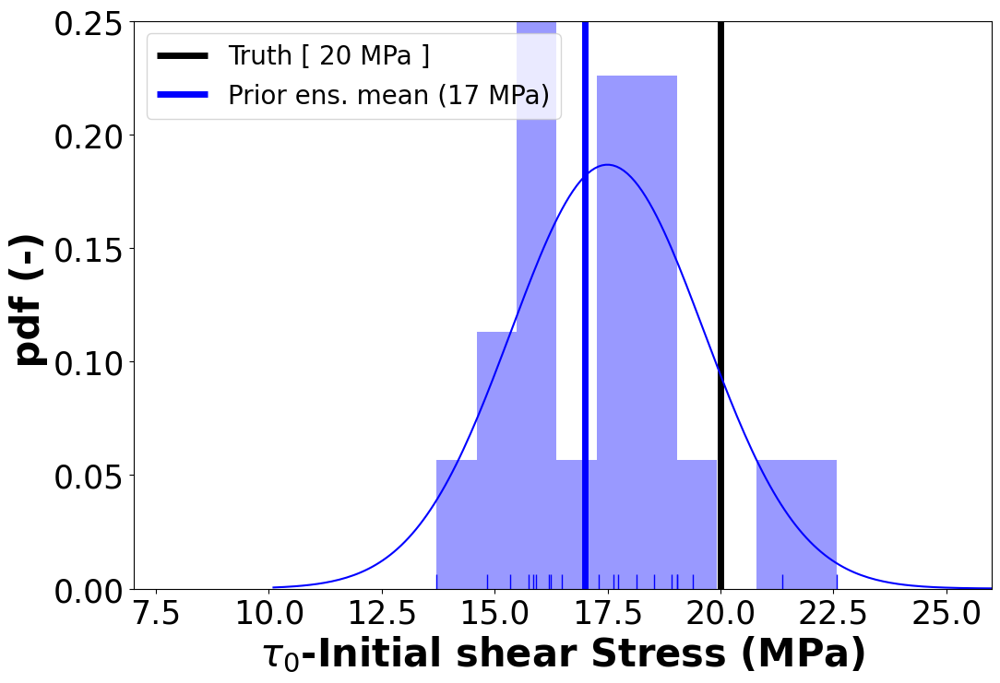

In [31]:
ens_mean = 17
ens_cov = 2.5

fig = plot_init_enkf(tau0_truth, tau0_ens, ens_mean, ens_cov)
# fig.savefig(os.path.join(path_images,'initial_prior_enkf_'+str(mem)+'.png'), bbox_inches='tight')

# Load truth at the fault

In [32]:
def process_output_json(path_folder):

    output_json = [
        json.loads(line) for line in open(os.path.join(path_folder, "output.json"), "r")
    ]

    yr = 365.25 * 24 * 60 * 60
    tau = []
    vel = []
    theta = []
    index = []
    time = []
    dt = []

    for i in range(len(output_json)):
        tau.append(output_json[i]["Tau"] / 1e6)
        vel.append(output_json[i]["V"])
        theta.append(output_json[i]["theta"])
        index.append(output_json[i]["i"])
        time.append(output_json[i]["t"] / yr)
        dt.append(output_json[i]["dt"])

    tau = np.array(tau[1:])
    vel = np.array(vel[1:])
    theta = np.array(theta[:-1])
    index = np.array(index[:-1])
    time = np.array(time[:-1])
    dt = np.array(dt[:-1])

    output_info = {
        "tau": tau,
        "vel": vel,
        "theta": theta,
        "index": index,
        "time": time,
        "dt": dt,
    }

    return output_info

In [33]:
def plot_truth_fault(truth_info, path_images, variable):

    # Setup Figure

    fig = plt.figure(figsize=(20, 10))
    plt.xlabel("Time (yr)", fontsize=20, fontweight="bold")
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)

    # Extracting info output.json

    time = truth_info["time"]
    state = truth_info[variable]

    # plot

    if variable == "tau":
        # Should move it to time-dt
        plt.scatter(time, state, color="k", label="Truth")
        plt.ylabel("Shear Stress at Fault (MPa)", fontsize=20, fontweight="bold")
        plt.title("Time Series Truth for Shear Stress at Fault", fontsize=20)
        plt.plot(time, state, color="k", label="Truth")
        plt.ylabel("Shear Stress at Fault (MPa)", fontsize=20, fontweight="bold")
        plt.title("Time Series Truth for Shear Stress at Fault", fontsize=20)

    #         plt.scatter(time[:-1],state[1:],color='lightblue',label='Truth')
    #         plt.ylabel("Shear Stress at Fault (MPa)",fontsize=20,fontweight='bold')
    #         plt.title("Time Series Truth for Shear Stress at Fault", fontsize=20)
    #         plt.plot(time[:-1],state[1:],color='lightblue',label='Truth')
    #         plt.ylabel("Shear Stress at Fault (MPa)",fontsize=20,fontweight='bold')
    #         plt.title("Time Series Truth for Shear Stress at Fault", fontsize=20)

    if variable == "vel":
        plt.scatter(time, np.log10(state), color="k", label="Truth")
        plt.ylabel("Slip Rate at Fault (m/_interps)", fontsize=20, fontweight="bold")
        plt.title("Time Series Truth for Slip Rate at Fault", fontsize=20)

    #         plt.scatter(time[:-1],np.log10(state[1:]),color='lightblue',label='Truth')
    #         plt.ylabel("Slip Rate at Fault (m/_interps)",fontsize=20,fontweight='bold')
    #         plt.title("Time Series Truth for Slip Rate at Fault", fontsize=20)
    #         plt.plot(time[:-1],np.log10(state[1:]),color='lightblue',label='Truth')
    #         plt.ylabel("Slip Rate at Fault (m/_interps)",fontsize=20,fontweight='bold')
    #         plt.title("Time Series Truth for Slip Rate at Fault", fontsize=20)

    if variable == "theta":
        #         plt.scatter(time[:-1],np.log10(state[1:]),color='lightblue',label='Truth')
        plt.scatter(time, np.log10(state), color="k", label="Truth")
        plt.ylabel("Theta (-)", fontsize=20, fontweight="bold")
        plt.title("Time Series Truth for Theta State at Fault", fontsize=20)
        plt.ylim(7, 10)

    #         plt.scatter(time,np.log10(state),color='lightblue',label='Truth')
    #         plt.ylabel("Theta (-)",fontsize=20,fontweight='bold')
    #         plt.title("Time Series Truth for Theta State at Fault", fontsize=20)
    #         plt.plot(time,np.log10(state),color='lightblue',label='Truth')
    #         plt.ylabel("Theta (-)",fontsize=20,fontweight='bold')
    #         plt.title("Time Series Truth for Theta State at Fault", fontsize=20)

    if variable == "dt":
        plt.scatter(time, state, color="k", label="Truth")
        plt.ylabel("dt (yr)", fontsize=20, fontweight="bold")
        plt.title("Time Series Truth for Time Steps", fontsize=20)

    plt.xlim(150, 300)
    plt.legend(fontsize=18)
    #     fig.savefig(os.path.join(path_images,'truth_'+variable+'.png'), bbox_inches='tight')

    return fig

/scratch-local/montero/ipykernel_390999/894303757.py:65: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(fontsize=18)


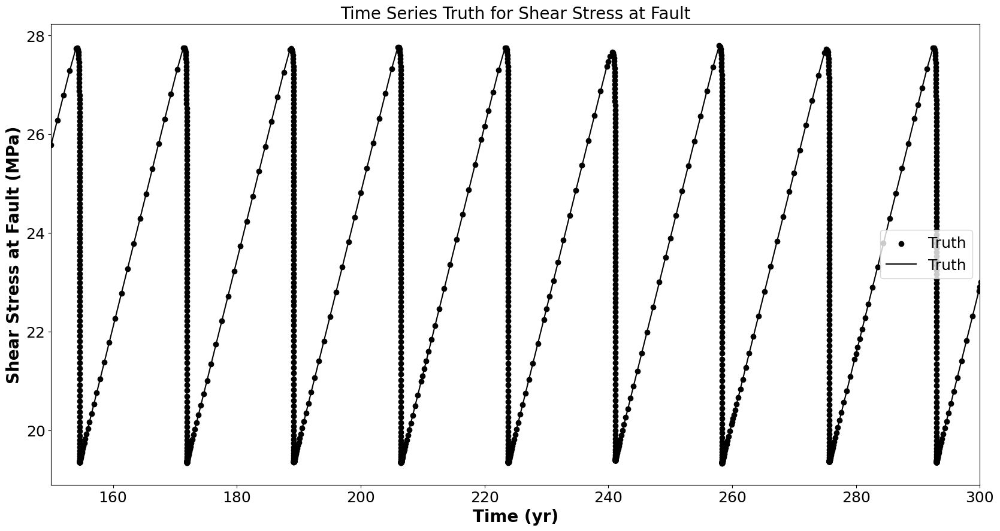

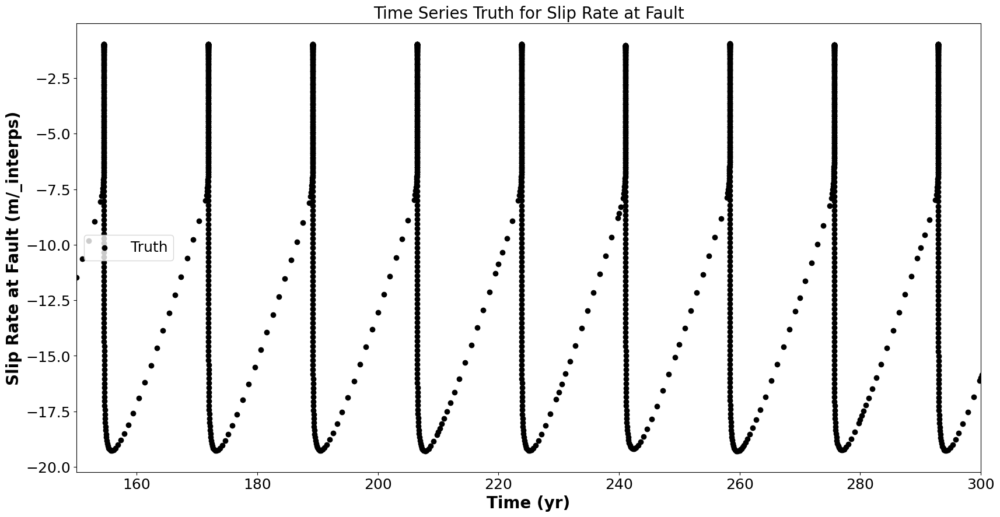

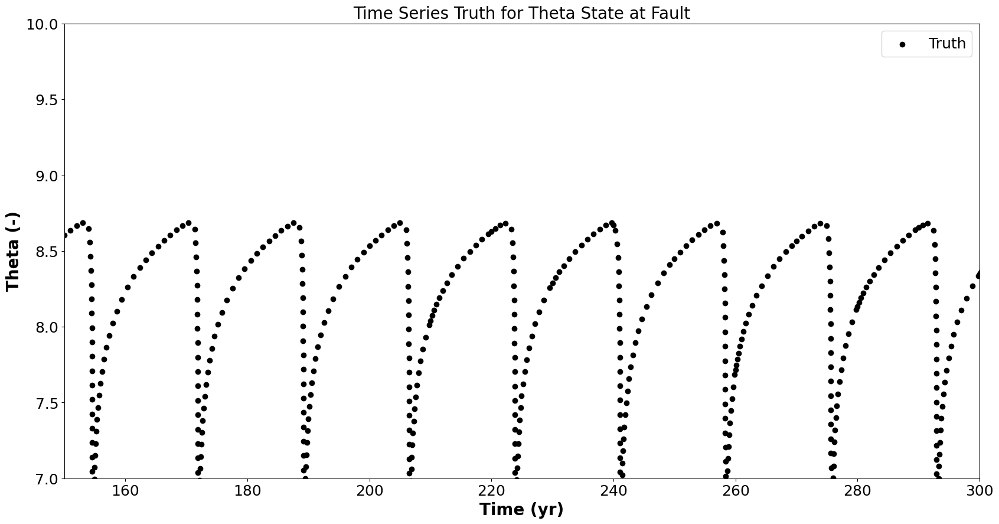

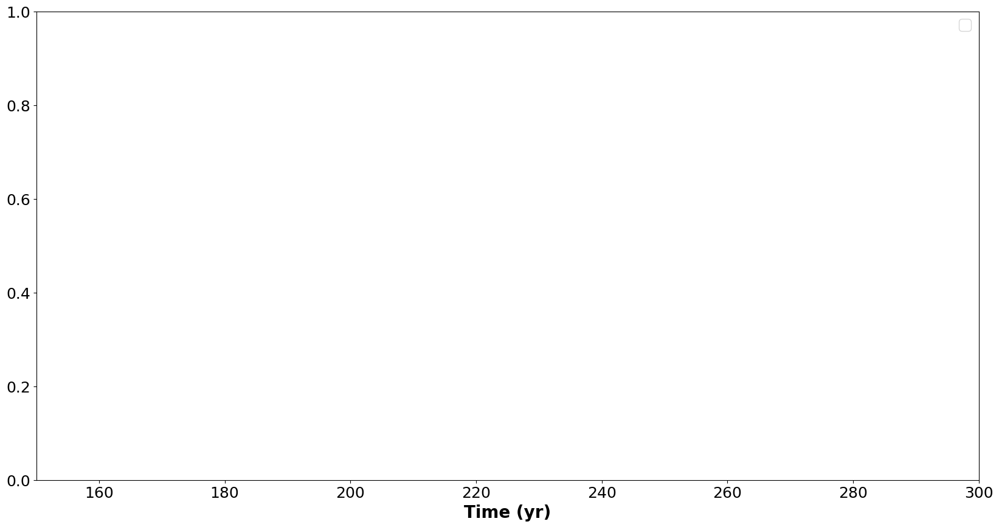

In [34]:
truth_info = process_output_json(path_truth)
fig = plot_truth_fault(truth_info, path_images, "tau")
fig = plot_truth_fault(truth_info, path_images, "vel")
fig = plot_truth_fault(truth_info, path_images, "theta")
fig = plot_truth_fault(truth_info, path_images, "time")

# Load Information at Fault for Ensembles

In [35]:
ensemble_info = []
for i in range(mem):
    path_ens_member = os.path.join(path_garnet_data, "ens_" + str(i + 1))
    member_info = process_output_json(path_ens_member)
    ensemble_info.append(member_info)

print(len(ensemble_info))

20


In [36]:
ens_wrong = []
# rem_1=ensemble_info[4]
# rem_2=ensemble_info[8]

# ensemble_info.remove(rem_1)
# ensemble_info.remove(rem_2)

# ensemble_info[4]=ensemble_info[3]
# ensemble_info[8]=ensemble_info[6]

# Interpolate Ensemble

In [37]:
def plot_ensemble_tau_fault(ensemble_info, truth_info, time_simulation, list_obsnet):

    mem = len(ensemble_info)
    print(mem)

    time_interp = np.arange(0, time_simulation, 1)
    tau_ens_interp = np.zeros((mem, time_interp.shape[0]))

    ens_interp_mean = []
    ens_interp_median = []
    ens_interp_cov = []
    ens_interp_p16 = []
    ens_interp_p84 = []

    # Load observations

    index_obs = list_obsnet[:, 1]
    index_obs = index_obs.astype(int)
    index_obs.tolist()

    # Setup figure

    fig = plt.figure(figsize=(20, 10))
    ax = plt.gca()
    plt.xlabel("Time (yr)", fontsize=20, fontweight="bold")
    plt.ylabel("Shear Stress at Fault (MPa)", fontsize=20, fontweight="bold")
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)

    time_truth = truth_info["time"]
    tau_truth = truth_info["tau"]

    for i in range(mem):
        tau_ens_interp[i, :] = np.interp(
            time_interp, ensemble_info[i]["time"], ensemble_info[i]["tau"]
        )
        #         if(min(tau_ens_interp[i,:])<4):
        #             ens_wrong.append(i)
        #         plt.plot(ensemble_info[i]['time'],ensemble_info[i]['tau'],color='lightgreen',linewidth=3)
        plt.plot(
            time_interp,
            tau_ens_interp[i, :],
            color="lightgreen",
            linewidth=3,
            zorder=1,
            alpha=0.4,
        )

    tau_truth_interp = np.interp(time_interp, time_truth, tau_truth)

    for i in range(len(time_interp)):
        interp_mean = np.mean(tau_ens_interp[:, i])
        interp_median = np.median(tau_ens_interp[:, i])
        interp_std = np.std(tau_ens_interp[:, i], ddof=1)

        ens_interp_mean.append(interp_mean)
        ens_interp_median.append(interp_median)
        ens_interp_cov.append(interp_std)
        ens_interp_p16.append(stats.norm.ppf(0.16, interp_mean, interp_std))
        ens_interp_p84.append(stats.norm.ppf(0.84, interp_mean, interp_std))

    print(len(ens_interp_mean))

    # Plot truth
    plt.plot(time_truth, tau_truth, color="k", label="Truth", linewidth=4, zorder=4)

    #     plt.plot(time_interp,ens_interp_median,color='m',linewidth=4,zorder=5)
    #     plt.plot(time_interp,ens_interp_mean,color='g',linewidth=4,zorder=5)
    #     plt.plot(time_interp,ens_interp_p16,color='g',zorder=5,linestyle='--')
    #     plt.plot(time_interp,ens_interp_p84,color='g',zorder=5,linestyle='--')
    #     ax.fill_between(time_interp, ens_interp_p16, ens_interp_p84,color='g',zorder=4,alpha=0.2)

    # Plot observations
    #     obs_err=np.ones(len(index_obs))*0.75
    #     plt.errorbar(obsnet_tau[:,0], obsnet_tau[:,1], yerr=obs_err,fmt='D',color='red', elinewidth=2 ,capsize=3,zorder=6)

    # plt.xlim(0,10000)
    # plt.xlim(33000,37000)
    plt.xlim(900, 930)
    plt.ylim(15, 30)

    # fig.savefig(os.path.join(path_images,'fault_comp_members_no_filter.png'), bbox_inches='tight')
    # fig.savefig(os.path.join(path_images,'fault_comp_members_filtered.png'), bbox_inches='tight')
    # fig.savefig(os.path.join(path_images,'fault_enkf_members_plotted.png'), bbox_inches='tight')
    #     fig.savefig(os.path.join(path_images,'fault_enkf_members_filtered.png'), bbox_inches='tight')

    return (
        fig,
        tau_truth_interp,
        ens_interp_mean,
        ens_interp_median,
        time_interp,
        ens_interp_p84,
    )

20
1500


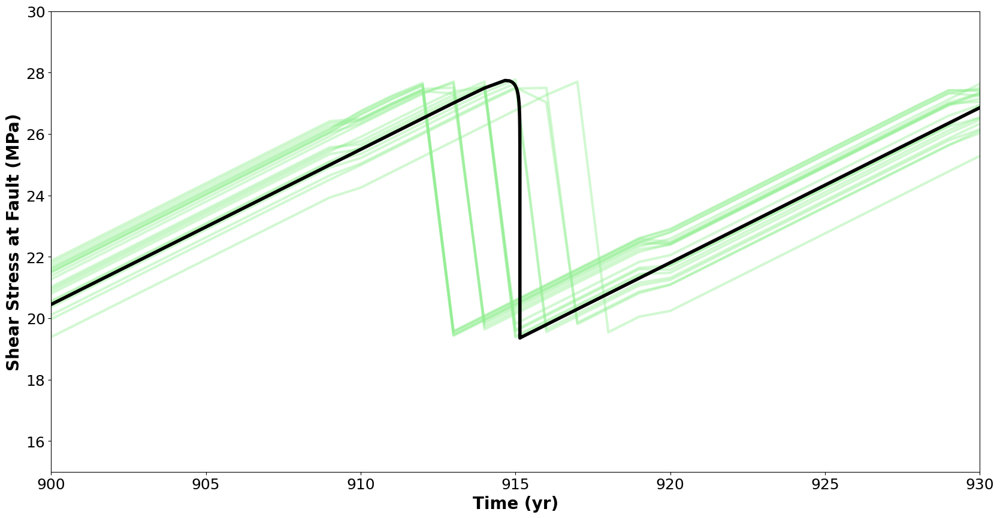

In [38]:
(
    fig,
    tau_truth_interp,
    ens_interp_mean_tau,
    ens_interp_median_tau,
    time_interp_tau,
    ens_interp_p84,
) = plot_ensemble_tau_fault(ensemble_info, truth_info, time_simulation, list_obsnet)

In [39]:
time_interp_tau = np.arange(0, time_simulation, 1)
tau_ens_interp = np.zeros((mem, time_interp_tau.shape[0]))

ens_interp_mean_tau = []
ens_interp_median_tau = []
ens_interp_std_tau = []

# Load observations

index_obs = list_obsnet[:, 1]
index_obs = index_obs.astype(int)
index_obs.tolist()

time_truth = truth_info["time"]
tau_truth = truth_info["tau"]

tau_max = np.max(tau_truth)
tau_min = np.min(tau_truth)

for i in range(mem):
    tau_ens_interp[i, :] = np.interp(
        time_interp_tau, ensemble_info[i]["time"], ensemble_info[i]["tau"]
    )

tau_truth_interp = np.interp(time_interp_tau, time_truth, tau_truth)

for i in range(len(time_interp_tau)):
    interp_mean_tau = np.mean(tau_ens_interp[:, i])
    interp_median_tau = np.median(tau_ens_interp[:, i])
    interp_std_tau = np.std(tau_ens_interp[:, i], ddof=1)

    ens_interp_mean_tau.append(interp_mean_tau)
    ens_interp_median_tau.append(interp_median_tau)
    ens_interp_std_tau.append(interp_std_tau)

# Plot observations
obs_err = np.ones(len(index_obs)) * 1.5

absolute_error_mean_tau = np.abs(tau_truth_interp - np.array(ens_interp_mean_tau))
absolute_error_median_tau = np.abs(tau_truth_interp - np.array(ens_interp_median_tau))

(0.0, 1470.0)

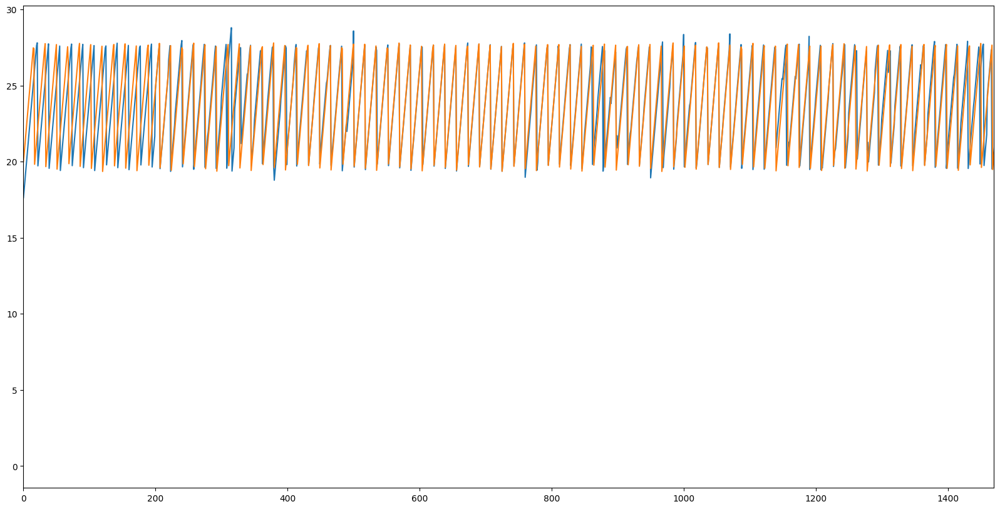

In [40]:
# print(list_median_time)
# print(list_median_member)

tau_ens_median_interp = np.zeros(len(time_interp_tau))

fig = plt.figure(figsize=(20, 10))

for i in range(len(list_median_member)):

    tau_ens_median_interp[list_median_time[i] : list_median_time[i + 1]] = (
        tau_ens_interp[
            list_median_member[i], list_median_time[i] : list_median_time[i + 1]
        ]
    )

plt.plot(time_interp_tau, tau_ens_median_interp)
plt.plot(time_interp_tau, tau_truth_interp)


plt.xlim(0, list_median_time[-2])

# Median plot

1500


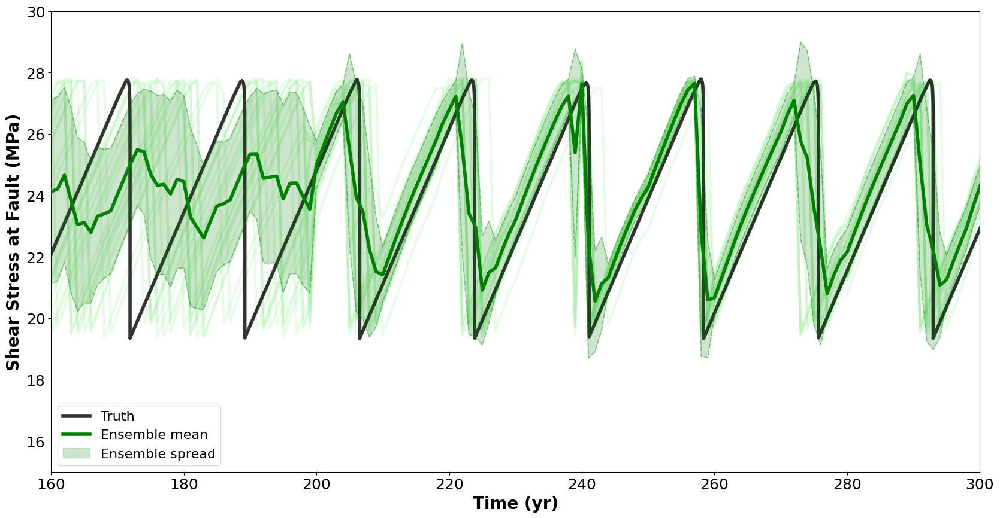

In [41]:
mem = len(ensemble_info)

time_interp = np.arange(0, time_simulation, 1)

ens_interp_mean = []
ens_interp_median = []
ens_interp_cov = []
ens_interp_p16 = []
ens_interp_p84 = []

# Load observations


index_obs = list_obsnet[:, 1]
index_obs = index_obs.astype(int)
index_obs.tolist()


# Setup figure

fig = plt.figure(figsize=(20, 10))
ax = plt.gca()
plt.xlabel("Time (yr)", fontsize=20, fontweight="bold")
plt.ylabel("Shear Stress at Fault (MPa)", fontsize=20, fontweight="bold")
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

# time_truth=truth_info['time'][:-1]
# tau_truth=truth_info['tau'][1:]

time_truth = truth_info["time"]
tau_truth = truth_info["tau"]


for i in range(mem):
    tau_ens_interp[i, :] = np.interp(
        time_interp, ensemble_info[i]["time"][:-1], ensemble_info[i]["tau"][1:]
    )

    plt.plot(
        time_interp,
        tau_ens_interp[i, :],
        color="lightgreen",
        linewidth=3,
        zorder=1,
        alpha=0.2,
    )


tau_truth_interp = np.interp(time_interp, time_truth, tau_truth)

for i in range(len(time_interp)):
    interp_mean = np.mean(tau_ens_interp[:, i])
    interp_median = np.median(tau_ens_interp[:, i])
    interp_std = np.std(tau_ens_interp[:, i], ddof=1)

    ens_interp_mean.append(interp_mean)
    ens_interp_median.append(interp_median)
    ens_interp_cov.append(interp_std)
    ens_interp_p16.append(stats.norm.ppf(0.16, interp_mean, interp_std))
    ens_interp_p84.append(stats.norm.ppf(0.84, interp_mean, interp_std))

print(len(ens_interp_mean))

# Plot truth
plt.plot(
    time_truth, tau_truth, color="k", label="Truth", linewidth=4, zorder=4, alpha=0.8
)

# plt.scatter(time[:-1],np.log10(state[1:]),color='lightblue',label='Truth')

plt.plot(
    time_interp,
    ens_interp_mean,
    color="g",
    linewidth=4,
    zorder=5,
    label="Ensemble mean",
)
plt.plot(time_interp, ens_interp_p16, color="g", zorder=5, linestyle="--", alpha=0.3)
plt.plot(time_interp, ens_interp_p84, color="g", zorder=5, linestyle="--", alpha=0.3)
ax.fill_between(
    time_interp,
    ens_interp_p16,
    ens_interp_p84,
    color="g",
    zorder=4,
    alpha=0.2,
    label="Ensemble spread",
)
# plt.plot(time_interp_tau,tau_ens_median_interp,color='m',linewidth=4,label='Median ens. member')fig.savefig(os.path.join(path_images,'truth_'+variable+'.png'), bbox_inches='tight')


# Plot observations
#     obs_err=np.ones(len(index_obs))*0.75
#     plt.errorbar(obsnet_tau[:,0], obsnet_tau[:,1], yerr=obs_err,fmt='D',color='red', elinewidth=2 ,capsize=3,zorder=6)

# plt.xlim(0,10000)
# plt.xlim(33000,37000)
plt.xlim(160, 300)
plt.ylim(15, 30)
plt.legend(fontsize=16, loc=3)

In [42]:
data = []
time_vect = np.arange(200, 1200, 10)
for i in time_vect:
    data.append(tau_ens_interp[:, i])

In [43]:
# fig1, ax1 = plt.subplots(figsize=(20,10))
# ax1.set_title('Basic Plot')
# ax1.boxplot(data,positions=time_vect,widths=2, showmeans=True,autorange=True,patch_artist=True)
# plt.plot(time_truth,tau_truth,color='k',linewidth=3)


# # plt.xticks(np.arange(min(time_interp_tau), max(time_interp_tau)+1, 100))
# plt.xlim(700,800)
# plt.ylim(15,35)

In [44]:
# import seaborn as sns

# sns.catplot(data=data,
#             jitter=False)

In [45]:
# data = [data, d2, d2[::2,0]]
# fig7, ax7 = plt.subplots()
# ax7.set_title('Multiple Samples with Different sizes')
# ax7.boxplot(data)

# plt.show()

(20, 1500)
(1500,)


/scratch-local/montero/ipykernel_390999/2039668640.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(tau_ens_interp[:, 0], color="g", fit=norm, kde=False, bins=15)
/scratch-local/montero/ipykernel_390999/2039668640.py:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(tau_ens_interp[:, 0], color

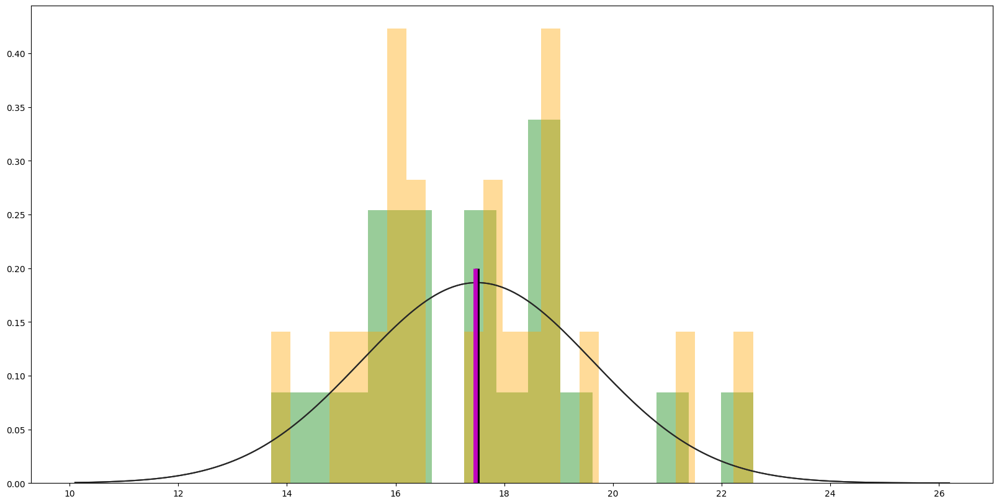

In [46]:
print(tau_ens_interp.shape)
print(tau_truth_interp.shape)
fig = plt.figure(figsize=(20, 10))
# sns.distplot(tau_ens_interp[:,0],color='r',fit=norm,kde=False,bins=10)
sns.distplot(tau_ens_interp[:, 0], color="g", fit=norm, kde=False, bins=15)
# sns.distplot(tau_ens_interp[:,0],color='b',fit=norm,kde=False,bins=20)
sns.distplot(tau_ens_interp[:, 0], color="orange", fit=norm, kde=False, bins=25)

plt.vlines(
    np.mean(tau_ens_interp[:, 0]),
    ymin=0,
    ymax=0.2,
    color="k",
    linewidth=5,
    label="mean",
)
plt.vlines(
    np.median(tau_ens_interp[:, 0]),
    ymin=0,
    ymax=0.2,
    color="m",
    linewidth=5,
    label="median",
)

900
905
910
915
920
925
930
935
940
945
950
955
960
965
970
975


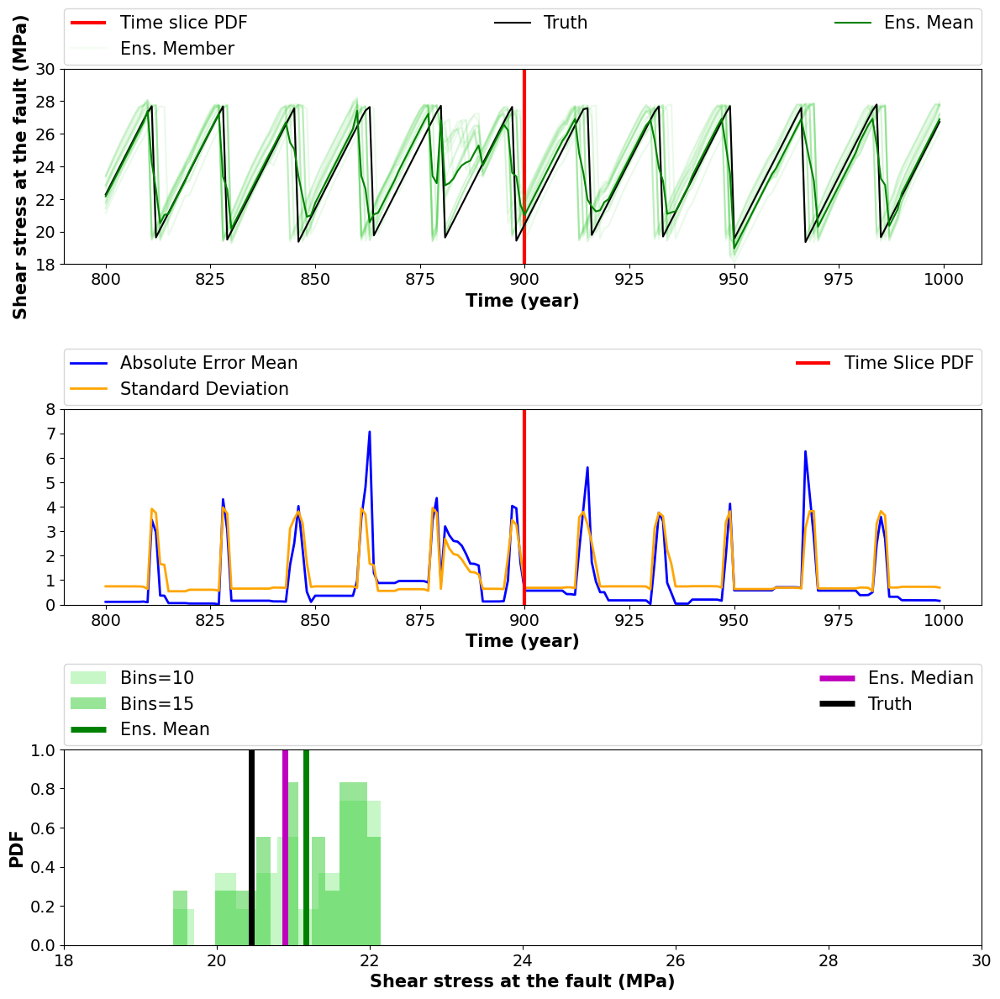

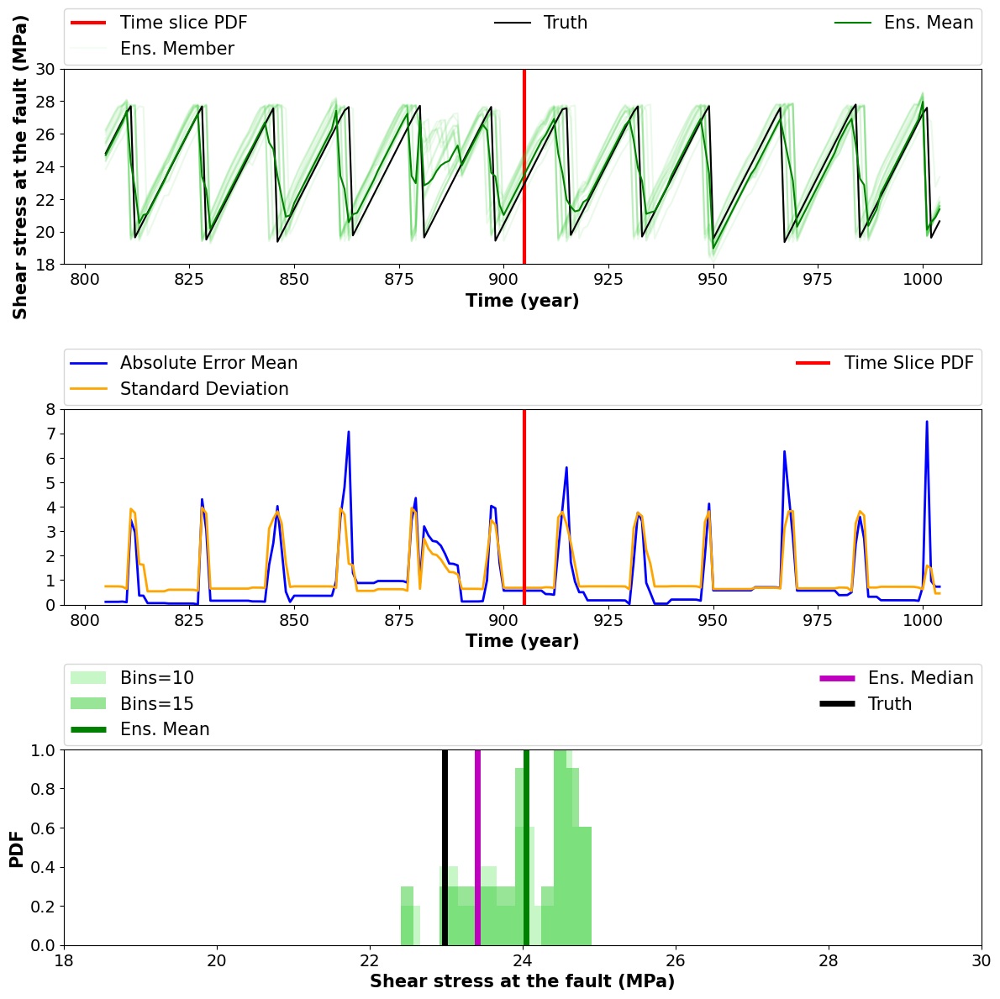

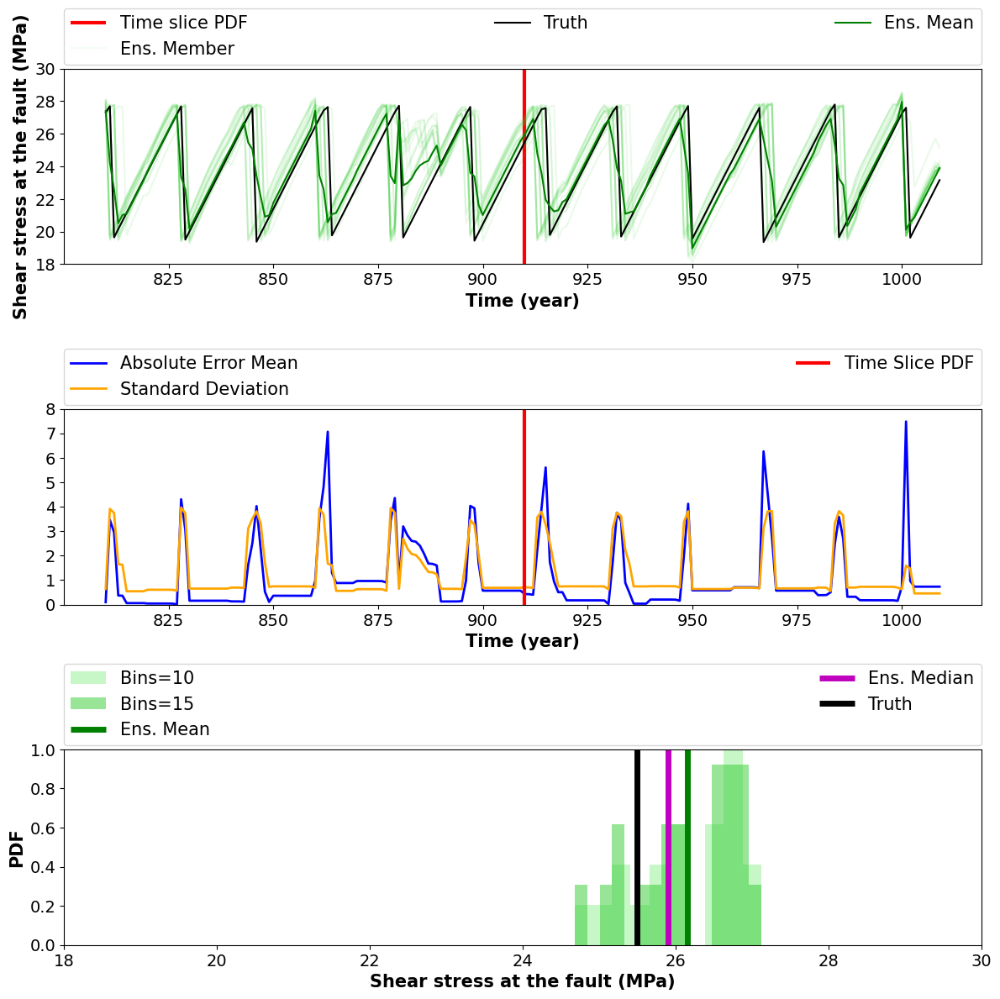

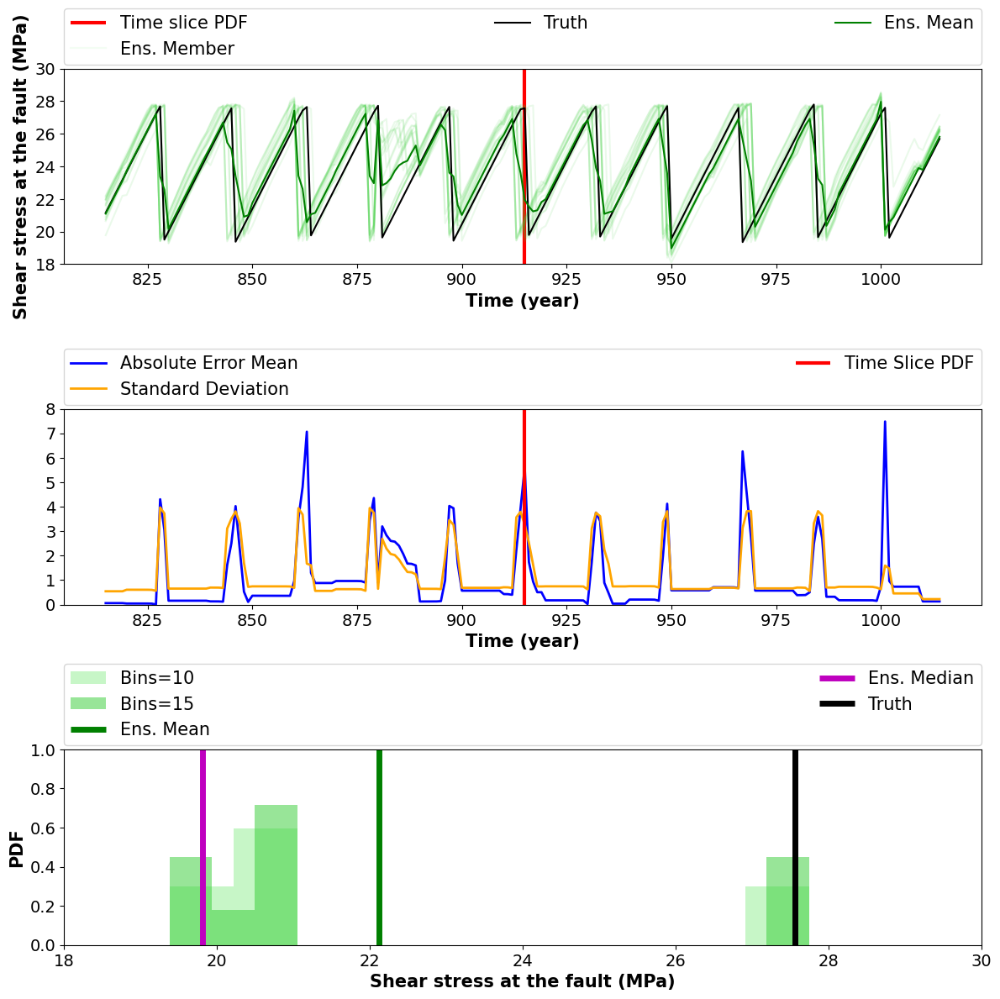

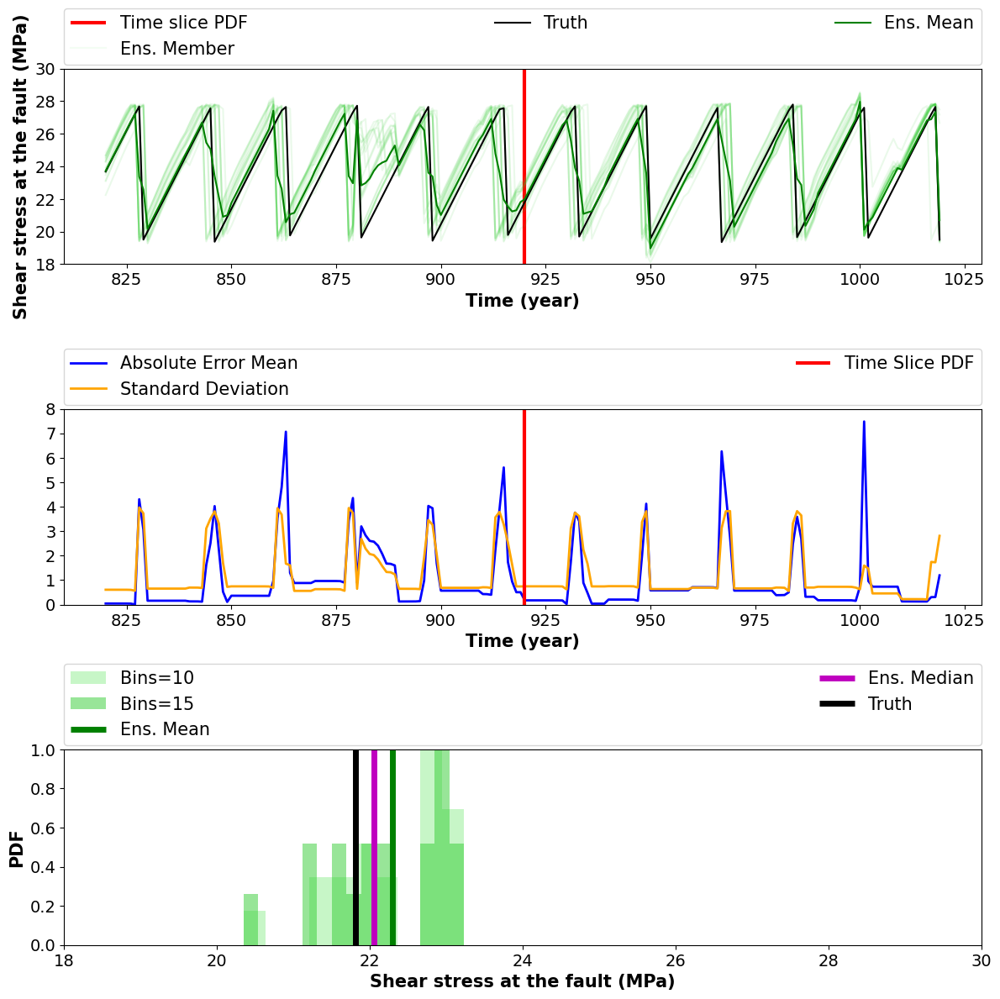

...

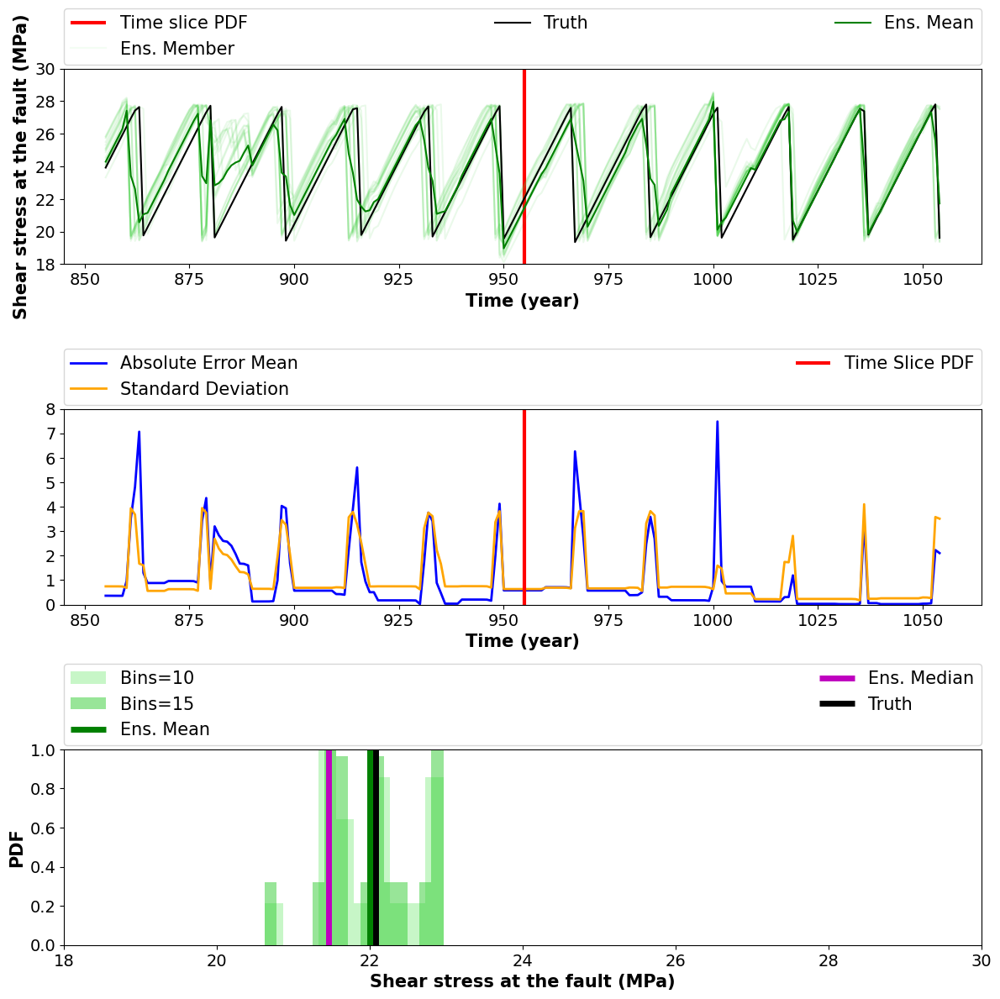

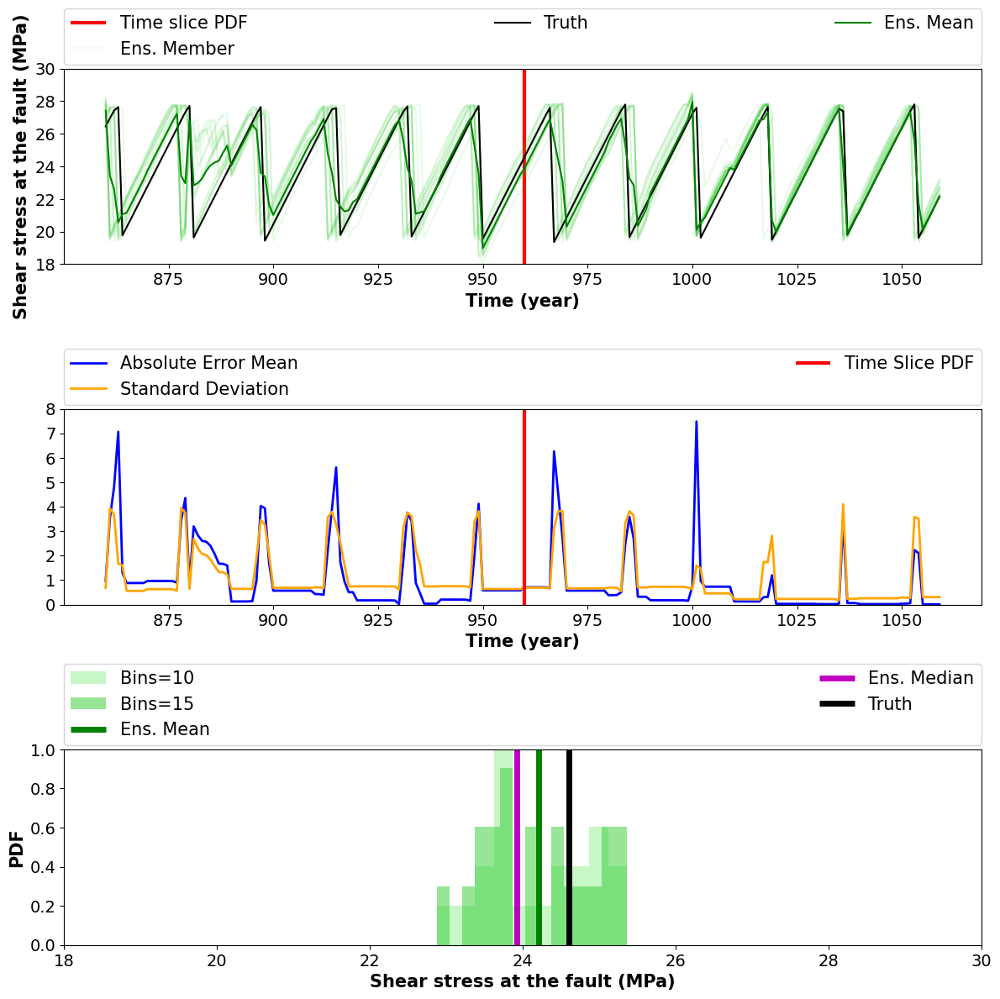

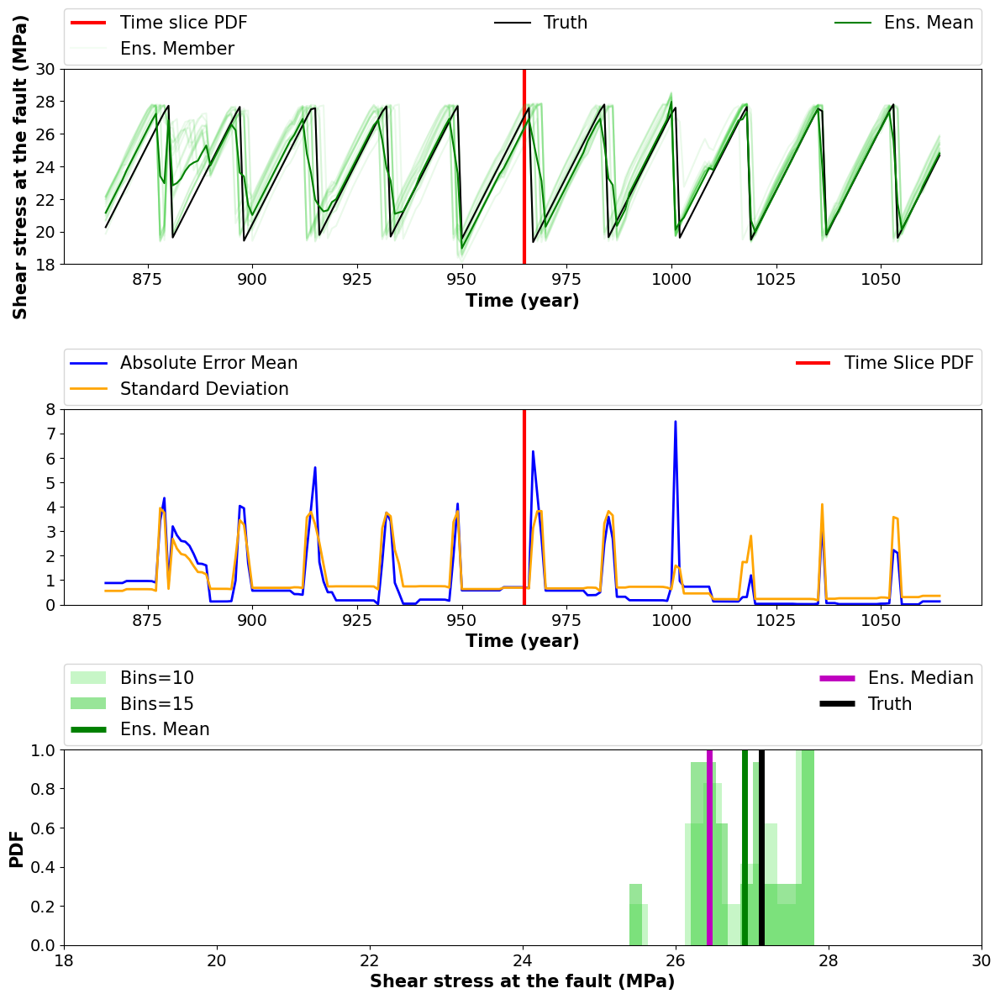

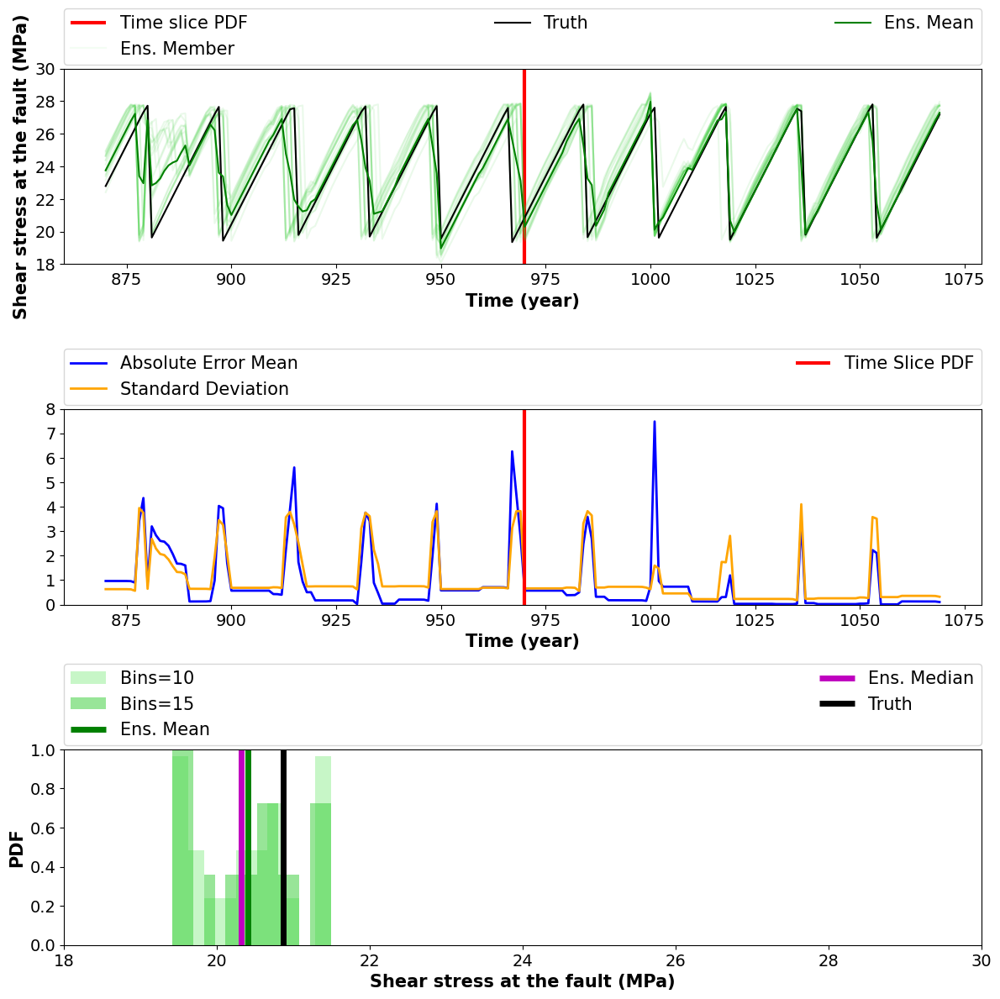

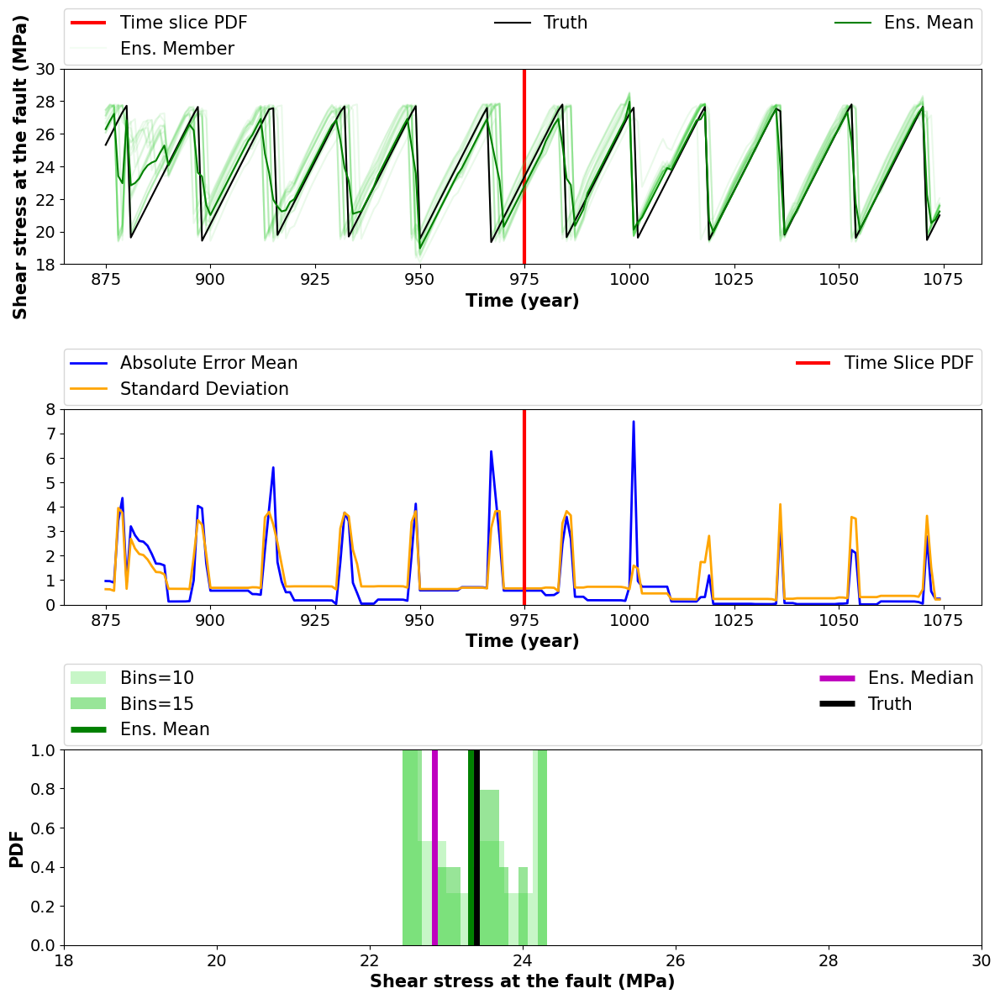

In [47]:
# GIF creation of forward model results

absolute_error_mean_tau = np.abs(tau_truth_interp - np.array(ens_interp_mean_tau))
absolute_error_median_tau = np.abs(tau_truth_interp - tau_ens_median_interp)
# absolute_error_median=np.abs(tau_truth_interp-np.array(ens_interp_median))

t_cutoff_vect = np.arange(900, 980, 5)

for j in range(len(t_cutoff_vect)):

    t_cutoff = t_cutoff_vect[j]

    print(t_cutoff)

    fig = plt.figure(figsize=(12, 12))

    plt.subplot(311)

    plt.vlines(
        t_cutoff, ymin=15, ymax=35, color="r", linewidth=3, label="Time slice PDF"
    )
    plt.plot(
        time_interp_tau[t_cutoff - 100 : t_cutoff + 100],
        tau_ens_interp[0, t_cutoff - 100 : t_cutoff + 100],
        color="lightgreen",
        alpha=0.1,
        label="Ens. Member",
    )
    for i in range(1, mem, 1):
        plt.plot(
            time_interp_tau[t_cutoff - 100 : t_cutoff + 100],
            tau_ens_interp[i, t_cutoff - 100 : t_cutoff + 100],
            color="limegreen",
            alpha=0.1,
        )
    plt.plot(
        time_interp_tau[t_cutoff - 100 : t_cutoff + 100],
        tau_truth_interp[t_cutoff - 100 : t_cutoff + 100],
        color="k",
        label="Truth",
    )
    plt.plot(
        time_interp_tau[t_cutoff - 100 : t_cutoff + 100],
        ens_interp_mean_tau[t_cutoff - 100 : t_cutoff + 100],
        color="g",
        label="Ens. Mean",
    )

    if t_cutoff <= 300:
        plt.vlines(
            200,
            ymin=17,
            ymax=30,
            color="saddlebrown",
            linewidth=5,
            label="Start data assimilation",
        )

    plt.ylim(18, 30)
    #     plt.legend(fontsize=12,loc=1)
    plt.legend(
        fontsize=15,
        bbox_to_anchor=(0, 1.02, 1, 0.2),
        loc="lower left",
        mode="expand",
        borderaxespad=0,
        ncol=3,
    )
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)

    #     print(tau_ens_interp.shape)
    #     print(tau_truth_interp.shape)

    plt.xlabel("Time (year)", fontsize=15, fontweight="bold")
    plt.ylabel("Shear stress at the fault (MPa)", fontsize=15, fontweight="bold")

    plt.subplot(313)

    # fig=plt.figure(figsize=(20,10))
    plt.hist(
        tau_ens_interp[:, t_cutoff],
        color="lightgreen",
        bins=10,
        label="Bins=10",
        density=True,
        alpha=0.5,
    )
    plt.hist(
        tau_ens_interp[:, t_cutoff],
        color="limegreen",
        bins=15,
        label="Bins=15",
        density=True,
        alpha=0.5,
    )
    #     plt.hist(tau_ens_interp[:,t_cutoff],color='gray',bins=20,label='Bins=20',density=True,alpha=0.5)
    #     plt.hist(tau_ens_interp[:,t_cutoff],color='dimgray',bins=25,label='Bins=25',density=True,alpha=0.5)

    plt.vlines(
        np.mean(tau_ens_interp[:, t_cutoff]),
        ymin=0,
        ymax=1,
        color="g",
        linewidth=5,
        label="Ens. Mean",
    )
    plt.vlines(
        tau_ens_median_interp[t_cutoff],
        ymin=0,
        ymax=1,
        color="m",
        linewidth=5,
        label="Ens. Median",
    )
    plt.vlines(
        tau_truth_interp[t_cutoff],
        ymin=0,
        ymax=1,
        color="k",
        linewidth=5,
        label="Truth",
    )
    plt.ylim(0, 1)
    plt.xlim(18, 30)

    # plt.legend(fontsize=12,loc=1)
    plt.legend(
        fontsize=15,
        bbox_to_anchor=(0, 1.02, 1, 0.2),
        loc="lower left",
        mode="expand",
        borderaxespad=0,
        ncol=2,
    )
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)

    plt.xlabel("Shear stress at the fault (MPa)", fontsize=15, fontweight="bold")
    plt.ylabel("PDF", fontsize=15, fontweight="bold")

    plt.subplot(312)

    plt.plot(
        time_interp_tau[t_cutoff - 100 : t_cutoff + 100],
        absolute_error_mean_tau[t_cutoff - 100 : t_cutoff + 100],
        color="blue",
        linewidth=2,
        label="Absolute Error Mean",
    )
    #     plt.plot(time_interp[t_cutoff-200:t_cutoff+200],absolute_error_median[t_cutoff-200:t_cutoff+200],color='m',linewidth=2,label='Absolute Error Median')
    plt.plot(
        time_interp_tau[t_cutoff - 100 : t_cutoff + 100],
        ens_interp_std_tau[t_cutoff - 100 : t_cutoff + 100],
        color="orange",
        linewidth=2,
        label="Standard Deviation",
    )
    plt.vlines(
        t_cutoff, ymin=0, ymax=10, color="r", linewidth=3, label="Time Slice PDF"
    )
    if t_cutoff <= 300:
        plt.vlines(
            200,
            ymin=0,
            ymax=10,
            color="saddlebrown",
            linewidth=3,
            label="Start data assimilation",
        )

    plt.xlabel("Time (year)", fontsize=15, fontweight="bold")
    #     plt.ylabel('Shear stress at the fault (MPa)',fontsize=15,fontweight='bold')

    # plt.legend(fontsize=12,loc=1)
    plt.legend(
        fontsize=15,
        bbox_to_anchor=(0, 1.02, 1, 0.2),
        loc="lower left",
        mode="expand",
        borderaxespad=0,
        ncol=2,
    )
    plt.xticks(
        fontsize=14,
    )
    plt.yticks(fontsize=14)

    plt.tight_layout()
    plt.ylim(0, 8)

    fig.savefig(
        os.path.join(path_images, "movie", "dist_" + str(t_cutoff).zfill(5) + ".png"),
        bbox_inches="tight",
        transparent=True,
    )

    plt.ioff()

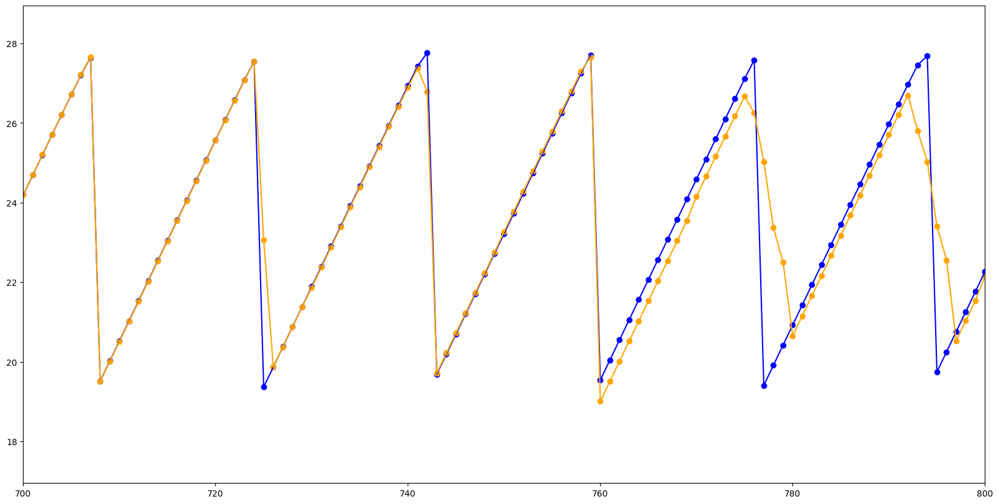

In [48]:
fig = plt.figure(figsize=(20, 10))
plt.scatter(time_interp_tau, tau_truth_interp, color="b")
plt.plot(time_interp_tau, tau_truth_interp, color="b")
plt.scatter(time_interp_tau, ens_interp_mean_tau, color="orange")
plt.plot(time_interp_tau, ens_interp_mean_tau, color="orange")
plt.xlim(700, 800)
plt.show()

<class 'numpy.ndarray'>
<class 'list'>


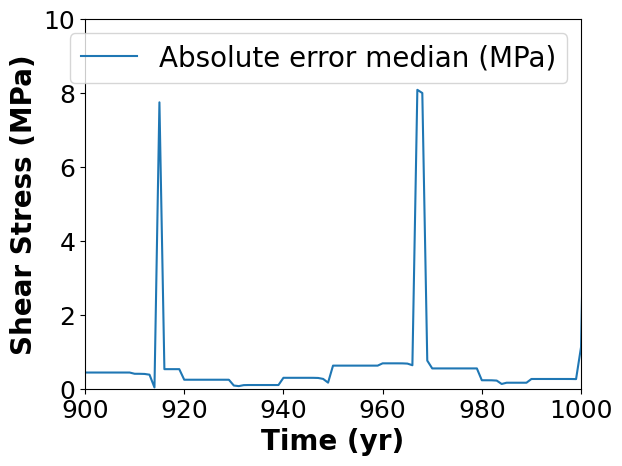

In [49]:
print(type(tau_truth_interp))
print(type(ens_interp_mean_tau))


# tau_truth
plt.plot(
    time_interp_tau, absolute_error_median_tau, label="Absolute error median (MPa)"
)

plt.xlim(900, 1000)
# plt.xlim(0,1500)

plt.xlabel("Time (yr)", fontsize=20, fontweight="bold")
plt.ylabel("Shear Stress (MPa)", fontsize=20, fontweight="bold")
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.ylim(0, 10)

plt.legend(fontsize=20, loc=1)
plt.show()

2.921264014154012
2.7242985223724943
2.3086644776225578
1.8367091999227767
1.774381373057121


/scratch-local/montero/ipykernel_390999/4013345068.py:22: RuntimeWarning: divide by zero encountered in scalar divide
  rmse_error_mean_tau[i] = np.sqrt(cum_error_mean_tau / i)
/scratch-local/montero/ipykernel_390999/4013345068.py:25: RuntimeWarning: divide by zero encountered in scalar divide
  rmse_error_median_tau[i] = np.sqrt(cum_error_median_tau / i)
/scratch-local/montero/ipykernel_390999/4013345068.py:28: RuntimeWarning: divide by zero encountered in scalar divide
  mae_error_mean_tau[i] = cum_ae_error_mean_tau / i
/scratch-local/montero/ipykernel_390999/4013345068.py:31: RuntimeWarning: divide by zero encountered in scalar divide
  mae_error_median_tau[i] = cum_ae_error_median_tau / i


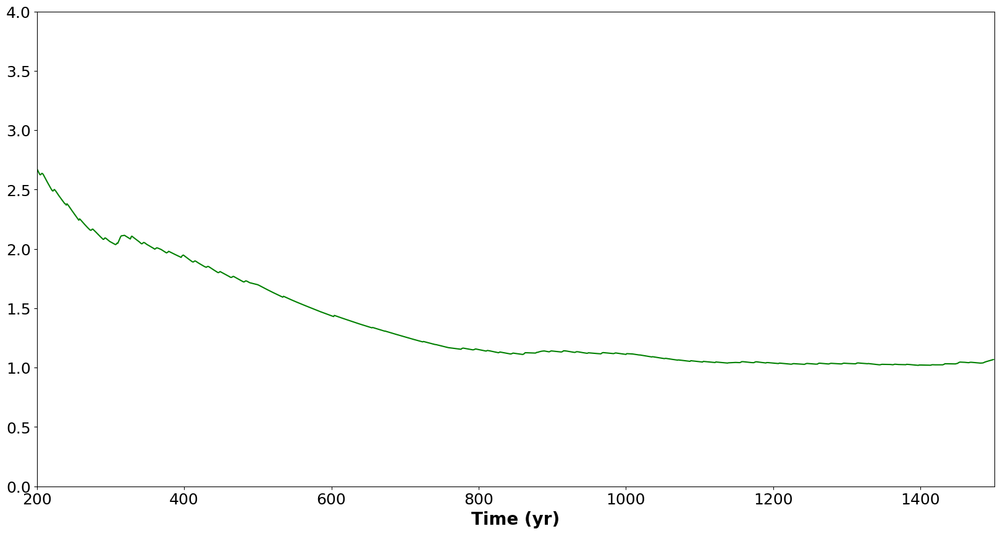

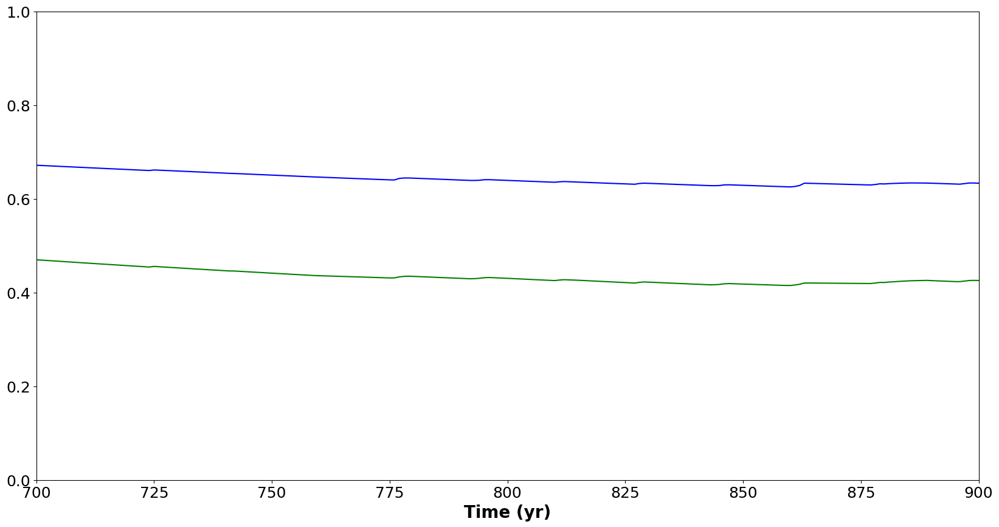

In [50]:
mse_error_mean_tau = tau_truth_interp - np.array(ens_interp_mean_tau)
mse_error_median_tau = tau_truth_interp - np.array(ens_interp_median_tau)

cum_error_mean_tau = 0
cum_error_median_tau = 0
rmse_error_mean_tau = np.zeros(len(mse_error_mean_tau))
rmse_error_median_tau = np.zeros(len(mse_error_median_tau))


ae_error_mean_tau = np.abs(tau_truth_interp - np.array(ens_interp_mean_tau))
ae_error_median_tau = np.abs(tau_truth_interp - np.array(ens_interp_median_tau))

cum_ae_error_mean_tau = 0
cum_ae_error_median_tau = 0
mae_error_mean_tau = np.zeros(len(ae_error_mean_tau))
mae_error_median_tau = np.zeros(len(ae_error_median_tau))


for i in range(len(mse_error_mean_tau)):

    cum_error_mean_tau = cum_error_mean_tau + mse_error_mean_tau[i] ** 2
    rmse_error_mean_tau[i] = np.sqrt(cum_error_mean_tau / i)

    cum_error_median_tau = cum_error_median_tau + mse_error_median_tau[i] ** 2
    rmse_error_median_tau[i] = np.sqrt(cum_error_median_tau / i)

    cum_ae_error_mean_tau = cum_ae_error_mean_tau + ae_error_mean_tau[i]
    mae_error_mean_tau[i] = cum_ae_error_mean_tau / i

    cum_ae_error_median_tau = cum_ae_error_median_tau + ae_error_median_tau[i]
    mae_error_median_tau[i] = cum_ae_error_median_tau / i

fig = plt.figure(figsize=(20, 10))

plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

# plt.plot(time_interp_tau,rmse_error_mean_tau,color='g')
# plt.plot(time_interp_tau,rmse_error_median_tau,color='lightblue')
plt.plot(time_interp_tau, mae_error_mean_tau, color="g")
# plt.plot(time_interp_tau,mae_error_median_tau,color='lightgreen')
plt.ylim(0, 4)
plt.xlim(200, 1500)

plt.xlabel("Time (yr)", fontsize=20, fontweight="bold")
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)


print(rmse_error_mean_tau[100])
print(rmse_error_mean_tau[250])
print(rmse_error_mean_tau[500])
print(rmse_error_mean_tau[1000])
print(rmse_error_mean_tau[1200])

# nrmse_error_mean_tau=rmse_error_mean_tau/np.abs(tau_max-tau_min)
# nrmse_error_median_tau=rmse_error_median_tau/np.abs(tau_max-tau_min)
# nmae_error_mean_tau=mae_error_mean_tau/np.abs(tau_max-tau_min)
# nmae_error_median_tau=mae_error_median_tau/np.abs(tau_max-tau_min)

nrmse_error_mean_tau = rmse_error_mean_tau / rmse_error_mean_tau[200]
nrmse_error_median_tau = rmse_error_median_tau / rmse_error_median_tau[200]
nmae_error_mean_tau = mae_error_mean_tau / mae_error_mean_tau[200]
nmae_error_median_tau = mae_error_median_tau / mae_error_median_tau[200]


fig = plt.figure(figsize=(20, 10))

plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

plt.plot(time_interp_tau, nrmse_error_mean_tau, color="b")
# plt.plot(time_interp_tau,nrmse_error_median_tau,color='lightblue')
plt.plot(time_interp_tau, nmae_error_mean_tau, color="g")
# plt.plot(time_interp_tau,nmae_error_median_tau,color='lightgreen')
plt.ylim(0, 1)
plt.xlim(700, 900)

plt.xlabel("Time (yr)", fontsize=20, fontweight="bold")
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()

In [51]:
def plot_ensemble_vel_fault(ensemble_info, truth_info, time_simulation, list_obsnet):

    mem = len(ensemble_info)
    print(mem)

    time_interp_vel = np.arange(0, time_simulation, 1)
    vel_ens_interp = np.zeros((mem, time_interp_vel.shape[0]))

    ens_interp_mean_vel = []
    ens_interp_median_vel = []
    ens_interp_cov_vel = []
    ens_interp_p16_vel = []
    ens_interp_p84_vel = []

    # Load observations

    index_obs = list_obsnet[:, 1]
    index_obs = index_obs.astype(int)
    index_obs.tolist()

    # Setup figure

    fig = plt.figure(figsize=(20, 10))
    ax = plt.gca()
    plt.xlabel("Time (yr)", fontsize=28, fontweight="bold")
    plt.ylabel("ln( slip velocity[m/s] ) at fault", fontsize=28, fontweight="bold")
    plt.xticks(fontsize=22)
    plt.yticks(fontsize=22)

    time_truth = truth_info["time"]
    vel_truth = truth_info["vel"]

    plt.plot(
        ensemble_info[0]["time"],
        np.log10(ensemble_info[0]["vel"]),
        color="lightgreen",
        linewidth=3,
        alpha=0.2,
        label="Ens.Member",
    )
    for i in range(mem):
        vel_ens_interp[i, :] = np.interp(
            time_interp_vel, ensemble_info[i]["time"], ensemble_info[i]["vel"]
        )
        #         if(min(tau_ens_interp[i,:])<4):
        #             ens_wrong.append(i)
        plt.plot(
            ensemble_info[i]["time"],
            np.log10(ensemble_info[i]["vel"]),
            color="lightgreen",
            linewidth=3,
            alpha=0.2,
        )
    #         plt.plot(time_interp_vel, np.log10(vel_ens_interp[i,:]),color='lightgray',linewidth=3,zorder=1)

    vel_truth_interp = np.log10(np.interp(time_interp_vel, time_truth, vel_truth))

    for i in range(len(time_interp_vel)):
        interp_mean_vel = np.mean(np.log10(vel_ens_interp[:, i]))
        interp_median_vel = np.median(np.log10(vel_ens_interp[:, i]))
        interp_std_vel = np.std(np.log10(vel_ens_interp[:, i]), ddof=1)

        ens_interp_mean_vel.append(interp_mean_vel)
        ens_interp_median_vel.append(interp_median_vel)
        ens_interp_cov_vel.append(interp_std_vel)
        ens_interp_p16_vel.append(stats.norm.ppf(0.16, interp_mean_vel, interp_std_vel))
        ens_interp_p84_vel.append(stats.norm.ppf(0.84, interp_mean_vel, interp_std_vel))

    print(len(ens_interp_mean_vel))

    # Plot truth
    plt.plot(
        time_truth, np.log10(vel_truth), color="k", label="Truth", linewidth=4, zorder=4
    )

    #     plt.plot(time_interp_vel,ens_interp_median_vel,color='m',linewidth=4,zorder=5)
    plt.plot(
        time_interp_vel,
        ens_interp_mean_vel,
        color="g",
        linewidth=4,
        zorder=5,
        label="Ensemble Mean",
    )
    plt.plot(
        time_interp_vel, ens_interp_p16_vel, color="darkgreen", zorder=5, linestyle="--"
    )
    plt.plot(
        time_interp_vel, ens_interp_p84_vel, color="darkgreen", zorder=5, linestyle="--"
    )
    ax.fill_between(
        time_interp_vel,
        ens_interp_p16_vel,
        ens_interp_p84_vel,
        color="g",
        zorder=4,
        alpha=0.2,
        label="Ensemble Spread P16/P84",
    )

    # Plot observations
    #     obs_err=np.ones(len(index_obs))*1.5
    #     plt.errorbar(time_truth[index_obs], vel_truth[index_obs], yerr=obs_err,fmt='D',color='red', elinewidth=2 ,capsize=3,zorder=6)

    plt.xlim(160, 300)
    plt.ylim(-25, 0)
    plt.legend(fontsize=24, loc="lower center", fancybox=True, ncol=4)
    #     plt.xlim(18000,20000)
    # fig.savefig(os.path.join(path_images,'fault_comp_members_no_filter.png'), bbox_inches='tight')
    # fig.savefig(os.path.join(path_images,'fault_comp_members_filtered.png'), bbox_inches='tight')
    # fig.savefig(os.path.join(path_images,'fault_enkf_members_plotted.png'), bbox_inches='tight')
    fig.savefig(
        os.path.join(path_images, "poster_slowslip_slip_velocity_fault.png"),
        bbox_inches="tight",
        transparent=True,
    )

    return (
        fig,
        vel_truth_interp,
        ens_interp_mean_vel,
        ens_interp_median_vel,
        time_interp_vel,
        ens_interp_p84_vel,
    )

20
1500


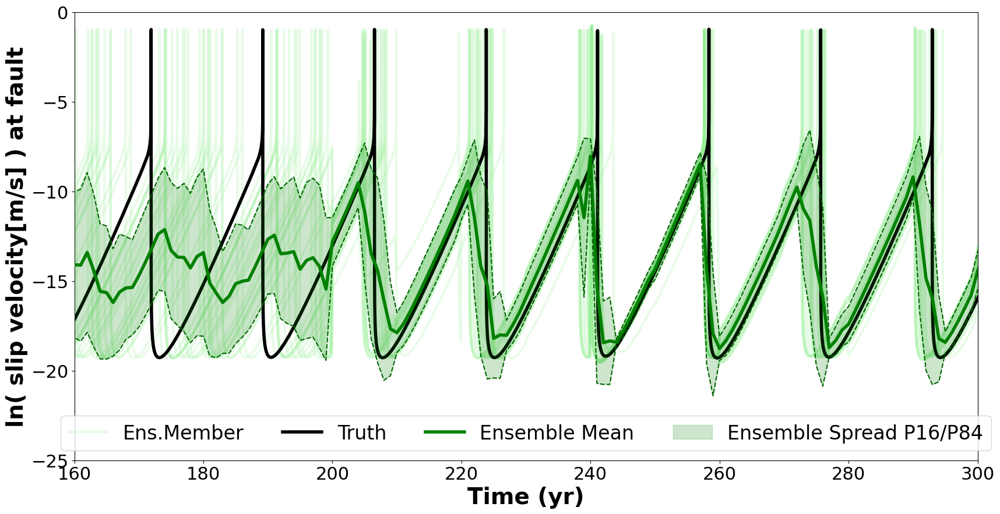

In [52]:
(
    fig,
    vel_truth_interp,
    ens_interp_mean_vel,
    ens_interp_median_vel,
    time_interp_vel,
    ens_interp_p84_vel,
) = plot_ensemble_vel_fault(ensemble_info, truth_info, time_simulation, list_obsnet)
plt.show()

In [53]:
def calculate_slip(vel_vector, time_vector):

    yr = 365.25 * 24 * 60 * 60

    cum_slip = np.zeros(vel_vector[1:].shape)

    dt_vector = (time_vector[1:] - time_vector[0:-1]) * yr
    mean_vel_vector = (vel_vector[1:] + vel_vector[0:-1]) / 2
    slip_vector = np.multiply(dt_vector, mean_vel_vector)

    for i in range(len(cum_slip) - 1):
        cum_slip[i + 1] = cum_slip[i] + slip_vector[i]

    return slip_vector, cum_slip

In [55]:
# slip_truth, cum_slip_truth = calculate_slip(vel_truth, time_truth)


# fig = plt.figure(figsize=(20, 10))
# ax = plt.gca()
# plt.plot(time_truth[0:-1], slip_truth)


# fig = plt.figure(figsize=(20, 10))
# ax = plt.gca()
# plt.plot(time_truth[0:-1], cum_slip_truth)

In [56]:
def plot_ensemble_slip_fault(ensemble_info, truth_info, time_simulation, list_obsnet):

    mem = len(ensemble_info)
    print(mem)

    time_interp_vel = np.arange(0, time_simulation, 1)
    vel_ens_interp = np.zeros((mem, time_interp_vel.shape[0]))
    slip_ens_interp = np.zeros((mem, time_interp_vel.shape[0] - 1))
    cum_slip_ens_interp = np.zeros((mem, time_interp_vel.shape[0] - 1))

    ens_interp_mean_slip = []
    ens_interp_median_slip = []
    ens_interp_cov_slip = []
    ens_interp_p16_slip = []
    ens_interp_p84_slip = []

    # Load observations

    index_obs = list_obsnet[:, 1]
    index_obs = index_obs.astype(int)
    index_obs.tolist()

    # Setup figure

    fig = plt.figure(figsize=(20, 10))
    ax = plt.gca()
    plt.xlabel("Time (yr)", fontsize=28, fontweight="bold")
    plt.ylabel("Slip at fault [m]", fontsize=28, fontweight="bold")
    plt.xticks(fontsize=22)
    plt.yticks(fontsize=22)

    time_truth = truth_info["time"]
    vel_truth = truth_info["vel"]
    slip_truth, cum_slip_truth = calculate_slip(vel_truth, time_truth)

    slip_ensemble_info, cum_slip_ensemble_info = calculate_slip(
        ensemble_info[0]["vel"], ensemble_info[0]["time"]
    )
    plt.plot(
        ensemble_info[0]["time"][0:-1],
        cum_slip_ensemble_info,
        color="lightgreen",
        linewidth=3,
        alpha=0.2,
        label="Ens.Member",
    )

    for i in range(mem):

        slip_ensemble_info, cum_slip_ensemble_info = calculate_slip(
            ensemble_info[i]["vel"], ensemble_info[i]["time"]
        )
        vel_ens_interp[i, :] = np.interp(
            time_interp_vel, ensemble_info[i]["time"], ensemble_info[i]["vel"]
        )
        #         slip_ens_interp[i,:], cum_slip_ens_interp[i,:] = calculate_slip(vel_ens_interp[i,:],time_interp_vel)

        slip_ens_interp[i, :] = np.interp(
            time_interp_vel[0:-1], ensemble_info[i]["time"][0:-1], slip_ensemble_info
        )
        cum_slip_ens_interp[i, :] = np.interp(
            time_interp_vel[0:-1],
            ensemble_info[i]["time"][0:-1],
            cum_slip_ensemble_info,
        )

        #         slip_ens_interp,cum_slip_interp=calculate_slip(vel_ens_interp[i,:],time_interp_vel)
        #  plt.plot(time_interp_vel[0:-1],cum_slip_ens_interp[i,:],color='lightblue' )

        slip_ensemble_info, cum_slip_ensemble_info = calculate_slip(
            ensemble_info[i]["vel"], ensemble_info[i]["time"]
        )
        plt.plot(
            ensemble_info[i]["time"][0:-1],
            cum_slip_ensemble_info,
            color="lightgreen",
            linewidth=3,
            alpha=0.2,
        )
    #         plt.plot(time_interp_vel, np.log10(vel_ens_interp[i,:]),color='lightgray',linewidth=3,zorder=1)

    vel_truth_interp = np.log10(np.interp(time_interp_vel, time_truth, vel_truth))
    slip_truth_interp = np.interp(time_interp_vel[0:-1], time_truth[0:-1], slip_truth)
    cum_slip_truth_interp = np.interp(
        time_interp_vel[0:-1], time_truth[0:-1], cum_slip_truth
    )

    for i in range(len(time_interp_vel) - 1):
        interp_mean_slip = np.mean(cum_slip_ens_interp[:, i])
        interp_median_slip = np.median(cum_slip_ens_interp[:, i])
        interp_std_slip = np.std(cum_slip_ens_interp[:, i], ddof=1)

        ens_interp_mean_slip.append(interp_mean_slip)
        ens_interp_median_slip.append(interp_median_slip)
        ens_interp_cov_slip.append(interp_std_slip)
        ens_interp_p16_slip.append(
            stats.norm.ppf(0.16, interp_mean_slip, interp_std_slip)
        )
        ens_interp_p84_slip.append(
            stats.norm.ppf(0.84, interp_mean_slip, interp_std_slip)
        )

    print(len(ens_interp_mean_vel))

    # Plot truth
    plt.plot(
        time_truth[0:-1],
        cum_slip_truth,
        color="k",
        label="Truth",
        linewidth=4,
        zorder=4,
    )

    # plt.plot(time_interp_vel[0:-1],ens_interp_median_slip,color='m',linewidth=4,zorder=5)

    plt.plot(
        time_interp_vel[0:-1],
        ens_interp_mean_slip,
        color="g",
        linewidth=4,
        zorder=5,
        label="Ensemble Mean",
    )
    plt.plot(
        time_interp_vel[0:-1],
        ens_interp_p16_slip,
        color="darkgreen",
        zorder=5,
        linestyle="--",
    )
    plt.plot(
        time_interp_vel[0:-1],
        ens_interp_p84_slip,
        color="darkgreen",
        zorder=5,
        linestyle="--",
    )
    ax.fill_between(
        time_interp_vel[0:-1],
        ens_interp_p16_slip,
        ens_interp_p84_slip,
        color="g",
        zorder=4,
        alpha=0.2,
        label="Ensemble Spread P16/P84",
    )

    # Plot observations
    #     obs_err=np.ones(len(index_obs))*1.5
    #     plt.errorbar(time_truth[index_obs], vel_truth[index_obs], yerr=obs_err,fmt='D',color='red', elinewidth=2 ,capsize=3,zorder=6)

    plt.ylim(0, 100)
    plt.xlim(0, 300)
    #    plt.legend(fontsize=24,loc='lower center',fancybox=True, ncol=4)
    #     plt.xlim(18000,20000)
    # fig.savefig(os.path.join(path_images,'fault_comp_members_no_filter.png'), bbox_inches='tight')
    # fig.savefig(os.path.join(path_images,'fault_comp_members_filtered.png'), bbox_inches='tight')
    # fig.savefig(os.path.join(path_images,'fault_enkf_members_plotted.png'), bbox_inches='tight')
    #     fig.savefig(os.path.join(path_images,'poster_slowslip_slip_velocity_fault.png'), bbox_inches='tight',transparent=True)

    return (
        fig,
        cum_slip_truth_interp,
        cum_slip_ens_interp,
        ens_interp_mean_slip,
        ens_interp_median_slip,
        time_interp_vel,
        ens_interp_p84_slip,
    )

20


/gpfs/home2/montero/infocus_dassim/experiments/experiments_1d/enkf_50_pub_01_fast_right_david/.venv/lib64/python3.11/site-packages/scipy/stats/_distn_infrastructure.py:2285: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/gpfs/home2/montero/infocus_dassim/experiments/experiments_1d/enkf_50_pub_01_fast_right_david/.venv/lib64/python3.11/site-packages/scipy/stats/_distn_infrastructure.py:2286: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc


1500


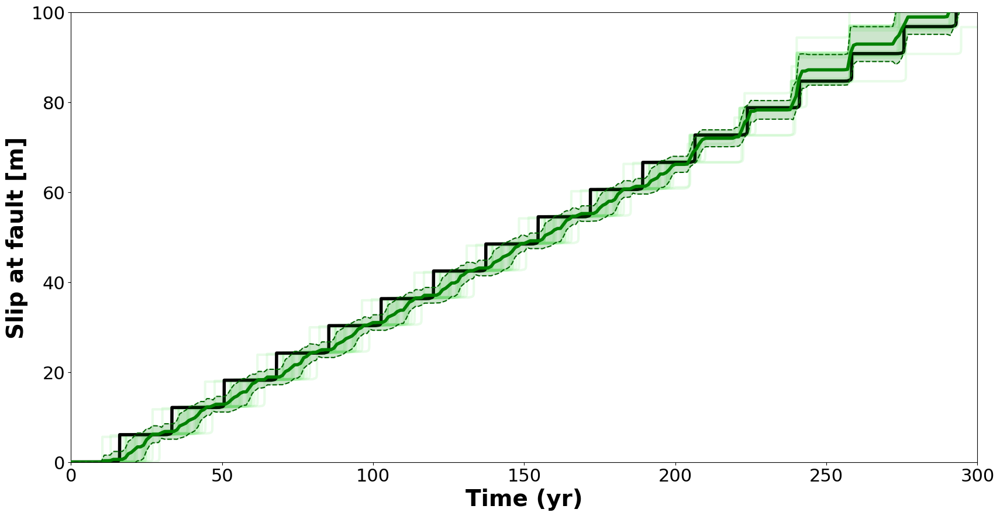

In [57]:
(
    fig,
    cum_slip_truth_interp,
    cum_slip_ens_interp,
    ens_interp_mean_slip,
    ens_interp_median_slip,
    time_interp_vel,
    ens_interp_p84_slip,
) = plot_ensemble_slip_fault(ensemble_info, truth_info, time_simulation, list_obsnet)
plt.show()

In [60]:
# for i in range(1450):

#     fig = plt.figure(figsize=(20, 10))

#     plt.xticks(fontsize=22)
#     plt.yticks(fontsize=22)
#     plt.xlabel("Slip[m]", fontsize=22)
#     plt.ylabel("Count[-]", fontsize=22)

#     time = i
#     sns.distplot(
#         cum_slip_ens_interp[:, time], rug=True, kde=False, norm_hist=False, bins=15
#     )
#     sns.distplot(
#         cum_slip_ens_interp[:, time], rug=True, kde=False, norm_hist=False, bins=20
#     )
#     sns.distplot(
#         cum_slip_ens_interp[:, time], rug=True, kde=False, norm_hist=False, bins=25
#     )
#     plt.vlines(x=ens_interp_median_slip[time], ymin=0, ymax=10, color="g", linewidth=5)
#     plt.vlines(x=cum_slip_truth_interp[time], ymin=0, ymax=10, color="k", linewidth=5)

#     path_images = "./images_results/histogram_earthquake_slip"
#     fig.savefig(
#         os.path.join(path_images, "histograms_earthquake_slip" + str(i) + "_years.png"),
#         bbox_inches="tight",
#     )


# #

/scratch-local/montero/ipykernel_1608914/2460212857.py:11: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(
/scratch-local/montero/ipykernel_1608914/2460212857.py:14: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(
/scratch-local/montero/ipykernel_1608914/2460212857.py:17: UserWarning: 

`distplot`

FileNotFoundError: [Errno 2] No such file or directory: '/gpfs/scratch1/shared/montero/test_david/infocus_dassim/experiments/experiments_1d/enkf_50_pub_01_fast_right_david/images_results/histogram_earthquake_slip/histograms_earthquake_slip0_years.png'

/scratch-local/montero/ipykernel_390999/3347649277.py:7: RuntimeWarning: invalid value encountered in scalar divide
  mae[i] = cum_ae / i


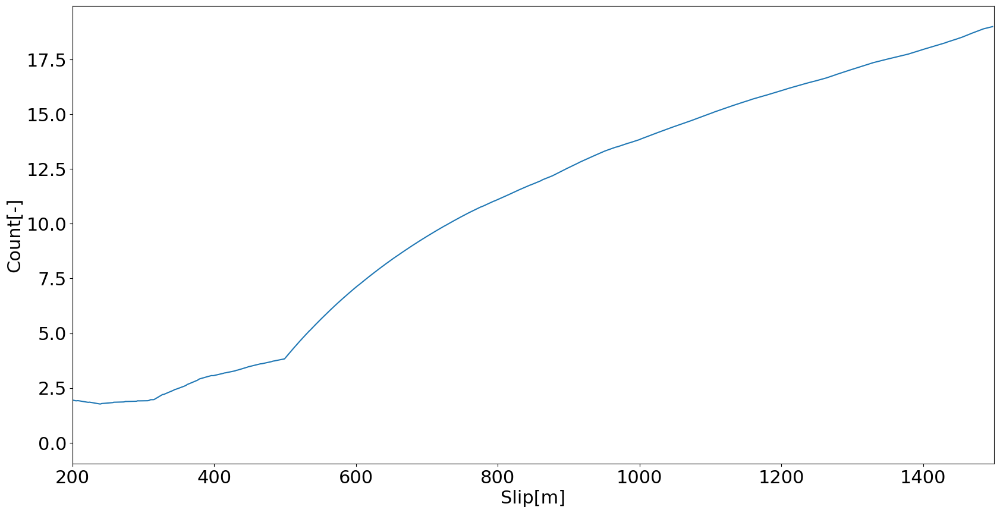

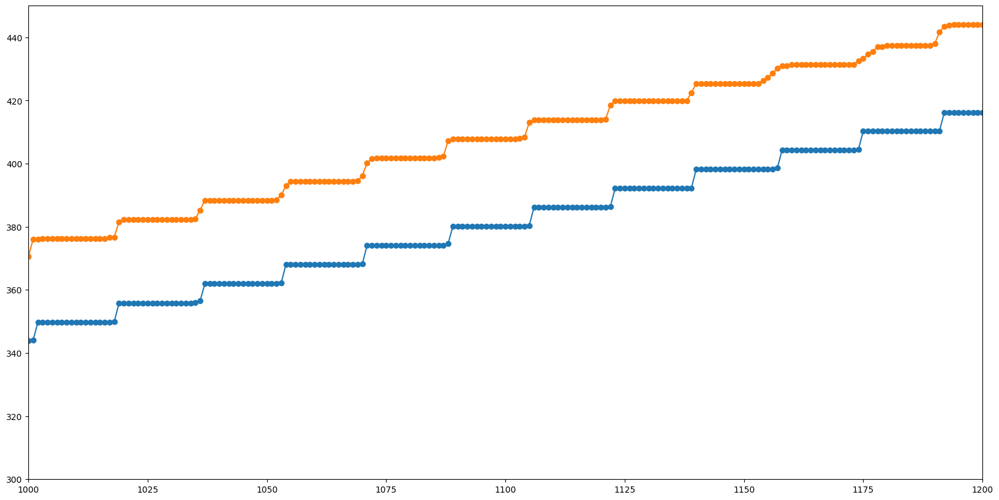

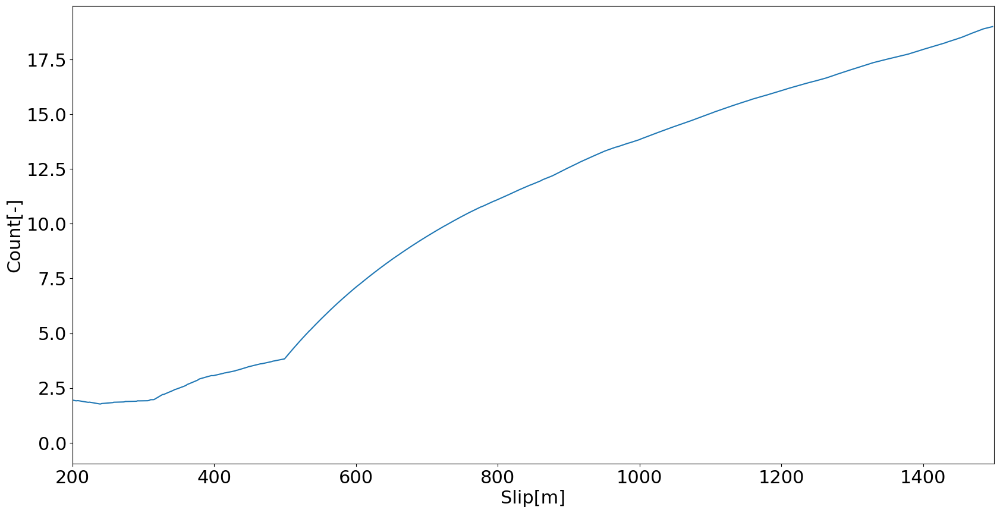

In [61]:
ae = np.abs(ens_interp_mean_slip - cum_slip_truth_interp)
mae = np.zeros(ae.shape)

cum_ae = 0
for i in range(0, mae.shape[0], 1):
    cum_ae = cum_ae + ae[i]
    mae[i] = cum_ae / i

fig = plt.figure(figsize=(20, 10))

plt.xticks(fontsize=22)
plt.yticks(fontsize=22)
plt.xlabel("Slip[m]", fontsize=22)
plt.ylabel("Count[-]", fontsize=22)

plt.plot(time_interp_vel[0:-1], mae)
plt.xlim(200, 1500)
plt.show()

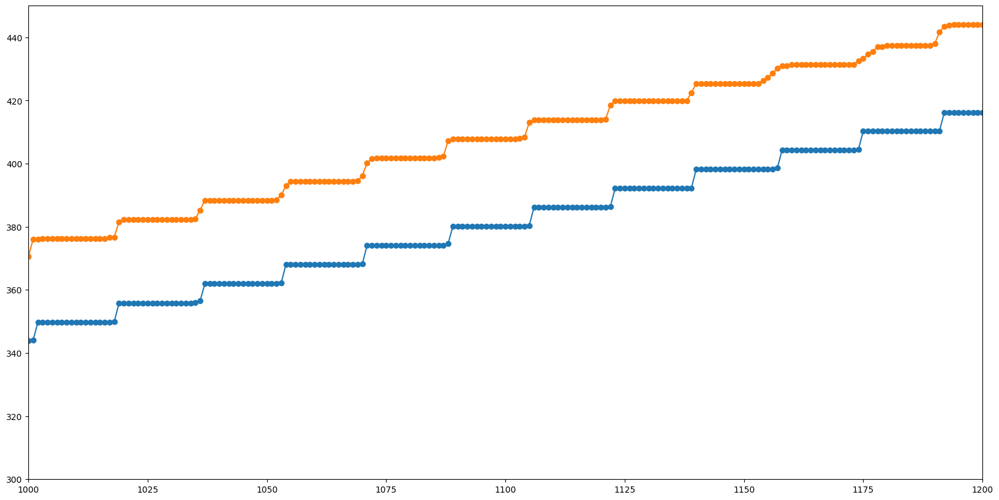

In [62]:
fig = plt.figure(figsize=(20, 10))
ax = plt.gca()

plt.scatter(time_interp_vel[0:-1], cum_slip_truth_interp)
plt.plot(time_interp_vel[0:-1], cum_slip_truth_interp)
plt.scatter(time_interp_vel[0:-1], ens_interp_mean_slip)
plt.plot(time_interp_vel[0:-1], ens_interp_mean_slip)
plt.xlim(1000, 1200)
plt.ylim(300, 450)
plt.show()

In [63]:
time_interp_vel = np.arange(0, time_simulation, 1)
vel_ens_interp = np.zeros((mem, time_interp_vel.shape[0]))

ens_interp_mean_vel = []
ens_interp_median_vel = []
ens_interp_std_vel = []

# Load observations

index_obs = list_obsnet[:, 1]
index_obs = index_obs.astype(int)
index_obs.tolist()

time_truth = truth_info["time"]
vel_truth = truth_info["vel"]

vel_max = np.max(np.log10(vel_truth))
vel_min = np.min(np.log10(vel_truth))

for i in range(mem):
    vel_ens_interp[i, :] = np.interp(
        time_interp_vel, ensemble_info[i]["time"], ensemble_info[i]["vel"]
    )

vel_truth_interp = np.interp(time_interp_vel, time_truth, vel_truth)

for i in range(len(time_interp_vel)):
    interp_mean_vel = np.mean(np.log10(vel_ens_interp[:, i]))
    interp_median_vel = np.median(np.log10(vel_ens_interp[:, i]))
    interp_std_vel = np.std(np.log10(vel_ens_interp[:, i]), ddof=1)

    ens_interp_mean_vel.append(interp_mean_vel)
    ens_interp_median_vel.append(interp_median_vel)
    ens_interp_std_vel.append(interp_std_vel)

# Plot observations
obs_err = np.ones(len(index_obs)) * 1.5

absolute_error_mean_vel = np.abs(
    np.log10(vel_truth_interp) - np.array(ens_interp_mean_vel)
)
absolute_error_median_vel = np.abs(
    np.log10(vel_truth_interp) - np.array(ens_interp_median_vel)
)

/scratch-local/montero/ipykernel_390999/1645944038.py:24: RuntimeWarning: divide by zero encountered in scalar divide
  rmse_error_mean_vel[i] = np.sqrt(cum_error_mean_vel / i)
/scratch-local/montero/ipykernel_390999/1645944038.py:27: RuntimeWarning: invalid value encountered in scalar divide
  rmse_error_median_vel[i] = np.sqrt(cum_error_median_vel / i)
/scratch-local/montero/ipykernel_390999/1645944038.py:30: RuntimeWarning: divide by zero encountered in scalar divide
  mae_error_mean_vel[i] = cum_ae_error_mean_vel / i
/scratch-local/montero/ipykernel_390999/1645944038.py:33: RuntimeWarning: invalid value encountered in scalar divide
  mae_error_median_vel[i] = cum_ae_error_median_vel / i


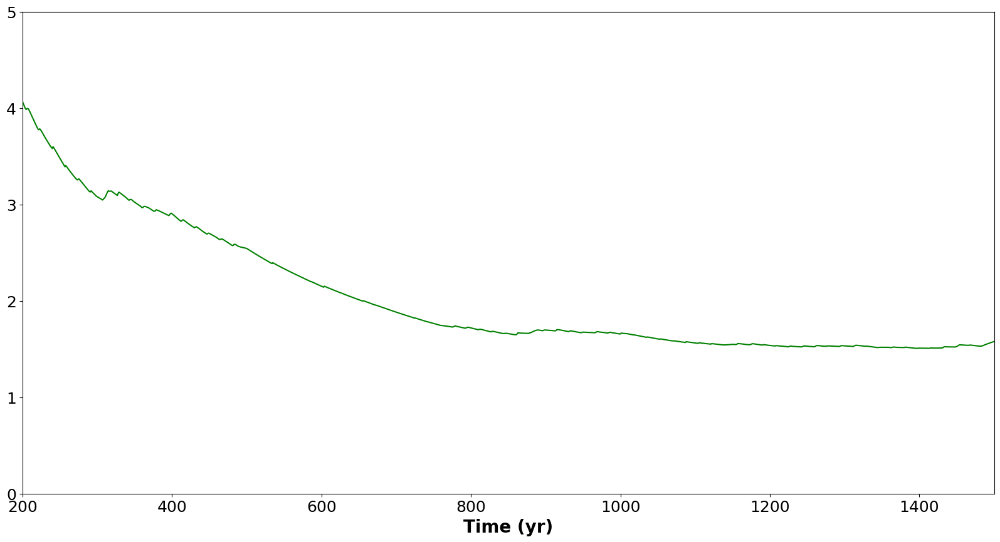

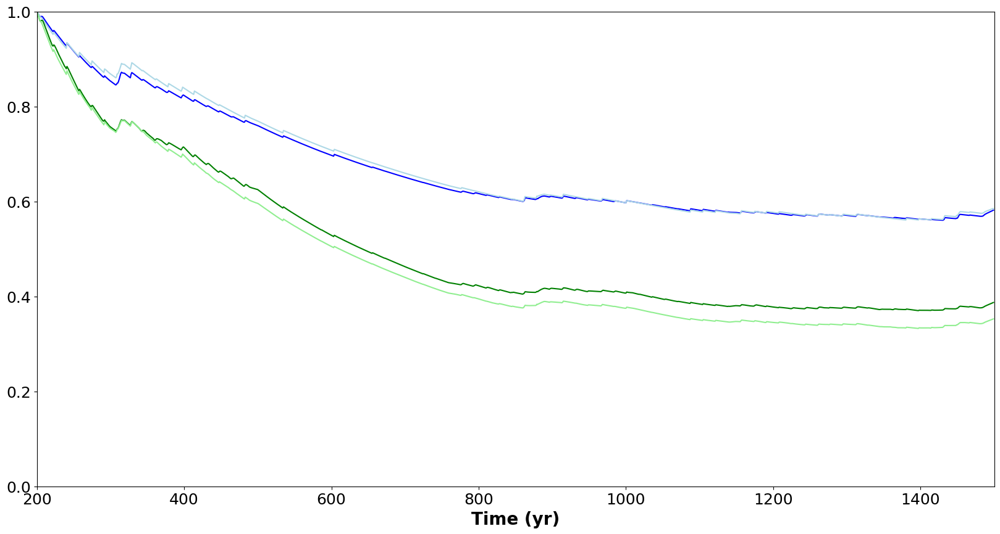

In [64]:
mse_error_mean_vel = np.log10(vel_truth_interp) - np.array(ens_interp_mean_vel)
mse_error_median_vel = np.log10(vel_truth_interp) - np.array(ens_interp_median_vel)

cum_error_mean_vel = 0
cum_error_median_vel = 0
rmse_error_mean_vel = np.zeros(len(mse_error_mean_vel))
rmse_error_median_vel = np.zeros(len(mse_error_median_vel))


ae_error_mean_vel = np.abs(np.log10(vel_truth_interp) - np.array(ens_interp_mean_vel))
ae_error_median_vel = np.abs(
    np.log10(vel_truth_interp) - np.array(ens_interp_median_vel)
)

cum_ae_error_mean_vel = 0
cum_ae_error_median_vel = 0
mae_error_mean_vel = np.zeros(len(ae_error_mean_vel))
mae_error_median_vel = np.zeros(len(ae_error_median_vel))


for i in range(len(mse_error_mean_vel)):

    cum_error_mean_vel = cum_error_mean_vel + mse_error_mean_vel[i] ** 2
    rmse_error_mean_vel[i] = np.sqrt(cum_error_mean_vel / i)

    cum_error_median_vel = cum_error_median_vel + mse_error_median_vel[i] ** 2
    rmse_error_median_vel[i] = np.sqrt(cum_error_median_vel / i)

    cum_ae_error_mean_vel = cum_ae_error_mean_vel + ae_error_mean_vel[i]
    mae_error_mean_vel[i] = cum_ae_error_mean_vel / i

    cum_ae_error_median_vel = cum_ae_error_median_vel + ae_error_median_vel[i]
    mae_error_median_vel[i] = cum_ae_error_median_vel / i

fig = plt.figure(figsize=(20, 10))

plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

# plt.plot(time_interp_vel,rmse_error_mean_vel,color='g')
# plt.plot(time_interp_vel,rmse_error_median_vel,color='lightblue')
plt.plot(time_interp_vel, mae_error_mean_vel, color="g")
# plt.plot(time_interp_vel,mae_error_median_vel,color='lightgreen')
plt.ylim(0, 5)
plt.xlim(200, 1500)

plt.xlabel("Time (yr)", fontsize=20, fontweight="bold")
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)


# print(rmse_error_mean_vel[700])
# print(rmse_error_mean_vel[800])
# print(rmse_error_mean_vel[900])
# print(rmse_error_mean_vel[1000])
# print(rmse_error_mean_vel[1200])

# nrmse_error_mean_vel=rmse_error_mean_vel/np.abs(vel_max-vel_min)
# nrmse_error_median_vel=rmse_error_median_vel/np.abs(vel_max-vel_min)
# nmae_error_mean_vel=mae_error_mean_vel/np.abs(vel_max-vel_min)
# nmae_error_median_vel=mae_error_median_vel/np.abs(vel_max-vel_min)

nrmse_error_mean_vel = rmse_error_mean_vel / rmse_error_mean_vel[200]
nrmse_error_median_vel = rmse_error_median_vel / rmse_error_median_vel[200]
nmae_error_mean_vel = mae_error_mean_vel / mae_error_mean_vel[200]
nmae_error_median_vel = mae_error_median_vel / mae_error_median_vel[200]

fig = plt.figure(figsize=(20, 10))

plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

plt.plot(time_interp_vel, nrmse_error_mean_vel, color="b")
plt.plot(time_interp_vel, nrmse_error_median_vel, color="lightblue")
plt.plot(time_interp_vel, nmae_error_mean_vel, color="g")
plt.plot(time_interp_vel, nmae_error_median_vel, color="lightgreen")
plt.ylim(0, 1)
plt.xlim(200, 1500)

plt.xlabel("Time (yr)", fontsize=20, fontweight="bold")
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()

In [55]:
# # absolute_error_mean=np.abs(tau_truth_interp-np.array(ens_interp_mean))
# # absolute_error_median=np.abs(tau_truth_interp-np.array(ens_interp_median))

# t_cutoff_vect=np.arange(37000,50000,100)

# for j in range(len(t_cutoff_vect)):


#     t_cutoff=t_cutoff_vect[j]

#     print(t_cutoff)

#     fig=plt.figure(figsize=(20,20))

#     plt.subplot(311)

#     plt.vlines(t_cutoff,ymin=-25,ymax=1,color='r',linewidth=5)
#     plt.plot(time_interp[t_cutoff-2000:t_cutoff+2000],np.log10(vel_ens_interp[0,t_cutoff-2000:t_cutoff+2000]),color='lightgray',alpha=0.3,label='ens. member')
#     for i in range(1,mem,1):
#         plt.plot(time_interp[t_cutoff-2000:t_cutoff+2000],np.log10(vel_ens_interp[i,t_cutoff-2000:t_cutoff+2000]),color='lightgray',alpha=0.3)
#     plt.plot(time_interp[t_cutoff-2000:t_cutoff+2000],np.log10(vel_truth_interp[t_cutoff-2000:t_cutoff+2000]),color='k',label='truth')
#     plt.plot(time_interp[t_cutoff-2000:t_cutoff+2000],ens_interp_median[t_cutoff-2000:t_cutoff+2000],color='m',label='median')
#     plt.plot(time_interp[t_cutoff-2000:t_cutoff+2000],ens_interp_mean[t_cutoff-2000:t_cutoff+2000],color='g',label='mean')

#     if(t_cutoff<=7000):
#         plt.vlines(5000,ymin=-25,ymax=1,color='saddlebrown',linewidth=5,label='Start data assimilation')


#     plt.legend(fontsize=12,loc=1)
#     plt.xticks(fontsize=12,)
#     plt.yticks(fontsize=12)

# #     print(tau_ens_interp.shape)
# #     print(tau_truth_interp.shape)

#     plt.xlabel('Time (year)',fontsize=15,fontweight='bold')
#     plt.ylabel('Log(Velocity(m/s))',fontsize=15,fontweight='bold')

#     plt.subplot(313)

#     # fig=plt.figure(figsize=(20,10))
#     plt.hist(np.log10(vel_ens_interp[:,t_cutoff]),color='lightgray',bins=10,label='Bins=10',density=True,alpha=0.5)
#     plt.hist(np.log10(vel_ens_interp[:,t_cutoff]),color='silver',bins=15,label='Bins=15',density=True,alpha=0.5)
#     plt.hist(np.log10(vel_ens_interp[:,t_cutoff]),color='gray',bins=20,label='Bins=20',density=True,alpha=0.5)
#     plt.hist(np.log10(vel_ens_interp[:,t_cutoff]),color='dimgray',bins=25,label='Bins=25',density=True,alpha=0.5)

#     plt.vlines(np.mean(np.log10(vel_ens_interp[:,t_cutoff])),ymin=0,ymax=0.5,color='g',linewidth=5,label='mean')
#     plt.vlines(np.median(np.log10(vel_ens_interp[:,t_cutoff])),ymin=0,ymax=0.5,color='m',linewidth=5,label='median')
#     plt.vlines(np.log10(vel_truth_interp[t_cutoff]),ymin=0,ymax=0.5,color='k',linewidth=5,label='truth')

#     plt.legend(fontsize=12,loc=1)
#     plt.xticks(fontsize=12)
#     plt.yticks(fontsize=12)

#     plt.xlabel('Log(Velocity(m/s))',fontsize=15,fontweight='bold')
#     plt.ylabel('PDF',fontsize=15,fontweight='bold')

#     plt.xlim(-25,1)

#     plt.subplot(312)

#     plt.plot(time_interp[t_cutoff-2000:t_cutoff+2000],absolute_error_mean[t_cutoff-2000:t_cutoff+2000],color='g',linewidth=2,label='Absolute Error Mean')
#     plt.plot(time_interp[t_cutoff-2000:t_cutoff+2000],absolute_error_median[t_cutoff-2000:t_cutoff+2000],color='m',linewidth=2,label='Absolute Error Median')
#     plt.plot(time_interp[t_cutoff-2000:t_cutoff+2000],ens_interp_std[t_cutoff-2000:t_cutoff+2000],color='peru',linewidth=2,label='Standard Deviation')
#     plt.vlines(t_cutoff,ymin=0,ymax=14,color='r',linewidth=5)
#     if(t_cutoff<=7000):
#         plt.vlines(5000,ymin=0,ymax=14,color='saddlebrown',linewidth=5,label='Start data assimilation')

#     plt.xlabel('Time (year)',fontsize=15,fontweight='bold')
# #     plt.ylabel('Shear stress at the fault (MPa)',fontsize=15,fontweight='bold')

#     plt.legend(fontsize=12,loc=1)
#     plt.xticks(fontsize=12,)
#     plt.yticks(fontsize=12)

#     fig.savefig(os.path.join(path_images,'movie_vel','vel'+str(t_cutoff).zfill(5)+'.png'), bbox_inches='tight')

#     plt.ioff()

In [65]:
def plot_ensemble_theta_fault(ensemble_info, truth_info, time_simulation, list_obsnet):

    mem = len(ensemble_info)
    print(mem)

    time_interp_theta = np.arange(0, time_simulation, 1)
    theta_ens_interp = np.zeros((mem, time_interp_theta.shape[0]))

    ens_interp_mean_theta = []
    ens_interp_median_theta = []
    ens_interp_cov_theta = []
    ens_interp_p16_theta = []
    ens_interp_p84_theta = []

    # Load observations

    index_obs = list_obsnet[:, 1]
    index_obs = index_obs.astype(int)
    index_obs.tolist()

    # Setup figure

    fig = plt.figure(figsize=(20, 10))
    ax = plt.gca()
    plt.xlabel("Time (yr)", fontsize=20, fontweight="bold")
    plt.ylabel("Contact age (yr)", fontsize=20, fontweight="bold")
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)

    time_truth = truth_info["time"]
    theta_truth = truth_info["theta"]

    for i in range(mem):
        theta_ens_interp[i, :] = np.interp(
            time_interp_theta, ensemble_info[i]["time"], ensemble_info[i]["theta"]
        )
        #         if(min(tau_ens_interp[i,:])<4):
        #             ens_wrong.append(i)
        plt.plot(
            ensemble_info[i]["time"],
            np.log10(ensemble_info[i]["theta"] / yr),
            color="lightgreen",
            linewidth=3,
            alpha=0.2,
        )
    #         plt.semilogy(time_interp, theta_ens_interp[i,:]/yr,color='lightgreen',linewidth=3,zorder=1)

    theta_truth_interp = np.interp(time_interp_theta, time_truth, theta_truth / yr)

    for i in range(len(time_interp_theta)):
        interp_mean_theta = np.log10(np.mean(theta_ens_interp[:, i]) / yr)
        interp_median_theta = np.log10(np.median(theta_ens_interp[:, i]) / yr)
        interp_std_theta = np.log10(np.std(theta_ens_interp[:, i], ddof=1) / yr)

        ens_interp_mean_theta.append(interp_mean_theta)
        ens_interp_median_theta.append(interp_median_theta)
        ens_interp_cov_theta.append(interp_std_theta)
        ens_interp_p16_theta.append(
            stats.norm.ppf(0.16, interp_mean_theta, interp_std_theta)
        )
        ens_interp_p84_theta.append(
            stats.norm.ppf(0.84, interp_mean_theta, interp_std_theta)
        )

    print(len(ens_interp_mean_theta))

    # Plot truth
    plt.plot(
        time_truth,
        np.log10(theta_truth / yr),
        color="k",
        label="Truth",
        linewidth=4,
        zorder=4,
    )

    #     plt.plot(time_interp_theta,ens_interp_median_theta,color='m',linewidth=4,zorder=5)
    plt.plot(time_interp_theta, ens_interp_mean_theta, color="g", linewidth=4, zorder=5)
    plt.plot(
        time_interp_theta,
        ens_interp_p16_theta,
        color="darkgreen",
        zorder=5,
        linestyle="--",
    )
    plt.plot(
        time_interp_theta,
        ens_interp_p84_theta,
        color="darkgreen",
        zorder=5,
        linestyle="--",
    )
    ax.fill_between(
        time_interp_theta,
        ens_interp_p16_theta,
        ens_interp_p84_theta,
        color="g",
        zorder=4,
        alpha=0.3,
    )

    # Plot observations
    #     obs_err=np.ones(len(index_obs))*1.5
    #     plt.errorbar(time_truth[index_obs], theta_truth[index_obs], yerr=obs_err,fmt='D',color='red', elinewidth=2 ,capsize=3,zorder=6)

    # plt.xlim(0,10000)
    plt.xlim(160, 300)
    # fig.savefig(os.path.join(path_images,'fault_comp_members_no_filter.png'), bbox_inches='tight')
    # fig.savefig(os.path.join(path_images,'fault_comp_members_filtered.png'), bbox_inches='tight')
    # fig.savefig(os.path.join(path_images,'fault_enkf_members_plotted.png'), bbox_inches='tight')
    # fig.savefig(os.path.join(path_images,'fault_enkf_members_filtered.png'), bbox_inches='tight')

    return (
        fig,
        theta_truth_interp,
        ens_interp_mean_theta,
        ens_interp_median_theta,
        time_interp_theta,
        ens_interp_p84_theta,
    )

20
1500


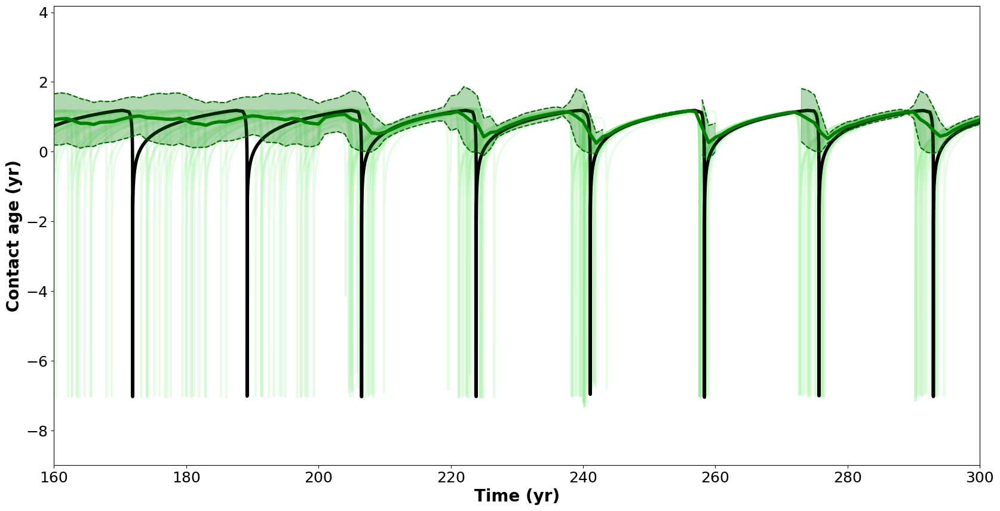

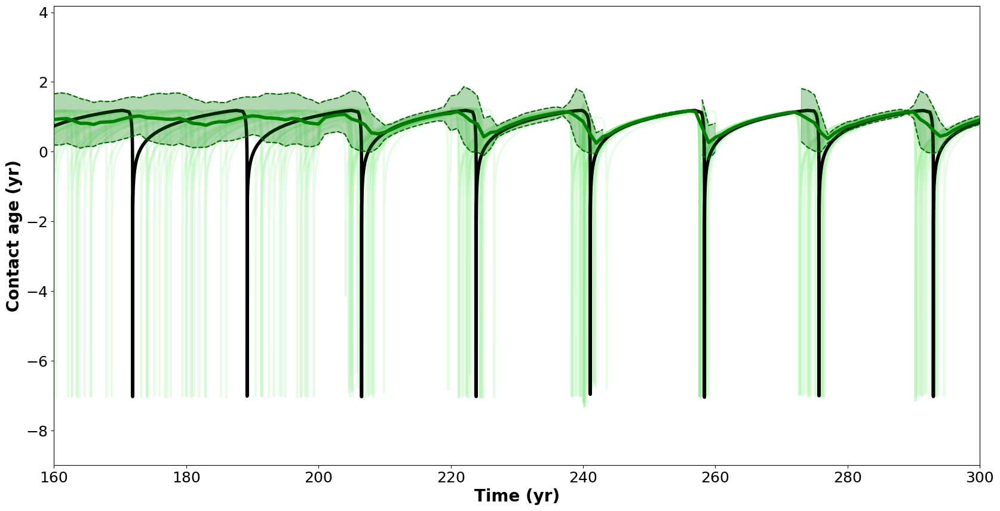

In [67]:
(
    fig,
    theta_truth_interp,
    ens_interp_mean_theta,
    ens_interp_median_theta,
    time_interp_theta,
    ens_interp_p84_theta,
) = plot_ensemble_theta_fault(ensemble_info, truth_info, time_simulation, list_obsnet)
plt.show()

In [68]:
theta_truth = truth_info["theta"]
time_truth = truth_info["time"]
peaks_theta_truth = find_peaks_seismic_cycle_theta(theta_truth)
peaks_tau_truth = find_peaks_seismic_cycle_tau(tau_truth)

[]


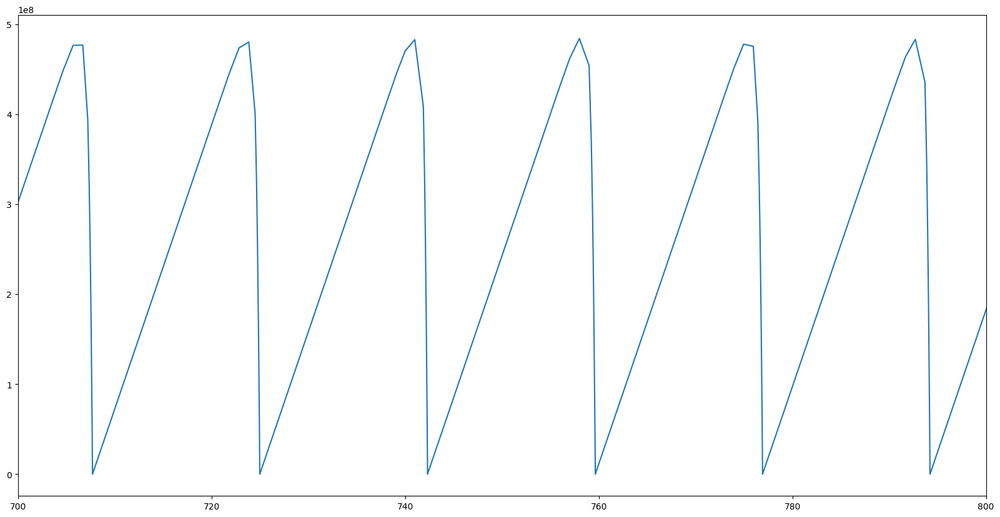

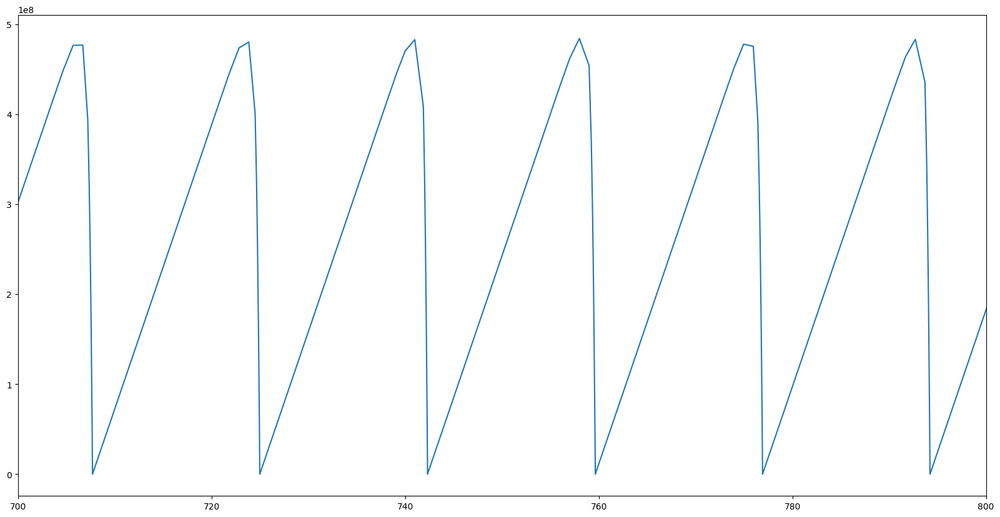

In [70]:
print(peaks_theta_truth)
fig = plt.figure(figsize=(20, 10))
plt.plot(time_truth, theta_truth)
plt.xlim(700, 800)
plt.show()

In [71]:
fig = plt.figure(figsize=(20, 10))

plt.plot(time_truth, np.log10(theta_truth))
plt.plot(time_truth, np.log10(vel_truth))
plt.plot(time_truth, tau_truth)

plt.vlines(
    time_truth[peaks_tau_truth],
    ymin=-30,
    ymax=30,
    color="g",
    linestyles="dashed",
    linewidth=2,
    label="True event",
)
plt.vlines(
    time_truth[peaks_theta_truth],
    ymin=-30,
    ymax=30,
    color="b",
    linestyles="dashed",
    linewidth=2,
    label="True event",
)
plt.vlines(
    time_truth[peaks_vel_truth],
    ymin=-30,
    ymax=30,
    color="r",
    linestyles="dashed",
    linewidth=2,
    label="True event",
)

plt.xlim(0, 2000)
plt.show()

NameError: name 'peaks_vel_truth' is not defined

In [72]:
time_interp_theta = np.arange(0, time_simulation, 1)
theta_ens_interp = np.zeros((mem, time_interp_theta.shape[0]))

ens_interp_mean_theta = []
ens_interp_median_theta = []
ens_interp_std_theta = []

# Load observations

index_obs = list_obsnet[:, 1]
index_obs = index_obs.astype(int)
index_obs.tolist()

time_truth = truth_info["time"]
theta_truth = truth_info["theta"]

theta_max = np.max(np.log10(theta_truth))
theta_min = np.min(np.log10(theta_truth))

for i in range(mem):
    theta_ens_interp[i, :] = np.interp(
        time_interp_theta, ensemble_info[i]["time"], ensemble_info[i]["theta"]
    )

theta_truth_interp = np.interp(time_interp_theta, time_truth, theta_truth)

for i in range(len(time_interp_theta)):
    interp_mean_theta = np.mean(np.log10(theta_ens_interp[:, i]))
    interp_median_theta = np.median(np.log10(theta_ens_interp[:, i]))
    interp_std_theta = np.std(np.log10(theta_ens_interp[:, i]), ddof=1)

    ens_interp_mean_theta.append(interp_mean_theta)
    ens_interp_median_theta.append(interp_median_theta)
    ens_interp_std_theta.append(interp_std_theta)

# Plot observations
obs_err = np.ones(len(index_obs)) * 1.5

absolute_error_mean_theta = np.abs(
    np.log10(theta_truth_interp) - np.array(ens_interp_mean_theta)
)
absolute_error_median_theta = np.abs(
    np.log10(theta_truth_interp) - np.array(ens_interp_median_theta)
)

/scratch-local/montero/ipykernel_390999/2604968663.py:28: RuntimeWarning: divide by zero encountered in scalar divide
  rmse_error_mean_theta[i] = np.sqrt(cum_error_mean_theta / i)
/scratch-local/montero/ipykernel_390999/2604968663.py:31: RuntimeWarning: divide by zero encountered in scalar divide
  rmse_error_median_theta[i] = np.sqrt(cum_error_median_theta / i)
/scratch-local/montero/ipykernel_390999/2604968663.py:34: RuntimeWarning: divide by zero encountered in scalar divide
  mae_error_mean_theta[i] = cum_ae_error_mean_theta / i
/scratch-local/montero/ipykernel_390999/2604968663.py:37: RuntimeWarning: divide by zero encountered in scalar divide
  mae_error_median_theta[i] = cum_ae_error_median_theta / i


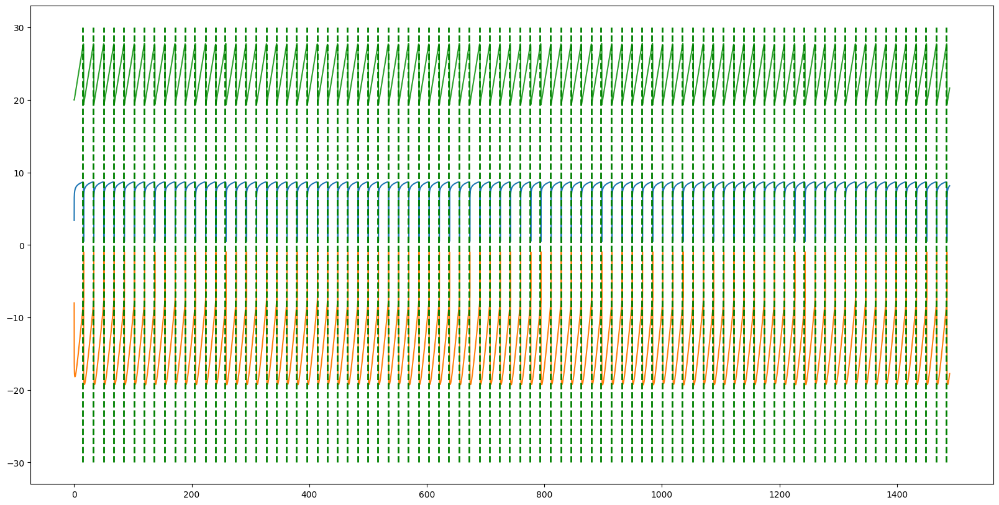

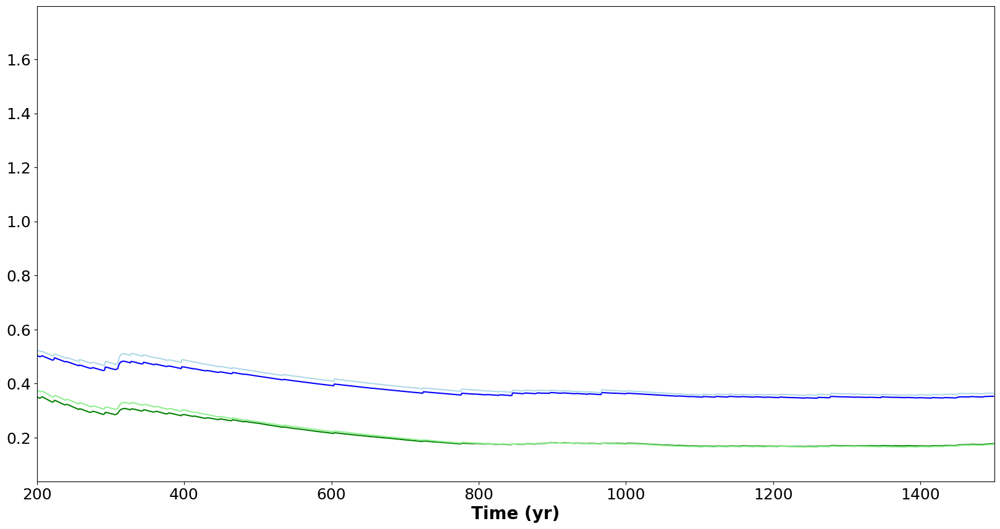

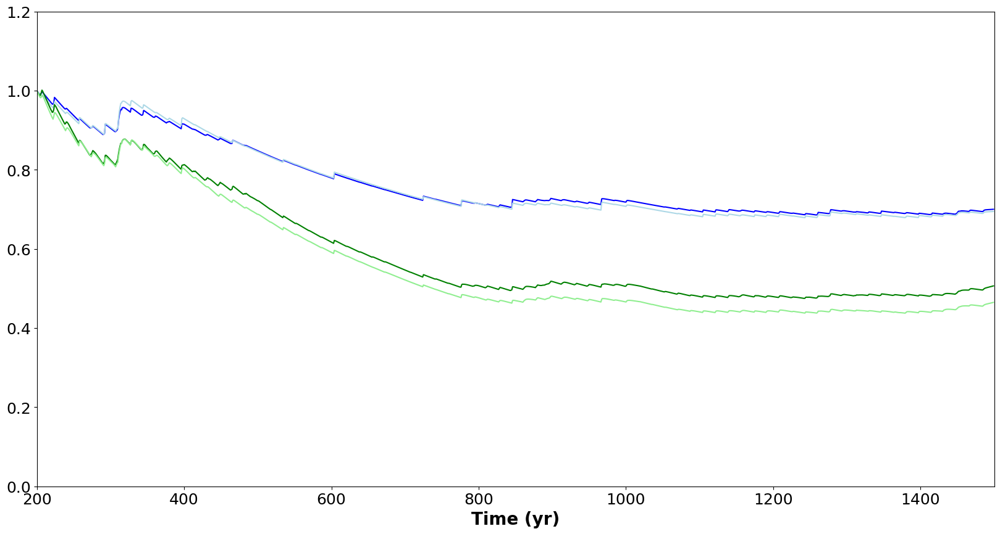

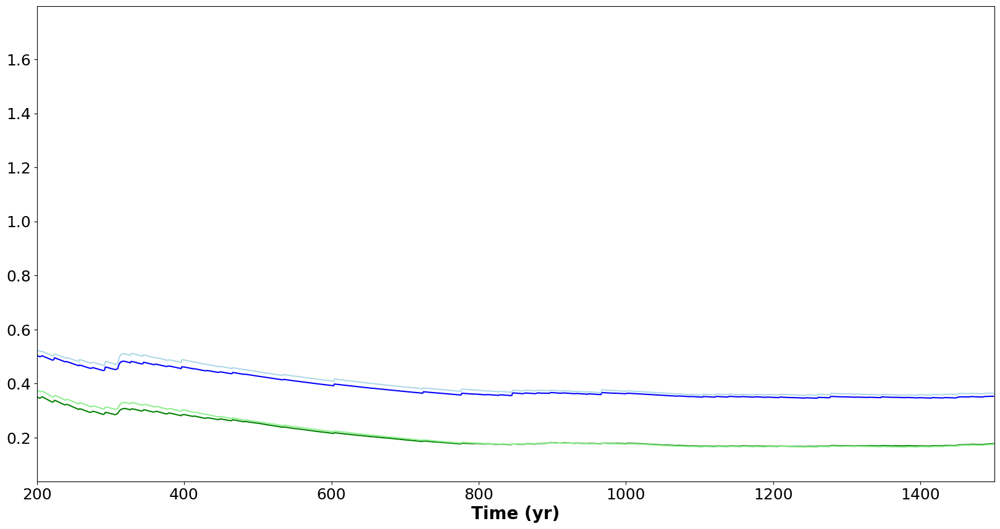

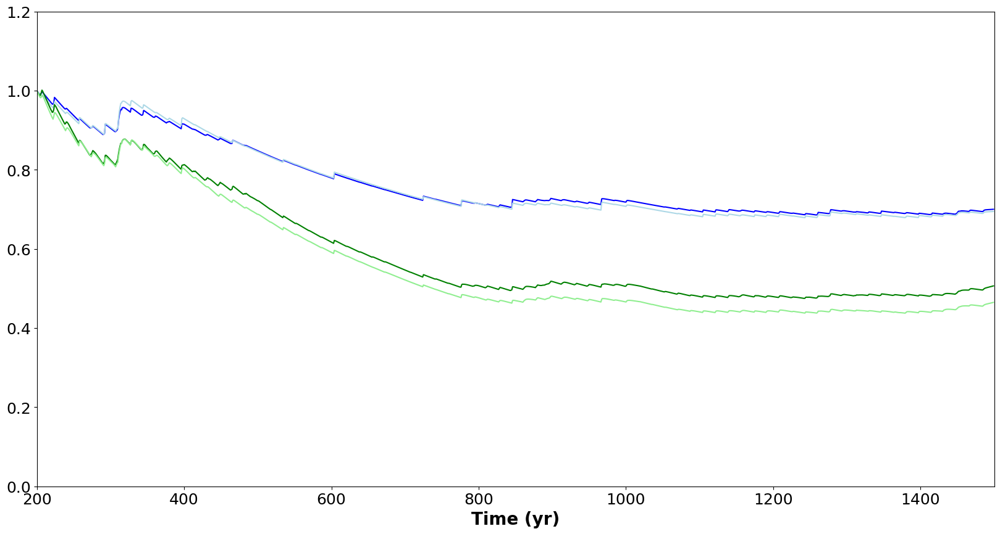

In [74]:
mse_error_mean_theta = np.log10(theta_truth_interp) - np.array(ens_interp_mean_theta)
mse_error_median_theta = np.log10(theta_truth_interp) - np.array(
    ens_interp_median_theta
)

cum_error_mean_theta = 0
cum_error_median_theta = 0
rmse_error_mean_theta = np.zeros(len(mse_error_mean_theta))
rmse_error_median_theta = np.zeros(len(mse_error_median_theta))


ae_error_mean_theta = np.abs(
    np.log10(theta_truth_interp) - np.array(ens_interp_mean_theta)
)
ae_error_median_theta = np.abs(
    np.log10(theta_truth_interp) - np.array(ens_interp_median_theta)
)

cum_ae_error_mean_theta = 0
cum_ae_error_median_theta = 0
mae_error_mean_theta = np.zeros(len(ae_error_mean_theta))
mae_error_median_theta = np.zeros(len(ae_error_median_theta))


for i in range(len(mse_error_mean_theta)):

    cum_error_mean_theta = cum_error_mean_theta + mse_error_mean_theta[i] ** 2
    rmse_error_mean_theta[i] = np.sqrt(cum_error_mean_theta / i)

    cum_error_median_theta = cum_error_median_theta + mse_error_median_theta[i] ** 2
    rmse_error_median_theta[i] = np.sqrt(cum_error_median_theta / i)

    cum_ae_error_mean_theta = cum_ae_error_mean_theta + ae_error_mean_theta[i]
    mae_error_mean_theta[i] = cum_ae_error_mean_theta / i

    cum_ae_error_median_theta = cum_ae_error_median_theta + ae_error_median_theta[i]
    mae_error_median_theta[i] = cum_ae_error_median_theta / i

fig = plt.figure(figsize=(20, 10))

plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

plt.plot(time_interp_theta, rmse_error_mean_theta, color="b")
plt.plot(time_interp_theta, rmse_error_median_theta, color="lightblue")
plt.plot(time_interp_theta, mae_error_mean_theta, color="g")
plt.plot(time_interp_theta, mae_error_median_theta, color="lightgreen")
# plt.ylim(0,5)
plt.xlim(200, 1500)

plt.xlabel("Time (yr)", fontsize=20, fontweight="bold")
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()

# print(rmse_error_mean_theta[10000])
# print(rmse_error_mean_theta[20000])
# print(rmse_error_mean_theta[30000])
# print(rmse_error_mean_theta[40000])
# print(rmse_error_mean_theta[45000])

nrmse_error_mean_theta = rmse_error_mean_theta / rmse_error_mean_theta[200]
nrmse_error_median_theta = rmse_error_median_theta / rmse_error_median_theta[200]
nmae_error_mean_theta = mae_error_mean_theta / mae_error_mean_theta[200]
nmae_error_median_theta = mae_error_median_theta / mae_error_median_theta[200]


fig = plt.figure(figsize=(20, 10))

plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

plt.plot(time_interp_theta, nrmse_error_mean_theta, color="b")
plt.plot(time_interp_theta, nrmse_error_median_theta, color="lightblue")
plt.plot(time_interp_theta, nmae_error_mean_theta, color="g")
plt.plot(time_interp_theta, nmae_error_median_theta, color="lightgreen")
plt.ylim(0, 1.2)
plt.xlim(200, 1500)

plt.xlabel("Time (yr)", fontsize=20, fontweight="bold")
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()

In [ ]:
# # absolute_error_mean=np.abs(tau_truth_interp-np.array(ens_interp_mean))
# # absolute_error_median=np.abs(tau_truth_interp-np.array(ens_interp_median))

# t_cutoff_vect=np.arange(20000,50000,100)

# for j in range(len(t_cutoff_vect)):


#     t_cutoff=t_cutoff_vect[j]

#     print(t_cutoff)

#     fig=plt.figure(figsize=(20,20))

#     plt.subplot(311)

#     plt.vlines(t_cutoff,ymin=4,ymax=12,color='r',linewidth=5)
#     plt.plot(time_interp[t_cutoff-2000:t_cutoff+2000],np.log10(theta_ens_interp[0,t_cutoff-2000:t_cutoff+2000]),color='lightgray',alpha=0.3,label='ens. member')
#     for i in range(1,mem,1):
#         plt.plot(time_interp[t_cutoff-2000:t_cutoff+2000],np.log10(theta_ens_interp[i,t_cutoff-2000:t_cutoff+2000]),color='lightgray',alpha=0.3)
#     plt.plot(time_interp[t_cutoff-2000:t_cutoff+2000],np.log10(theta_truth_interp[t_cutoff-2000:t_cutoff+2000]),color='k',label='truth')
#     plt.plot(time_interp[t_cutoff-2000:t_cutoff+2000],ens_interp_median[t_cutoff-2000:t_cutoff+2000],color='m',label='median')
#     plt.plot(time_interp[t_cutoff-2000:t_cutoff+2000],ens_interp_mean[t_cutoff-2000:t_cutoff+2000],color='g',label='mean')

#     if(t_cutoff<=7000):
#         plt.vlines(5000,ymin=4,ymax=12,color='saddlebrown',linewidth=5,label='Start data assimilation')


#     plt.legend(fontsize=12,loc=1)
#     plt.xticks(fontsize=12,)
#     plt.yticks(fontsize=12)

# #     print(tau_ens_interp.shape)
# #     print(tau_truth_interp.shape)

#     plt.xlabel('Time (year)',fontsize=15,fontweight='bold')
#     plt.ylabel('Log(Theta(s))',fontsize=15,fontweight='bold')

#     plt.subplot(313)

#     # fig=plt.figure(figsize=(20,10))
#     plt.hist(np.log10(theta_ens_interp[:,t_cutoff]),color='lightgray',bins=10,label='Bins=10',density=True,alpha=0.5)
#     plt.hist(np.log10(theta_ens_interp[:,t_cutoff]),color='silver',bins=15,label='Bins=15',density=True,alpha=0.5)
#     plt.hist(np.log10(theta_ens_interp[:,t_cutoff]),color='gray',bins=20,label='Bins=20',density=True,alpha=0.5)
#     plt.hist(np.log10(theta_ens_interp[:,t_cutoff]),color='dimgray',bins=25,label='Bins=25',density=True,alpha=0.5)

#     plt.vlines(np.mean(np.log10(theta_ens_interp[:,t_cutoff])),ymin=0,ymax=4,color='g',linewidth=5,label='mean')
#     plt.vlines(np.median(np.log10(theta_ens_interp[:,t_cutoff])),ymin=0,ymax=4,color='m',linewidth=5,label='median')
#     plt.vlines(np.log10(theta_truth_interp[t_cutoff]),ymin=0,ymax=4,color='k',linewidth=5,label='truth')

#     plt.legend(fontsize=12,loc=1)
#     plt.xticks(fontsize=12)
#     plt.yticks(fontsize=12)

#     plt.xlabel('Log(Theta(s))',fontsize=15,fontweight='bold')
#     plt.ylabel('PDF',fontsize=15,fontweight='bold')

#     plt.xlim(0,12)

#     plt.subplot(312)

#     plt.plot(time_interp[t_cutoff-2000:t_cutoff+2000],absolute_error_mean[t_cutoff-2000:t_cutoff+2000],color='g',linewidth=2,label='Absolute Error Mean')
#     plt.plot(time_interp[t_cutoff-2000:t_cutoff+2000],absolute_error_median[t_cutoff-2000:t_cutoff+2000],color='m',linewidth=2,label='Absolute Error Median')
#     plt.plot(time_interp[t_cutoff-2000:t_cutoff+2000],ens_interp_std[t_cutoff-2000:t_cutoff+2000],color='peru',linewidth=2,label='Standard Deviation')
#     plt.vlines(t_cutoff,ymin=0,ymax=4,color='r',linewidth=5)
#     if(t_cutoff<=7000):
#         plt.vlines(5000,ymin=0,ymax=4,color='saddlebrown',linewidth=5,label='Start data assimilation')

#     plt.xlabel('Time (year)',fontsize=15,fontweight='bold')
# #     plt.ylabel('Shear stress at the fault (MPa)',fontsize=15,fontweight='bold')

#     plt.legend(fontsize=12,loc=1)
#     plt.xticks(fontsize=12,)
#     plt.yticks(fontsize=12)

#     fig.savefig(os.path.join(path_images,'movie_theta','theta'+str(t_cutoff).zfill(5)+'.png'), bbox_inches='tight')

#     plt.ioff()

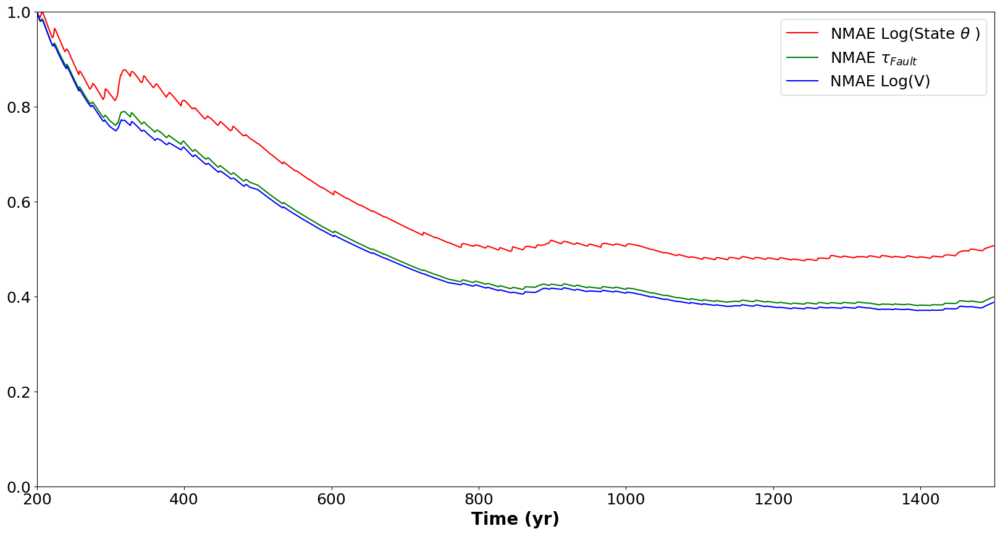

In [75]:
nrmse_error_mean_total = (
    nrmse_error_mean_tau + nrmse_error_mean_vel + nrmse_error_mean_theta
)
nrmse_error_median_total = (
    nrmse_error_median_tau + nrmse_error_median_vel + nrmse_error_median_theta
)
nmae_error_mean_total = (
    nmae_error_mean_tau + nmae_error_mean_vel + nmae_error_mean_theta
)
nmae_error_median_total = (
    nmae_error_median_tau + nmae_error_median_vel + nmae_error_median_theta
)

fig = plt.figure(figsize=(20, 10))

plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

# plt.plot(time_interp_theta,nrmse_error_median_theta,color='r',label='nrmse_error_median_theta')
# plt.plot(time_interp_tau,nrmse_error_median_tau,color='g',label='nrmse_error_median_tau')
# plt.plot(time_interp_vel,nrmse_error_median_vel,color='b',label='nrmse_error_median_vel')
# plt.plot(time_interp_tau,nrmse_error_median_total,color='k',label='nrmse_error_median_total')

# plt.plot(time_interp_theta,nrmse_error_mean_theta,'r--',label='nrmse_error_mean_theta')
# plt.plot(time_interp_tau,nrmse_error_mean_tau,'g--',label='nrmse_error_mean_tau')
# plt.plot(time_interp_vel,nrmse_error_mean_vel,'b--',label='nrmse_error_mean_vel')
# plt.plot(time_interp_tau,nrmse_error_mean_total,'k--',label='nrmse_error_mean_total')

# plt.plot(time_interp_theta,nmae_error_median_theta,'r-.',label='nmae_error_median_theta')
# plt.plot(time_interp_tau,nmae_error_median_tau,'g-.',label='nmae_error_median_tau')
# plt.plot(time_interp_vel,nmae_error_median_vel,'b-.',label='nmae_error_median_vel')
# plt.plot(time_interp_tau,nmae_error_median_total,'k-.',label='nmae_error_median_total')

plt.plot(
    time_interp_theta,
    nmae_error_mean_theta,
    "r-",
    label="NMAE Log(State " + r"$\theta$" + " )",
)
plt.plot(time_interp_tau, nmae_error_mean_tau, "g-", label="NMAE " + r"$\tau_{Fault}$")
plt.plot(time_interp_vel, nmae_error_mean_vel, "b-", label="NMAE Log(V) ")
# plt.plot(time_interp_tau,nmae_error_mean_total,'k:',label='nmae_error_mean_total')


# plt.plot(time_interp_theta,nrmse_error_median_theta,color='lightblue')
# plt.plot(time_interp_theta,nmae_error_mean_theta,color='g')
# plt.plot(time_interp_theta,nmae_error_median_theta,color='lightgreen')

plt.ylim(0, 1)
plt.xlim(200, 1500)

plt.xlabel("Time (yr)", fontsize=20, fontweight="bold")
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

plt.legend(fontsize=18)
plt.show()

In [ ]:
print(len(ens_interp_mean_vel))

1500
1500
[  17   19   23   34   37   40   51   57   69   71   75   86   89   92
  103  109  121  123  127  138  141  144  155  158  161  173  179  190
  193  196  203  220  237  239  256  271  289  305  313  327  341  357
  359  375  395  410  427  429  445  462  480  499  516  533  551  568
  585  603  620  637  654  671  689  706  723  741  758  774  791  809
  826  842  859  876  888  895  911  929  946  965  982  999 1017 1034
 1051 1069 1086 1103 1120 1137 1148 1152 1168 1172 1189 1206 1223 1241
 1257 1260 1273 1291 1308 1311 1327 1343 1358 1361 1377 1379 1396 1411
 1429 1446 1451 1464]
[  19   22   37   54   57   71   74   89  106  109  123  126  141  158
  161  173  176  178  190  193  195  203  220  237  239  256  271  273
  289  305  314  328  341  357  359  375  377  395  397  412  427  429
  445  462  464  480  499  516  534  551  568  585  603  620  637  654
  672  689  706  723  741  758  776  791  793  809  826  842  844  859
  876  888  895  911  929  946  965  967  982

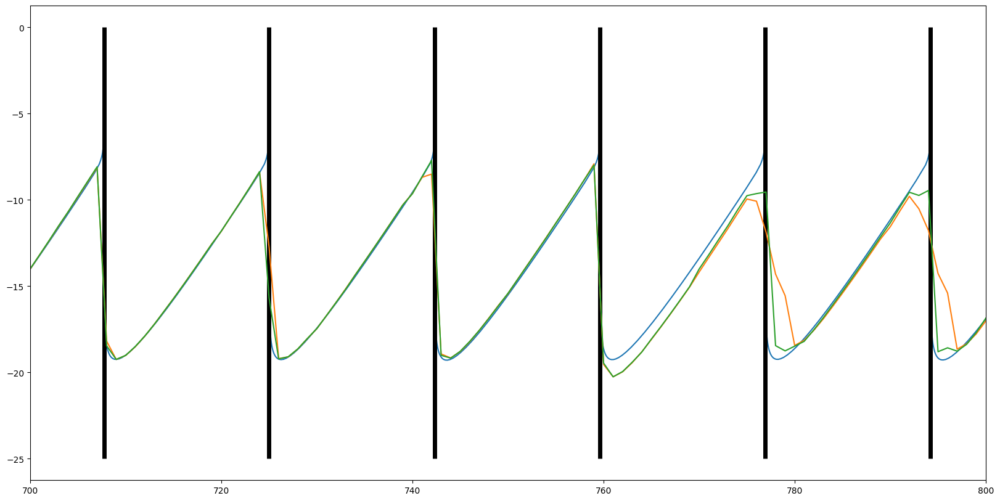

In [76]:
print(len(ens_interp_mean_vel))
print(len(ens_interp_median_vel))


peaks_vel_truth = find_peaks_seismic_cycle_vel(vel_truth)
peaks_vel_mean = find_peaks_seismic_cycle_vel(np.array(ens_interp_mean_vel))
peaks_vel_median = find_peaks_seismic_cycle_vel(np.array(ens_interp_median_vel))

print(peaks_vel_mean)
print(peaks_vel_median)

fig = plt.figure(figsize=(20, 10))
plt.plot(time_truth, np.log10(vel_truth))
plt.vlines(time_truth[peaks_vel_truth], ymin=-25, ymax=0, color="k", linewidth=5)
plt.plot(time_interp_vel, ens_interp_mean_vel)
plt.plot(time_interp_vel, ens_interp_median_vel)
# plt.vlines(time_interp_vel[peaks_vel_mean],ymin=-25,ymax=0,color='g',linewidth=5)
# plt.vlines(time_interp_vel[peaks_vel_median],ymin=-25,ymax=0,color='m',linewidth=5)
plt.xlim(700, 800)
plt.show()

In [78]:
def rolling_window(
    table_events, mem, window_start, window_end, window_length, window_space
):

    window_summary_time = []
    window_summary_prob = []

    #     window_gap=int(window_length*(1-window_overlap))

    time_average = 0
    prob_average = 0

    while window_end < len(table_events[:, 0]):

        window_end = window_start + window_length

        if np.sum(table_events[window_start:window_end, 1], axis=0) > 0:

            time_average = np.dot(
                table_events[window_start:window_end, 0],
                table_events[window_start:window_end, 1],
            ) / np.sum(table_events[window_start:window_end, 1], axis=0)
            prob_average = np.sum(table_events[window_start:window_end, 1]) / mem

        window_summary_time.append(time_average)
        window_summary_prob.append(prob_average)

        window_start = window_start + window_space

    return window_summary_time, window_summary_prob

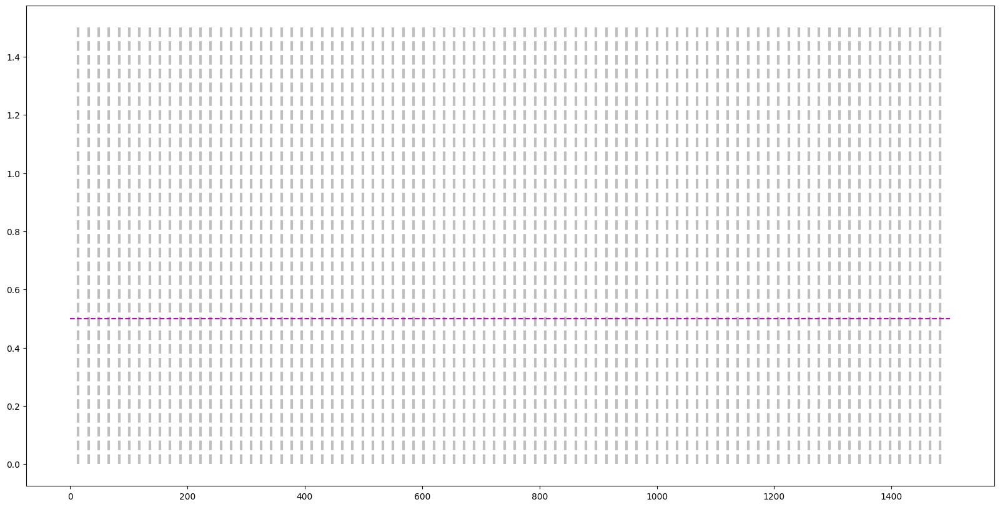

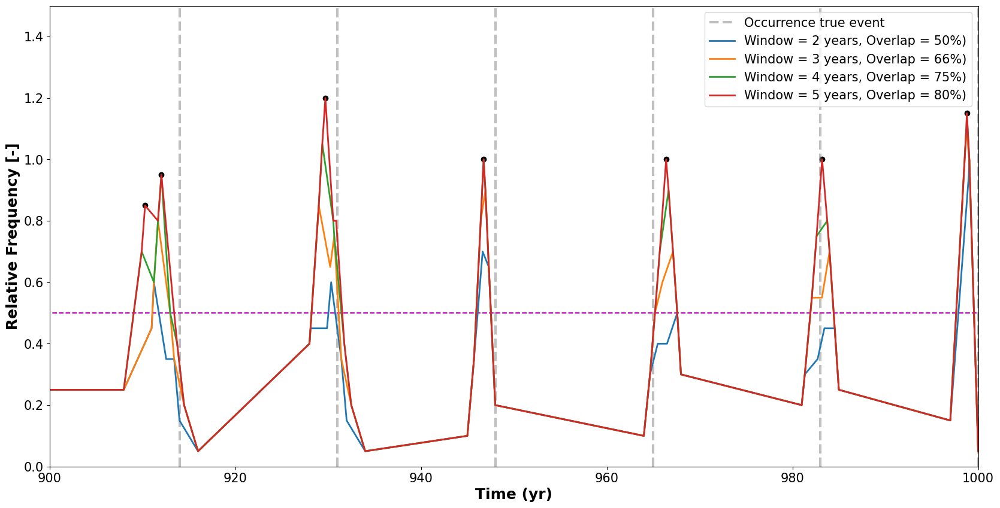

In [79]:
summary_events = np.zeros((len(time_interp_tau), mem))
index_events_truth = find_peaks_seismic_cycle_tau(tau_truth_interp)
table_events = np.zeros((len(time_interp_tau), 2))

for i in range(mem):
    index_events = find_peaks_seismic_cycle_tau(tau_ens_interp[i, :])
    summary_events[index_events, i] = 1

cum_summary_events = np.sum(summary_events, axis=1) / mem
table_events[:, 0] = np.arange(0, len(time_interp_tau), 1)
table_events[:, 1] = np.sum(summary_events, axis=1)

fig = plt.figure(figsize=(20, 10))
# plt.plot(time_interp_tau,cum_summary_events)
plt.vlines(
    time_interp_tau[index_events_truth],
    ymin=0,
    ymax=1.5,
    color="gray",
    linestyles="dashed",
    linewidth=3,
    label="Occurrence true event",
    alpha=0.5,
)
plt.hlines(0.5, xmin=0, xmax=time_simulation, color="m", linestyles="dashed")

# window_start=0
# window_end=0
# window_length=100
# window_overlap=1

window_summary_time, window_summary_prob = rolling_window(
    table_events, mem, window_start=0, window_end=0, window_length=2, window_space=1
)
plt.plot(
    window_summary_time,
    window_summary_prob,
    label="Window = 2 years, Overlap = " + str(100 * (2 - 1) / 2)[:2] + "%)",
    linewidth=2,
)

window_summary_time, window_summary_prob = rolling_window(
    table_events, mem, window_start=0, window_end=0, window_length=3, window_space=1
)
plt.plot(
    window_summary_time,
    window_summary_prob,
    label="Window = 3 years, Overlap = " + str(100 * (3 - 1) / 3)[:2] + "%)",
    linewidth=2,
)

window_summary_time, window_summary_prob = rolling_window(
    table_events, mem, window_start=0, window_end=0, window_length=4, window_space=1
)
plt.plot(
    window_summary_time,
    window_summary_prob,
    label="Window = 4 years, Overlap = " + str(100 * (4 - 1) / 4)[:2] + "%)",
    linewidth=2,
)

window_summary_time, window_summary_prob = rolling_window(
    table_events, mem, window_start=0, window_end=0, window_length=5, window_space=1
)
plt.plot(
    window_summary_time,
    window_summary_prob,
    label="Window = 5 years, Overlap = " + str(100 * (5 - 1) / 5)[:2] + "%)",
    linewidth=2,
)

# window_summary_time,window_summary_prob = rolling_window(table_events,mem,window_start=0,window_end=0,window_length=20,window_space=10)
# plt.plot(window_summary_time,window_summary_prob,label='Window = 20 years, Gap = 10 year')

# plt.xlim(5000,time_simulation)
plt.xlim(900, 1000)
plt.ylim(0, 1.5)
plt.legend(fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("Time (yr)", fontsize=18, fontweight="bold")
plt.ylabel(" Relative Frequency [-] ", fontsize=18, fontweight="bold")
# print(time_truth[index_events_truth])
# plt.plot(time_interp_tau,tau_ens_interp[0,:])
# plt.plot(time_interp_tau,tau_ens_interp[1,:])
# plt.vlines(time_interp_tau[index_events],ymin=15,ymax=30,color='m')

peaks, _ = find_peaks(window_summary_prob, distance=2, height=0.5)
window_summary_time = np.array(window_summary_time)
window_summary_prob = np.array(window_summary_prob)
plt.scatter(window_summary_time[peaks], window_summary_prob[peaks], color="k")
plt.show()

86


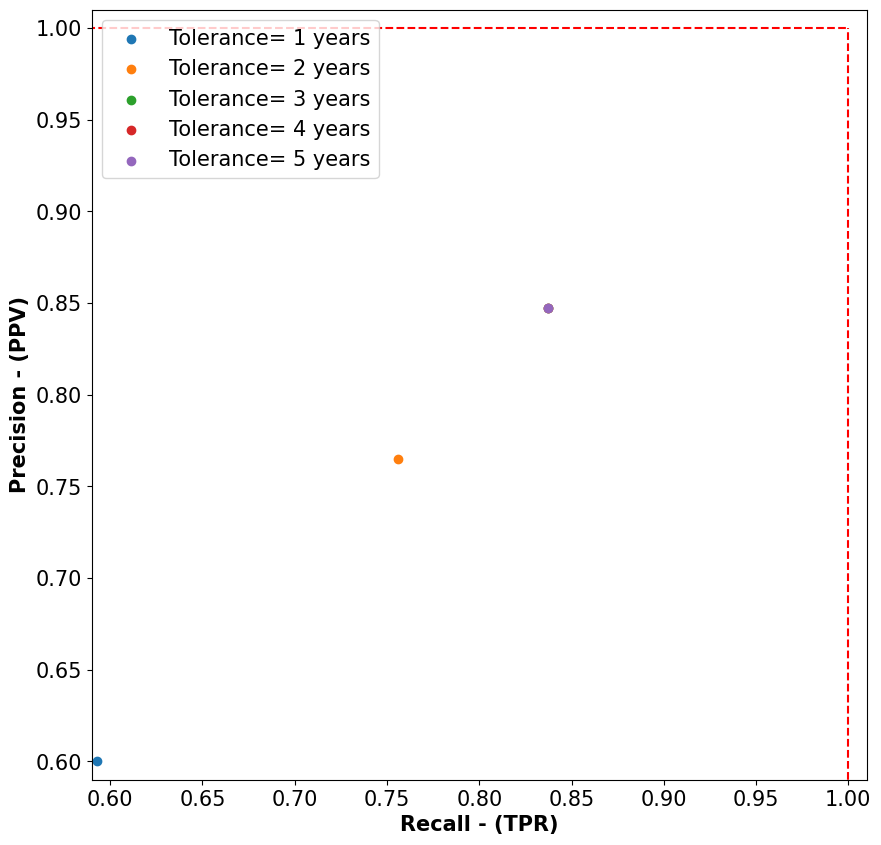

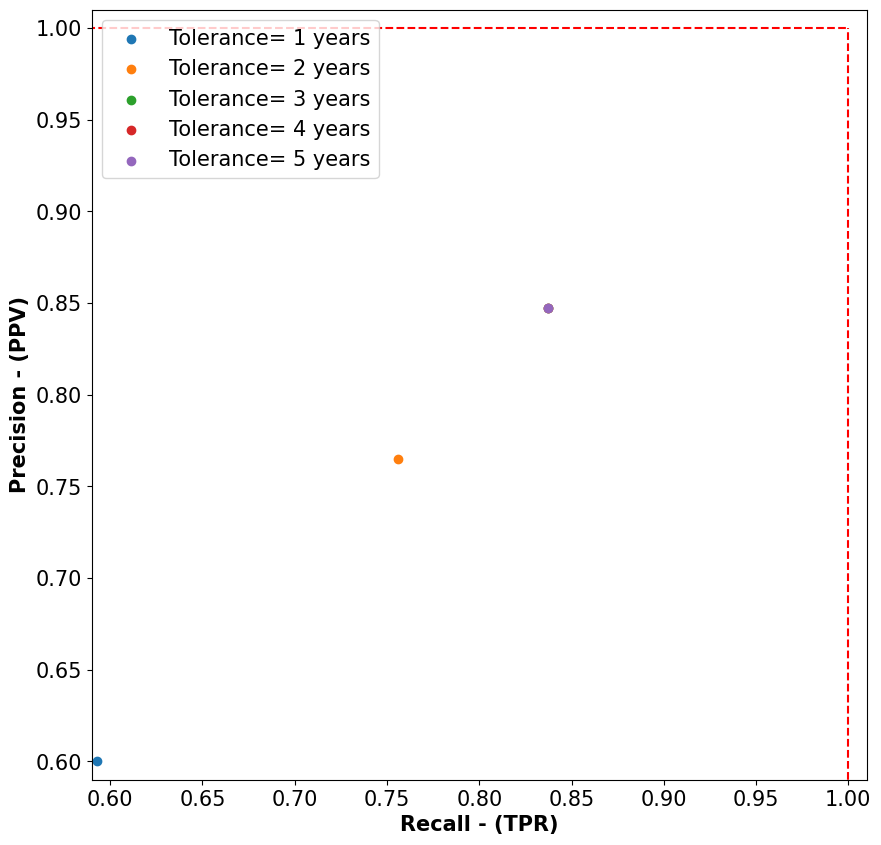

In [81]:
true_events = time_interp_tau[index_events_truth]

print(len(true_events))

window_summary_time, window_summary_prob = rolling_window(
    table_events, mem, window_start=0, window_end=0, window_length=5, window_space=1
)
window_summary_time = np.array(window_summary_time)

estimate_events = window_summary_time[peaks]

tol_vect = np.arange(1, 5 + 1, 1)
comparison_vect = []
detection_vect = []

recall_vect = np.zeros(len(tol_vect))
precision_vect = np.zeros(len(tol_vect))

fig = plt.figure(figsize=(10, 10))

for j in range(len(tol_vect)):

    tolerance = tol_vect[j]

    comparison_truth = []
    detections = []

    for i in range(len(true_events)):
        nearest_estimate = np.where(
            np.logical_and(
                estimate_events >= true_events[i] - tolerance,
                estimate_events <= true_events[i] + tolerance,
            )
        )[0]
        comparison_truth.append(estimate_events[nearest_estimate])
        detections.append(len(estimate_events[nearest_estimate]))

    comparison_vect.append(comparison_truth)
    detection_vect.append(detections)

    true_positives = len(np.where(np.array(detections) > 0)[0])
    false_negatives = len(true_events) - true_positives
    false_positives = len(estimate_events) - true_positives

    recall_vect[j] = true_positives / (true_positives + false_negatives)
    precision_vect[j] = true_positives / (true_positives + false_positives)

    plt.scatter(
        recall_vect[j],
        precision_vect[j],
        label="Tolerance= " + str(tol_vect[j]) + " years",
    )


# plt.plot(tol_vect,recall_vect,label='Precision')
# plt.plot(tol_vect,precision_vect,label='Recall')

plt.legend()
plt.xlabel("Recall - (TPR)", fontsize=15, fontweight="bold")
plt.ylabel("Precision - (PPV)", fontsize=15, fontweight="bold")

plt.legend(fontsize=15, loc=2)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.xlim(0.59, 1.01)
plt.ylim(0.59, 1.01)

plt.hlines(1, xmin=0, xmax=1, color="r", linestyles="dashed")
plt.vlines(1, ymin=0, ymax=1, color="r", linestyles="dashed")

# print(true_positives)
# print(false_negatives)
# print(false_positives)\

plt.show()

In [85]:
mean_vect = []
std_vect = []

collection_array = []

fig = plt.figure(figsize=(10, 8))

for i in range(len(tol_vect)):

    index_comp = np.where(np.array(detection_vect[i]) > 0)[0]
    comp_array = np.abs(
        np.array(comparison_vect[i])[index_comp] - true_events[index_comp]
    )

    comp_array_list = []

    for j in range(len(comp_array)):
        comp_array_list.append(np.mean(comp_array[j]))
    #             print(len(comp_array_list))

    collection_array.append(comp_array_list)

    mean_vect.append(np.mean(comp_array)[0])
    std_vect.append(np.std(comp_array)[0])
#     plt.errorbar(tol_vect[i], mean_vect[i], yerr=std_vect[i])

bp1 = plt.boxplot(
    collection_array[0:1],
    positions=tol_vect[0:1],
    widths=0.2,
    patch_artist=True,
    notch=True,
)


for box in bp1["boxes"]:
    box.set(color="green", linewidth=2)
    box.set(facecolor="green")

bp2 = plt.boxplot(
    collection_array[1:2],
    positions=tol_vect[1:2],
    widths=0.2,
    patch_artist=True,
    notch=True,
)

for box in bp2["boxes"]:
    box.set(color="red", linewidth=2)
    box.set(facecolor="red")


bp3 = plt.boxplot(
    collection_array[2:3],
    positions=tol_vect[2:3],
    widths=0.2,
    patch_artist=True,
    notch=True,
)

for box in bp3["boxes"]:
    box.set(color="blue", linewidth=2)
    box.set(facecolor="blue")

bp4 = plt.boxplot(
    collection_array[3:4],
    positions=tol_vect[3:4],
    widths=0.2,
    patch_artist=True,
    notch=True,
)

for box in bp4["boxes"]:
    box.set(color="orange", linewidth=2)
    box.set(facecolor="orange")

bp5 = plt.boxplot(
    collection_array[4:5],
    positions=tol_vect[4:5],
    widths=0.2,
    patch_artist=True,
    notch=True,
)

for box in bp5["boxes"]:
    box.set(color="m", linewidth=2)
    box.set(facecolor="m")


# plt.plot(tol_vect,mean_vect,label='mean difference',color='b')
# plt.scatter(tol_vect,mean_vect,color='b',marker='d')

# plt.plot(tol_vect,std_vect,label='standard deviation',color='orange')
# plt.scatter(tol_vect,std_vect,color='orange')

plt.hlines(2, xmin=-5, xmax=10, color="m", linestyles="dotted")

plt.legend(fontsize=15, loc=2)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.xlabel("Tolerance (yr)", fontsize=15, fontweight="bold")
plt.ylabel("Absolute Error Earthquake Occurrence (yr)", fontsize=15, fontweight="bold")

plt.xlim(0, 6)

# plt.ylim(-2.5,2.5)
plt.show()

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (86,) + inhomogeneous part.

<Figure size 1000x800 with 0 Axes>

<Figure size 1000x800 with 0 Axes>

<Figure size 1000x800 with 0 Axes>

<Figure size 1000x800 with 0 Axes>

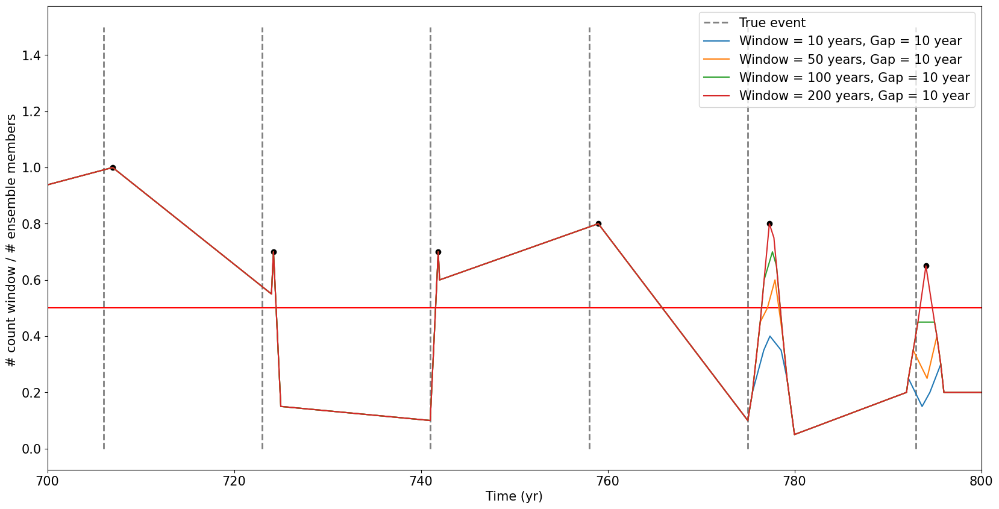

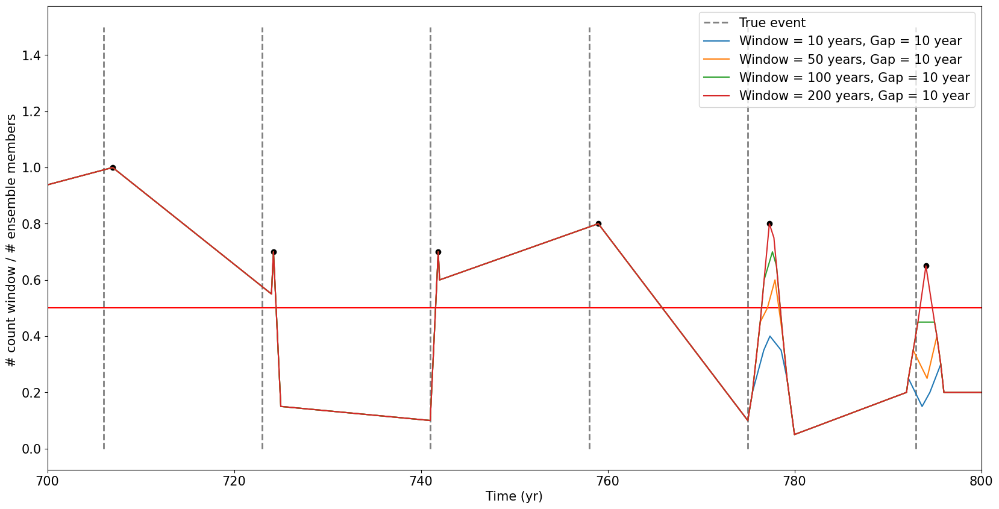

In [87]:
summary_events = np.zeros((len(time_interp_theta), mem))
index_events_truth = find_peaks_seismic_cycle_tau(tau_truth_interp)
table_events = np.zeros((len(time_interp_theta), 2))

for i in range(mem):
    index_events = find_peaks_seismic_cycle_theta(theta_ens_interp[i, :])
    summary_events[index_events, i] = 1

cum_summary_events = np.sum(summary_events, axis=1) / 200
table_events[:, 0] = np.arange(0, len(time_interp_tau), 1)
table_events[:, 1] = np.sum(summary_events, axis=1)

fig = plt.figure(figsize=(20, 10))
# plt.plot(time_interp_tau,cum_summary_events)
plt.vlines(
    time_interp_theta[index_events_truth],
    ymin=0,
    ymax=1.5,
    color="gray",
    linestyles="dashed",
    linewidth=2,
    label="True event",
)
plt.hlines(0.5, xmin=0, xmax=time_simulation, color="r", linestyles="solid")

# window_start=0
# window_end=0
# window_length=100
# window_overlap=1

window_summary_time, window_summary_prob = rolling_window(
    table_events, mem, window_start=0, window_end=0, window_length=2, window_space=1
)
plt.plot(
    window_summary_time, window_summary_prob, label="Window = 10 years, Gap = 10 year"
)

window_summary_time, window_summary_prob = rolling_window(
    table_events, mem, window_start=0, window_end=0, window_length=3, window_space=1
)
plt.plot(
    window_summary_time, window_summary_prob, label="Window = 50 years, Gap = 10 year"
)

window_summary_time, window_summary_prob = rolling_window(
    table_events, mem, window_start=0, window_end=0, window_length=4, window_space=1
)
plt.plot(
    window_summary_time, window_summary_prob, label="Window = 100 years, Gap = 10 year"
)

window_summary_time, window_summary_prob = rolling_window(
    table_events, mem, window_start=0, window_end=0, window_length=5, window_space=1
)
plt.plot(
    window_summary_time, window_summary_prob, label="Window = 200 years, Gap = 10 year"
)

# window_summary_time,window_summary_prob = rolling_window(table_events,mem,window_start=0,window_end=0,window_length=250,window_space=10)
# plt.plot(window_summary_time,window_summary_prob,label='Window = 250 years, Gap = 10 year')

# window_summary_time,window_summary_prob = rolling_window(table_events,mem,window_start=0,window_end=0,window_length=500,window_space=10)
# plt.plot(window_summary_time,window_summary_prob,label='Window = 500 years, Gap = 10 year')

# plt.xlim(5000,time_simulation)
plt.xlim(700, 800)
plt.legend(fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("Time (yr)", fontsize=15)
plt.ylabel("# count window / # ensemble members ", fontsize=15)
# print(time_truth[index_events_truth])
# plt.plot(time_interp_tau,tau_ens_interp[0,:])
# plt.plot(time_interp_tau,tau_ens_interp[1,:])
# plt.vlines(time_interp_tau[index_events],ymin=15,ymax=30,color='m')

peaks, _ = find_peaks(window_summary_prob, distance=8, height=0.5)
window_summary_time = np.array(window_summary_time)
window_summary_prob = np.array(window_summary_prob)
plt.scatter(window_summary_time[peaks], window_summary_prob[peaks], color="k")
plt.show()

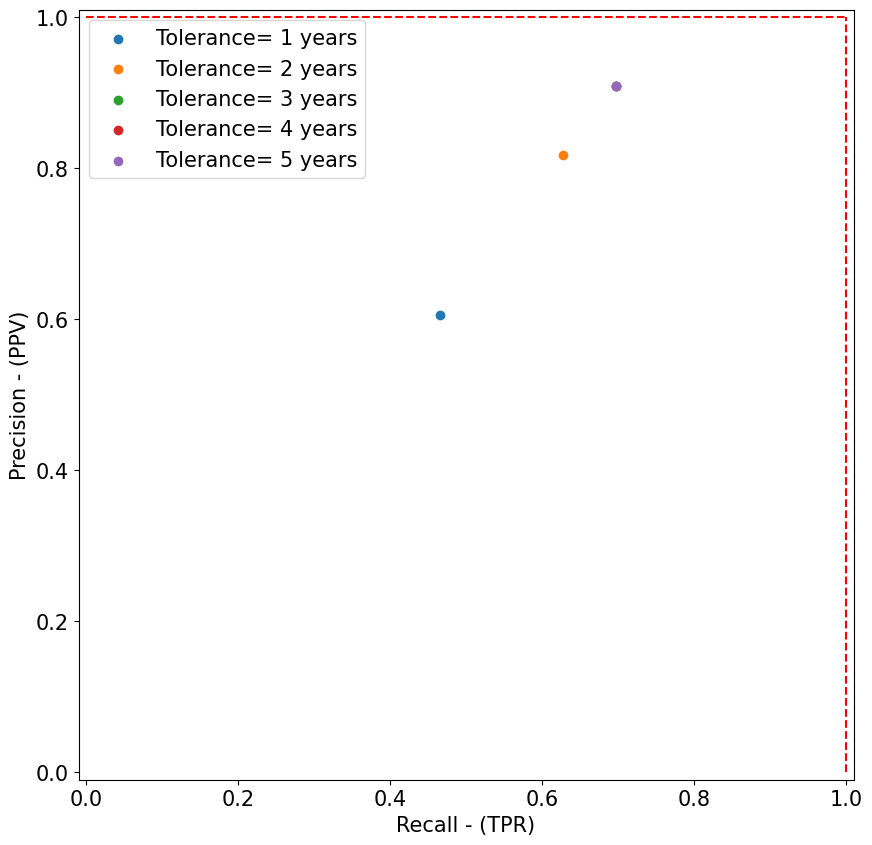

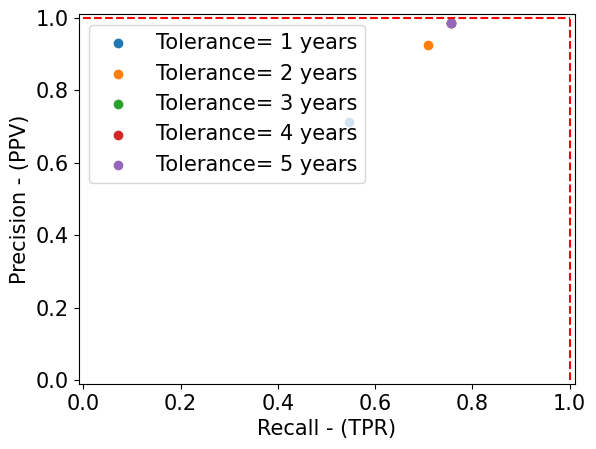

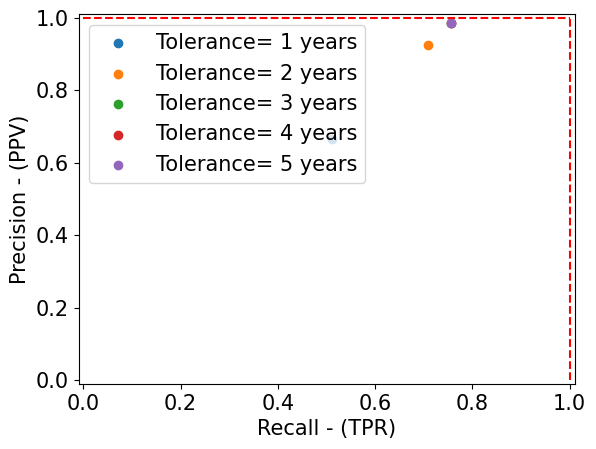

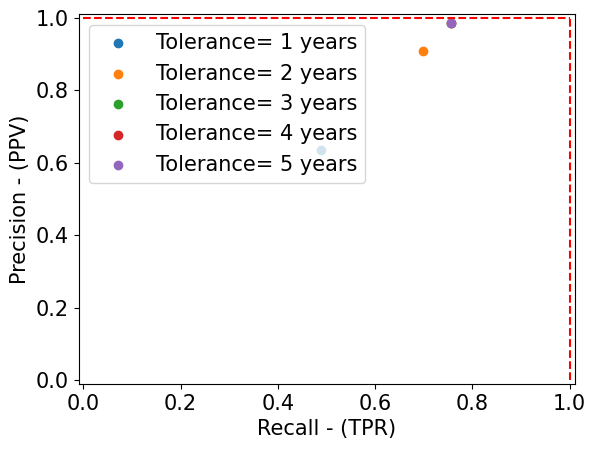

In [90]:
true_events = time_interp_tau[index_events_truth]

window_sizes = [2, 3, 4, 5]

fig = plt.figure(figsize=(10, 10))

for k in range(len(window_sizes)):

    window_summary_time, window_summary_prob = rolling_window(
        table_events,
        mem,
        window_start=0,
        window_end=0,
        window_length=window_sizes[k],
        window_space=1,
    )

    window_summary_time = np.array(window_summary_time)

    estimate_events = window_summary_time[peaks]

    tol_vect = np.arange(1, 5 + 1, 1)
    comparison_vect = []
    detection_vect = []

    recall_vect = np.zeros(len(tol_vect))
    precision_vect = np.zeros(len(tol_vect))

    for j in range(len(tol_vect)):

        tolerance = tol_vect[j]

        comparison_truth = []
        detections = []

        for i in range(len(true_events)):
            nearest_estimate = np.where(
                np.logical_and(
                    estimate_events >= true_events[i] - tolerance,
                    estimate_events <= true_events[i] + tolerance,
                )
            )[0]
            comparison_truth.append(estimate_events[nearest_estimate])
            detections.append(len(estimate_events[nearest_estimate]))

        comparison_vect.append(comparison_truth)
        detection_vect.append(detections)

        true_positives = len(np.where(np.array(detections) > 0)[0])
        false_negatives = len(true_events) - true_positives
        false_positives = len(estimate_events) - true_positives

        recall_vect[j] = true_positives / (true_positives + false_negatives)
        precision_vect[j] = true_positives / (true_positives + false_positives)

        plt.scatter(
            recall_vect[j],
            precision_vect[j],
            label="Tolerance= " + str(tol_vect[j]) + " years",
        )

    # plt.plot(tol_vect,recall_vect,label='Precision')
    # plt.plot(tol_vect,precision_vect,label='Recall')

    plt.legend()
    plt.xlabel("Recall - (TPR)", fontsize=15)
    plt.ylabel("Precision - (PPV)", fontsize=15)

    plt.legend(fontsize=15, loc=2)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

    plt.xlim(-0.01, 1.01)
    plt.ylim(-0.01, 1.01)

    plt.hlines(1, xmin=0, xmax=1, color="r", linestyles="dashed")
    plt.vlines(1, ymin=0, ymax=1, color="r", linestyles="dashed")

    # print(true_positives)
    # print(false_negatives)
    # print(false_positives)
    plt.show()

In [91]:
mean_vect = []
std_vect = []

for i in range(len(tol_vect)):

    index_comp = np.where(np.array(detection_vect[i]) > 0)[0]
    comp_array = np.abs(
        np.array(comparison_vect[i])[index_comp] - true_events[index_comp]
    )

    print(np.mean(comp_array[:]))

    mean_vect.append(np.mean(comp_array)[0])
    std_vect.append(np.std(comp_array)[0])
#     print(mean_vect[i])
#     print(std_vect[i])

fig = plt.figure(figsize=(20, 10))

plt.ylim(0, 2)

plt.plot(tol_vect, mean_vect, label="mean difference", color="b")
plt.scatter(tol_vect, mean_vect, color="b")

plt.plot(tol_vect, std_vect, label="standard deviation", color="orange")
plt.scatter(tol_vect, std_vect, color="orange")

plt.xlabel("Tolerance (yr)", fontsize=15)
plt.legend(fontsize=15)
plt.show()

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (86,) + inhomogeneous part.

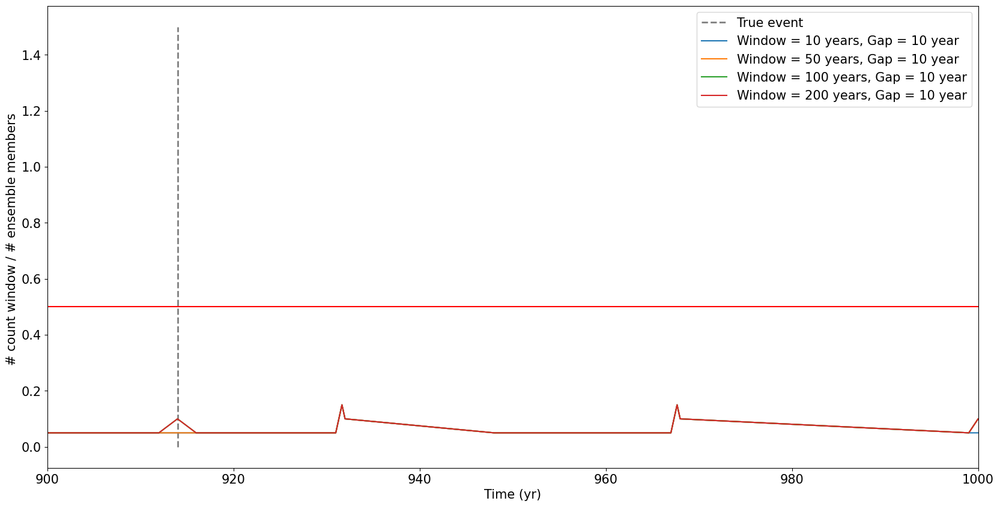

In [92]:
summary_events = np.zeros((len(time_interp_vel), mem))
index_events_truth = find_peaks_seismic_cycle_vel(vel_truth_interp)
table_events = np.zeros((len(time_interp_vel), 2))

for i in range(mem):
    index_events = find_peaks_seismic_cycle_vel(vel_ens_interp[i, :])
    summary_events[index_events, i] = 1

cum_summary_events = np.sum(summary_events, axis=1) / mem
table_events[:, 0] = np.arange(0, len(time_interp_tau), 1)
table_events[:, 1] = np.sum(summary_events, axis=1)

fig = plt.figure(figsize=(20, 10))
# plt.plot(time_interp_tau,cum_summary_events)
plt.vlines(
    time_interp_vel[index_events_truth],
    ymin=0,
    ymax=1.5,
    color="gray",
    linestyles="dashed",
    linewidth=2,
    label="True event",
)
plt.hlines(0.5, xmin=0, xmax=time_simulation, color="r", linestyles="solid")

# window_start=0
# window_end=0
# window_length=100
# window_overlap=1

window_summary_time, window_summary_prob = rolling_window(
    table_events, mem, window_start=0, window_end=0, window_length=2, window_space=1
)
plt.plot(
    window_summary_time, window_summary_prob, label="Window = 10 years, Gap = 10 year"
)

window_summary_time, window_summary_prob = rolling_window(
    table_events, mem, window_start=0, window_end=0, window_length=3, window_space=1
)
plt.plot(
    window_summary_time, window_summary_prob, label="Window = 50 years, Gap = 10 year"
)

window_summary_time, window_summary_prob = rolling_window(
    table_events, mem, window_start=0, window_end=0, window_length=5, window_space=1
)
plt.plot(
    window_summary_time, window_summary_prob, label="Window = 100 years, Gap = 10 year"
)

window_summary_time, window_summary_prob = rolling_window(
    table_events, mem, window_start=0, window_end=0, window_length=6, window_space=1
)
plt.plot(
    window_summary_time, window_summary_prob, label="Window = 200 years, Gap = 10 year"
)

# window_summary_time,window_summary_prob = rolling_window(table_events,mem,window_start=0,window_end=0,window_length=250,window_space=10)
# plt.plot(window_summary_time,window_summary_prob,label='Window = 250 years, Gap = 10 year')

# window_summary_time,window_summary_prob = rolling_window(table_events,mem,window_start=0,window_end=0,window_length=500,window_space=10)
# plt.plot(window_summary_time,window_summary_prob,label='Window = 500 years, Gap = 10 year')

# plt.xlim(5000,time_simulation)
plt.xlim(900, 1000)
plt.legend(fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel("Time (yr)", fontsize=15)
plt.ylabel("# count window / # ensemble members ", fontsize=15)
# print(time_truth[index_events_truth])
# plt.plot(time_interp_tau,tau_ens_interp[0,:])
# plt.plot(time_interp_tau,tau_ens_interp[1,:])
# plt.vlines(time_interp_tau[index_events],ymin=15,ymax=30,color='m')

peaks, _ = find_peaks(window_summary_prob, distance=8, height=0.5)
window_summary_time = np.array(window_summary_time)
window_summary_prob = np.array(window_summary_prob)
plt.scatter(window_summary_time[peaks], window_summary_prob[peaks], color="k")
plt.show()

In [93]:
true_events = time_interp_vel[index_events_truth]
estimate_events = window_summary_time[peaks]

tol_vect = np.arange(1, 5 + 1, 1)
comparison_vect = []
detection_vect = []

recall_vect = np.zeros(len(tol_vect))
precision_vect = np.zeros(len(tol_vect))

fig = plt.figure(figsize=(10, 10))

for j in range(len(tol_vect)):

    tolerance = tol_vect[j]

    comparison_truth = []
    detections = []

    for i in range(len(true_events)):
        nearest_estimate = np.where(
            np.logical_and(
                estimate_events >= true_events[i] - tolerance,
                estimate_events <= true_events[i] + tolerance,
            )
        )[0]
        comparison_truth.append(estimate_events[nearest_estimate])
        detections.append(len(estimate_events[nearest_estimate]))

    comparison_vect.append(comparison_truth)
    detection_vect.append(detections)

    true_positives = len(np.where(np.array(detections) > 0)[0])
    false_negatives = len(true_events) - true_positives
    false_positives = len(estimate_events) - true_positives

    recall_vect[j] = true_positives / (true_positives + false_negatives)
    precision_vect[j] = true_positives / (true_positives + false_positives)

    plt.scatter(
        recall_vect[j],
        precision_vect[j],
        label="Tolerance= " + str(tol_vect[j]) + " years",
    )


# plt.plot(tol_vect,recall_vect,label='Precision')
# plt.plot(tol_vect,precision_vect,label='Recall')

plt.legend()
plt.xlabel("Recall - (TPR)", fontsize=15)
plt.ylabel("Precision - (PPV)", fontsize=15)

plt.legend(fontsize=15, loc=2)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.xlim(-0.01, 1.01)
plt.ylim(-0.01, 1.01)

plt.hlines(1, xmin=0, xmax=1, color="r", linestyles="dashed")
plt.vlines(1, ymin=0, ymax=1, color="r", linestyles="dashed")

# print(true_positives)
# print(false_negatives)
# print(false_positives)
plt.show()

ZeroDivisionError: division by zero

In [94]:
mean_vect = []
std_vect = []

for i in range(len(tol_vect)):

    index_comp = np.where(np.array(detection_vect[i]) > 0)[0]
    comp_array = np.abs(
        np.array(comparison_vect[i])[index_comp] - true_events[index_comp]
    )

    print(np.mean(comp_array[:]))

    mean_vect.append(np.mean(comp_array)[0])
    std_vect.append(np.std(comp_array)[0])
#     print(mean_vect[i])
#     print(std_vect[i])

fig = plt.figure(figsize=(20, 10))

plt.plot(tol_vect, mean_vect, label="mean difference", color="b")
plt.scatter(tol_vect, mean_vect, color="b")

plt.plot(tol_vect, std_vect, label="standard deviation", color="orange")
plt.scatter(tol_vect, std_vect, color="orange")

plt.xlabel("Tolerance (yr)", fontsize=15)
plt.legend(fontsize=15)

plt.ylim(0, 100)
plt.show()

nan


/gpfs/home2/montero/infocus_dassim/experiments/experiments_1d/enkf_50_pub_01_fast_right_david/.venv/lib64/python3.11/site-packages/numpy/_core/fromnumeric.py:3904: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/gpfs/home2/montero/infocus_dassim/experiments/experiments_1d/enkf_50_pub_01_fast_right_david/.venv/lib64/python3.11/site-packages/numpy/_core/_methods.py:147: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


IndexError: invalid index to scalar variable.

<Figure size 1000x1000 with 0 Axes>

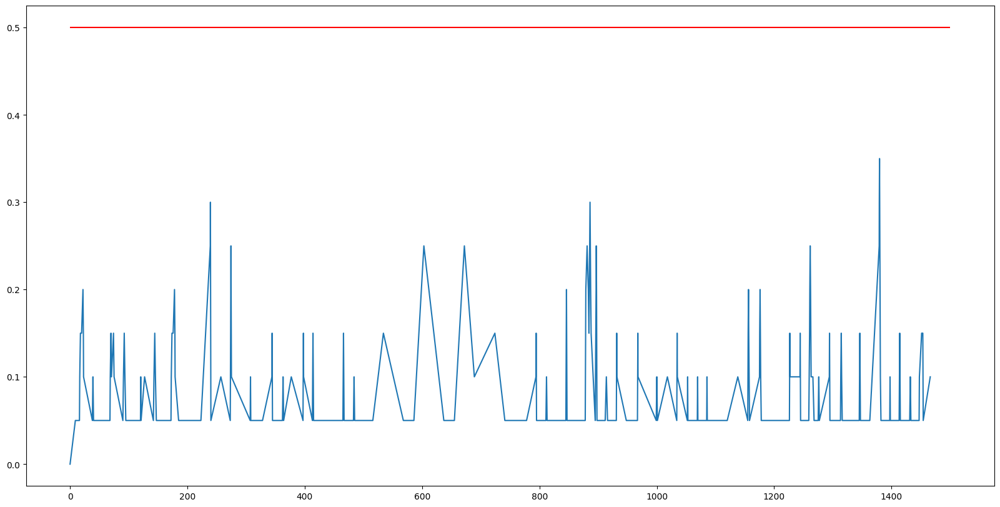

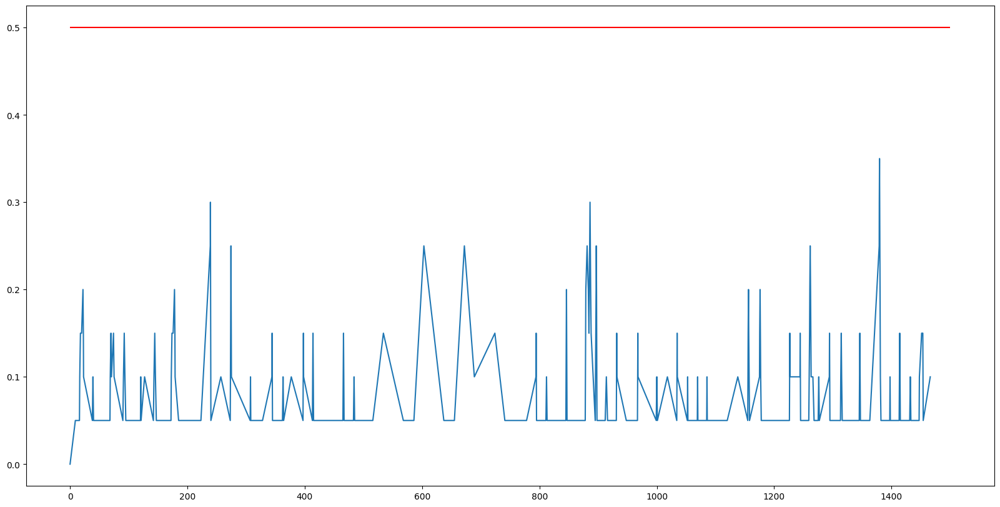

In [96]:
fig = plt.figure(figsize=(20, 10))
plt.plot(window_summary_time, window_summary_prob)

plt.hlines(0.5, xmin=0, xmax=time_simulation, color="r", linestyles="solid")
plt.show()

In [ ]:
np.sum(table_events[window_start:window_end, 1], axis=0)

In [ ]:
np.dot(
    table_events[window_start:window_end, 0], table_events[window_start:window_end, 1]
)

In [ ]:
table_events[0:10, 1]

In [ ]:
print(summary_events)

In [ ]:
# plt.hist(summary_events[:,5])

In [ ]:
index_events

In [ ]:
print(len(index_events))
print(len(index_events_truth))

In [ ]:
print(tau_ens_interp[0, 5000:].shape)

In [99]:
t_slice_vect = np.arange(689, 5000, 1)

for j in range(len(t_slice_vect)):

    t_slice = t_slice_vect[j]

    print(t_slice)

    fig = plt.figure(figsize=(30, 10))

    plt.subplot(131)
    plt.plot(
        tau_truth[5000:],
        np.log10(vel_truth[5000:]),
        color="darkgray",
        alpha=0.3,
        linewidth=3,
    )
    plt.scatter(
        tau_ens_interp[:, t_slice],
        np.log10(vel_ens_interp[:, t_slice]),
        s=200,
        alpha=0.3,
        color="g",
    )
    plt.scatter(
        ens_interp_mean_tau[t_slice],
        ens_interp_mean_vel[t_slice],
        color="olive",
        marker="*",
        s=1000,
    )
    plt.scatter(
        ens_interp_median_tau[t_slice],
        ens_interp_median_vel[t_slice],
        color="m",
        marker="*",
        s=1000,
    )
    plt.scatter(
        tau_truth[t_slice], np.log10(vel_truth[t_slice]), color="k", marker="*", s=1000
    )
    # plt.scatter(tau_ens_interp[:,t_slice+10],np.log10(vel_ens_interp[:,t_slice+10]))
    # plt.scatter(tau_ens_interp[:,t_slice+20],np.log10(vel_ens_interp[:,t_slice+20]))
    # plt.scatter(tau_ens_interp[:,6000:6300],np.log10(vel_ens_interp[:,6000:6300]))

    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)

    plt.xlabel("Shear Stress (MPa)", fontsize=18, fontweight="bold")
    plt.ylabel("Log(Velocity(m/s))", fontsize=18, fontweight="bold")
    plt.title("Time " + str(t_slice) + " years", fontsize=18, fontweight="bold")

    plt.subplot(132)
    plt.plot(
        tau_truth[5000:],
        np.log10(theta_truth[5000:]),
        color="darkgray",
        alpha=0.3,
        linewidth=3,
    )
    plt.scatter(
        tau_ens_interp[:, t_slice],
        np.log10(theta_ens_interp[:, t_slice]),
        s=200,
        alpha=0.3,
        color="g",
    )
    plt.scatter(
        ens_interp_mean_tau[t_slice],
        ens_interp_mean_theta[t_slice],
        color="olive",
        marker="*",
        s=1000,
    )
    plt.scatter(
        ens_interp_median_tau[t_slice],
        ens_interp_median_theta[t_slice],
        color="m",
        marker="*",
        s=1000,
    )
    plt.scatter(
        tau_truth[t_slice],
        np.log10(theta_truth[t_slice]),
        color="k",
        marker="*",
        s=1000,
    )
    # plt.scatter(tau_ens_interp[:,t_slice+10],np.log10(vel_ens_interp[:,t_slice+10]))
    # plt.scatter(tau_ens_interp[:,t_slice+20],np.log10(vel_ens_interp[:,t_slice+20]))
    # plt.scatter(tau_ens_interp[:,6000:6300],np.log10(vel_ens_interp[:,6000:6300]))

    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)

    plt.xlabel("Shear Stress (MPa)", fontsize=18, fontweight="bold")
    plt.ylabel("Log(Theta(s))", fontsize=18, fontweight="bold")
    plt.title("Time " + str(t_slice) + " years", fontsize=18, fontweight="bold")

    plt.subplot(133)
    plt.plot(
        np.log10(theta_truth[5000:]),
        np.log10(vel_truth[5000:]),
        color="darkgray",
        alpha=0.3,
        linewidth=3,
    )
    plt.scatter(
        np.log10(theta_ens_interp[:, t_slice]),
        np.log10(vel_ens_interp[:, t_slice]),
        s=200,
        alpha=0.3,
        color="g",
    )
    plt.scatter(
        ens_interp_mean_theta[t_slice],
        ens_interp_mean_vel[t_slice],
        color="olive",
        marker="*",
        s=1000,
    )
    plt.scatter(
        ens_interp_median_theta[t_slice],
        ens_interp_median_vel[t_slice],
        color="m",
        marker="*",
        s=1000,
    )
    plt.scatter(
        np.log10(theta_truth[t_slice]),
        np.log10(vel_truth[t_slice]),
        color="k",
        marker="*",
        s=1000,
    )
    # plt.scatter(tau_ens_interp[:,t_slice+10],np.log10(vel_ens_interp[:,t_slice+10]))
    # plt.scatter(tau_ens_interp[:,t_slice+20],np.log10(vel_ens_interp[:,t_slice+20]))
    # plt.scatter(tau_ens_interp[:,6000:6300],np.log10(vel_ens_interp[:,6000:6300]))

    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)

    plt.xlabel("Log(Theta(s))", fontsize=18, fontweight="bold")
    plt.ylabel("Log(Velocity(m/s))", fontsize=18, fontweight="bold")
    plt.title("Time " + str(t_slice) + " years", fontsize=18, fontweight="bold")

    fig.savefig(
        os.path.join(
            path_images, "movie_phase_fault", "phase" + str(t_slice).zfill(5) + ".png"
        ),
        bbox_inches="tight",
    )

    plt.ioff()
    # plt.show()

689
690
691
692
693
694
695
696
697
698
699
700
701
702
703
704
705
706
707
708
709


/scratch-local/montero/ipykernel_390999/3887226249.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(30, 10))


710
711
712
713
714
715
716
717
718
719
720
721
722
723
724
725
726
727
728
729
730
731
732
733
734
735
736
737
738
739
740
741
742
743
744
745
746
747
748
749
750
751
752
753
754
755
756
757
758
759
760
761
762
763
764
765
766
767
768
769
770
771
772
773
774
775
776
777
778
779
780
781
782
783
784
785
786
787
788
789
790
791
792
793
794
795
796
797
798
799
800
801
802
803
804
805
806
807
808
809
810
811
812
813
814
815
816
817
818
819
820
821
822
823
824
825
826
827
828
829
830
831
832
833
834
835
836
837
838
839
840
841
842
843
844


: 

In [ ]:
# #diff_time=abs(time_peaks_ens[1:]-time_peaks)
# diff_time=time_peaks_ens[1:]-time_peaks[0:-1]

# # print(time_peaks)
# # print(time_peaks_ens)
# print(diff_time)

# fig=plt.figure(figsize=(20,10))
# plt.xlabel("Time (yr)",fontsize=20,fontweight='bold')
# plt.ylabel("Difference Time Events (yr)",fontsize=20,fontweight='bold')
# plt.xticks(fontsize=18)
# plt.yticks(fontsize=18)

# plt.plot(time_peaks[0:-1],diff_time)

In [ ]:
# tau_truth_interp=np.interp(time_interp, truth_info['time'], truth_info['tau'])
# error_cum=np.zeros(len(tau_truth_interp))
# rmse=np.zeros(len(tau_truth_interp))
# tau_drop=6 #MPa
# for i in range(len(tau_truth_interp)):
#     error_cum[i]=(tau_truth_interp[i]-ens_interp_mean[i])**2
#     if i>0:
#         error_cum[i]=error_cum[i]+error_cum[i-1]
#     rmse[i]=np.sqrt(error_cum[i]/(i+1))

# fig=plt.figure(figsize=(20,10))
# plt.plot(time_interp,error_cum)

# fig=plt.figure(figsize=(20,10))
# # plt.plot(time_interp,tau_truth_interp/15)
# plt.plot(time_interp,rmse)
# plt.xlim(2000,time_simulation)
# plt.ylim(2,6)

In [ ]:
# Ens 11
# Ens 13
# print(ens_wrong)

In [ ]:
# diff_error_cum=(error_cum[2:-1]-error_cum[0:-3])/2
# fig=plt.figure(figsize=(20,10))
# plt.plot(time_interp[1:-2],diff_error_cum)

# Load observations

In [1]:
index_obs = list_obsnet[:, 1]
index_obs = index_obs.astype(int)
index_obs.tolist()

NameError: name 'list_obsnet' is not defined

In [ ]:
def plot_truth_fault(truth_info, path_images, variable, list_obsnet):

    # Loading observations

    index_obs = list_obsnet[:, 1]
    index_obs = index_obs.astype(int)
    index_obs.tolist()

    # Setup Figure

    fig = plt.figure(figsize=(20, 10))
    plt.xlabel("Time (yr)", fontsize=20, fontweight="bold")
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)

    # Extracting info output.json

    time = truth_info["time"]
    state = truth_info[variable]

    # plot

    plt.scatter(time[index_obs], state[index_obs], color="r", label="Observations")

    if variable == "tau":
        plt.scatter(time, state, color="k", label="Truth")
        obs_err = np.ones(len(index_obs)) * 0.75
        plt.errorbar(
            time[index_obs],
            state[index_obs],
            yerr=obs_err,
            fmt="D",
            color="red",
            elinewidth=2,
            capsize=3,
        )
        plt.ylabel("Shear Stress at Fault (MPa)", fontsize=20, fontweight="bold")
        plt.title("Time Series Truth for Shear Stress at Fault", fontsize=20)
    if variable == "vel":
        plt.scatter(time, np.log10(state), color="k", label="Truth")
        plt.ylabel("Slip Rate at Fault (m/_interps)", fontsize=20, fontweight="bold")
        plt.title("Time Series Truth for Slip Rate at Fault", fontsize=20)
    if variable == "theta":
        plt.scatter(time, np.log10(state), color="k", label="Truth")
        plt.ylabel("Theta (-)", fontsize=20, fontweight="bold")
        plt.title("Time Series Truth for Theta State at Fault", fontsize=20)
    if variable == "dt":
        plt.scatter(time, state, color="k", label="Truth")
        plt.ylabel("dt (yr)", fontsize=20, fontweight="bold")
        plt.title("Time Series Truth for Time Steps", fontsize=20)

    plt.legend(fontsize=18)
    plt.xlim(800, 850)
    fig.savefig(
        os.path.join(path_images, "obs_" + variable + ".png"), bbox_inches="tight"
    )

    return fig

In [ ]:
truth_info = process_output_json(path_truth)
fig = plot_truth_fault(truth_info, path_images, "tau", list_obsnet)
fig = plot_truth_fault(truth_info, path_images, "vel", list_obsnet)
fig = plot_truth_fault(truth_info, path_images, "theta", list_obsnet)
fig = plot_truth_fault(truth_info, path_images, "time", list_obsnet)

# Load medium information

In [ ]:
# Obtaining from output.json and approximate to lower 10
tau_info_medium = []
ensemble_info_medium = []

for i in range(len(ensemble_info)):
    # Approximate the time steps
    total_step = ensemble_info[i]["index"][-1]
    total_step = int(math.floor(total_step / 10.0)) * 10
    print(total_step)
    index_info = np.arange(0, total_step, 10)
    time_info = ensemble_info[i]["time"]
    time_info = time_info[index_info]

    tau_member_info = np.zeros((ny, len(index_info)))
    vel_member_info = np.zeros((ny - 1, len(index_info)))

    for j in range(len(index_info)):
        file_tau = "tau.0_" + str(index_info[j]).zfill(6) + ".h5"
        file_vel = "v.1_" + str(index_info[j]).zfill(6) + ".h5"
        path_ens_output = os.path.join(path_garnet_data, "ens_" + str(i + 1), "output")
        path_file_tau = os.path.join(path_ens_output, file_tau)
        path_file_vel = os.path.join(path_ens_output, file_vel)

        with h5py.File(path_file_tau, "r") as hdf:
            ls = list(hdf.keys())
            data = hdf.get("data")
            tau_vect = np.array(data) + np.ones(ny) * tau0_ens[i] * 1e6

            tau_member_info[:, j] = tau_vect

        print(path_file_vel)
        with h5py.File(path_file_vel, "r") as hdf:
            ls = list(hdf.keys())
            data = hdf.get("data")
            vel_vect = np.array(data)

            vel_member_info[:, j] = vel_vect

    member_info_medium = {
        "tau": tau_member_info,
        "vel": vel_member_info,
        "index": index_info,
        "time": time_info,
    }
    ensemble_info_medium.append(member_info_medium)

In [ ]:
# Obtaining from output.json and approximate to lower 10
tau_info_medium = []
truth_info_medium = []

for i in range(len(ensemble_info)):
    # Approximate the time steps
    total_step = ensemble_info[i]["index"][-1]
    total_step = int(math.floor(total_step / 10.0)) * 10
    print(total_step)
    index_info = np.arange(0, total_step, 10)
    time_info = ensemble_info[i]["time"]
    time_info = time_info[index_info]

    tau_member_info = np.zeros((ny, len(index_info)))
    vel_member_info = np.zeros((ny - 1, len(index_info)))

    for j in range(len(index_info)):
        file_tau = "tau.0_" + str(index_info[j]).zfill(6) + ".h5"
        file_vel = "v.1_" + str(index_info[j]).zfill(6) + ".h5"
        path_ens_output = os.path.join(path_garnet_data, "ens_" + str(i + 1), "output")
        path_file_tau = os.path.join(path_ens_output, file_tau)
        path_file_vel = os.path.join(path_ens_output, file_vel)

        with h5py.File(path_file_tau, "r") as hdf:
            ls = list(hdf.keys())
            data = hdf.get("data")
            tau_vect = np.array(data) + np.ones(ny) * tau0_ens[i] * 1e6

            tau_member_info[:, j] = tau_vect

        print(path_file_vel)
        with h5py.File(path_file_vel, "r") as hdf:
            ls = list(hdf.keys())
            data = hdf.get("data")
            vel_vect = np.array(data)

            vel_member_info[:, j] = vel_vect

    member_info_medium = {
        "tau": tau_member_info,
        "vel": vel_member_info,
        "index": index_info,
        "time": time_info,
    }
    ensemble_info_medium.append(member_info_medium)

In [ ]:
# tau_v=ensemble_info_medium[2]['tau'][pos,:]
# time_v=ensemble_info_medium[2]['time']

# plt.plot(time_v,tau_v)

# print(ensemble_info_medium[0]['tau'].shape)
# print(ensemble_info_medium[0]['tau'][:,1])
pos = 10

In [ ]:
# i=3

# # Setup Figure
# fig=plt.figure(figsize=(20,10))
# plt.title("Time Series Shear Stress at 10 km for member "+str(int(i+1)), fontsize=20)
# plt.xlabel("Time (yr)",fontsize=20,fontweight='bold')
# plt.ylabel("Shear Stress at Medium(MPa) - 1 km",fontsize=20,fontweight='bold')
# plt.xticks(fontsize=18)
# plt.yticks(fontsize=18)

# # Load observations

# index_obs=list_obsnet[:,1]
# index_obs=index_obs.astype(int)
# index_obs.tolist()

# time_truth=truth_info['time']
# tau_truth=truth_info['tau']

# plt.plot(time_truth,tau_truth,color='k',label='Truth',linewidth=3)
# plt.scatter(time_truth[index_obs],tau_truth[index_obs],color='r',label='Observations')
# obs_err=np.ones(len(index_obs))*1.5
# plt.errorbar(time_truth[index_obs], tau_truth[index_obs], yerr=obs_err,fmt='D',color='red', elinewidth=2 ,capsize=3)

# tau_v=ensemble_info_medium[i]['tau'][pos,:]
# time_v=ensemble_info_medium[i]['time']
# vel_v=ensemble_info_medium[i]['vel'][pos,:]
# plt.plot(time_v,tau_v/1e6,linewidth=3)

# # fig.savefig(os.path.join(path_images,'medium_member'+str(i+1)+'.png'), bbox_inches='tight')

# plt.legend(fontsize=18)

# pos_f=np.where(time_v>2000)[0][0]
# print(time_v[pos_f-1])
# print(time_v[pos_f])
# print(time_v[pos_f+1])
# print(tau_v[pos_f-1])
# print(tau_v[pos_f])
# print(tau_v[pos_f+1])
# print(vel_v[pos_f-1])
# print(vel_v[pos_f])
# print(vel_v[pos_f+1])

In [ ]:
fig = plt.figure(figsize=(20, 10))
ax = plt.gca()

# Setup Figure

# plt.title("Time Series Shear Stress at 10 km for member "+str(int(i+1)), fontsize=20)
plt.xlabel("Time (yr)", fontsize=28, fontweight="bold")
plt.ylabel("ln( Slip velocity [m/s] )- obs. location", fontsize=28, fontweight="bold")
plt.xticks(fontsize=22)
plt.yticks(fontsize=22)

# Load observations

index_obs = list_obsnet[:, 1]
index_obs = index_obs.astype(int)
index_obs.tolist()

plt.xlim(900, 1000)

time_truth = truth_info["time"]
vel_truth = truth_info["vel"]

# plt.semilogy(time_truth,vel_truth,color='k',label='Truth',linewidth=3)
#     plt.scatter(time_truth[index_obs],tau_truth[index_obs],color='r',label='Observations')
#     obs_err=np.ones(len(index_obs))*2.5
#     plt.errorbar(time_truth[index_obs], tau_truth[index_obs], yerr=obs_err,fmt='D',color='red', elinewidth=2 ,capsize=3)


time_interp_vel = np.arange(0, time_simulation, 1)
vel_ens_interp = np.zeros((mem, time_interp_vel.shape[0]))


for i in range(len(ensemble_info) - 1):
    vel_v = ensemble_info_medium[i]["vel"][pos, :]
    time_v = ensemble_info_medium[i]["time"]

    if i == 0:
        plt.plot(
            time_v,
            np.log10(vel_v),
            linewidth=3,
            color="lightgreen",
            alpha=0.2,
            label="Ens. Member",
        )

    plt.plot(time_v, np.log10(vel_v), linewidth=3, color="lightgreen", alpha=0.2)

for i in range(mem):
    vel_ens_interp[i, :] = np.interp(
        time_interp_vel,
        ensemble_info_medium[i]["time"],
        np.log10(ensemble_info_medium[i]["vel"][pos, :]),
    )

ens_interp_mean_vel = []
ens_interp_median_vel = []
ens_interp_cov_vel = []
ens_interp_p16_vel = []
ens_interp_p84_vel = []

for i in range(len(time_interp_vel)):
    interp_mean = np.mean(vel_ens_interp[:, i])
    interp_std = np.std(vel_ens_interp[:, i], ddof=1)

    ens_interp_mean_vel.append(interp_mean)
    ens_interp_cov_vel.append(interp_std)
    ens_interp_p16_vel.append(stats.norm.ppf(0.16, interp_mean, interp_std))
    ens_interp_p84_vel.append(stats.norm.ppf(0.84, interp_mean, interp_std))

plt.plot(
    time_interp_vel,
    ens_interp_mean_vel,
    color="g",
    linewidth=4,
    zorder=5,
    label="Ens. Mean",
)
plt.plot(
    time_interp_vel, ens_interp_p16_vel, color="darkgreen", zorder=5, linestyle="--"
)
plt.plot(
    time_interp_vel, ens_interp_p84_vel, color="darkgreen", zorder=5, linestyle="--"
)
ax.fill_between(
    time_interp_vel,
    ens_interp_p16_vel,
    ens_interp_p84_vel,
    color="g",
    zorder=4,
    alpha=0.2,
    label="Ens. Spread P16/P84",
)

vel_v = ensemble_info_medium[1]["vel"][pos, :]
time_v = ensemble_info_medium[1]["time"]
plt.plot(time_v, np.log10(vel_v), linewidth=3, color="black", label="Truth")

# plt.ylim(1e-12,0)

obs_err = np.ones(len(index_obs) - 1) * 0.75
# obs_err=np.ones(len(index_obs)-1)*1e-11
plt.errorbar(
    obsnet_enkf_vel[:, 0],
    obsnet_enkf_vel[:, 1],
    yerr=obs_err,
    fmt="D",
    color="red",
    elinewidth=2,
    capsize=3,
    zorder=6,
    label="Observations",
)

plt.legend(fontsize=24, loc="lower center", fancybox=True, ncol=5)


fig.savefig(
    os.path.join(path_images, "medium_earthquake_observation.png"),
    bbox_inches="tight",
    transparent=True,
)


# print(10**obsnet_enkf_vel[:,1])

In [ ]:
# for i in range(len(ensemble_info)):
#     # Setup Figure
#     fig=plt.figure(figsize=(20,10))
#     plt.title("Time Series Shear Stress at 10 km for member "+str(int(i+1)), fontsize=20)
#     plt.xlabel("Time (yr)",fontsize=20,fontweight='bold')
#     plt.ylabel("Shear Stress at Medium(MPa) - 1 km",fontsize=20,fontweight='bold')
#     plt.xticks(fontsize=18)
#     plt.yticks(fontsize=18)

#     # Load observations

#     index_obs=list_obsnet[:,1]
#     index_obs=index_obs.astype(int)
#     index_obs.tolist()

#     time_truth=truth_info['time']
#     tau_truth=truth_info['tau']

#     plt.plot(time_truth,tau_truth,color='k',label='Truth',linewidth=3)
#     plt.scatter(time_truth[index_obs],tau_truth[index_obs],color='r',label='Observations')
#     obs_err=np.ones(len(index_obs))*2.5
#     plt.errorbar(time_truth[index_obs], tau_truth[index_obs], yerr=obs_err,fmt='D',color='red', elinewidth=2 ,capsize=3)

#     tau_v=ensemble_info_medium[i]['tau'][pos,:]
#     time_v=ensemble_info_medium[i]['time']
#     plt.plot(time_v,tau_v/1e6,linewidth=3)

#     plt.xlim(0,17000)

#     fig.savefig(os.path.join(path_images,'medium_member'+str(i+1)+'.png'), bbox_inches='tight')

#     plt.legend(fontsize=18)

# Load results forward run (without EnKF)

In [ ]:
forward_info = []
for i in range(mem):
    path_ens_member = os.path.join(path_garnet_data, "ens_" + str(i + 1) + "_forward")
    member_info = process_output_json(path_ens_member)
    forward_info.append(member_info)

print(len(forward_info))
print(len(forward_info))

In [ ]:
def plot_ensemble_tau_fault_forward(
    ensemble_info, truth_info, time_simulation, list_obsnet
):

    mem = len(ensemble_info)
    print(mem)

    time_interp = np.arange(0, time_simulation, 1)
    tau_ens_interp = np.zeros((mem, time_interp.shape[0]))

    ens_interp_mean = []
    ens_interp_cov = []
    ens_interp_p16 = []
    ens_interp_p84 = []

    # Load observations

    index_obs = list_obsnet[:, 1]
    index_obs = index_obs.astype(int)
    index_obs.tolist()

    # Setup figure

    fig = plt.figure(figsize=(20, 10))
    ax = plt.gca()
    plt.xlabel("Time (yr)", fontsize=20, fontweight="bold")
    plt.ylabel("Shear Stress at Fault (MPa)", fontsize=20, fontweight="bold")
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)

    time_truth = truth_info["time"]
    tau_truth = truth_info["tau"]

    for i in range(mem):
        tau_ens_interp[i, :] = np.interp(
            time_interp, ensemble_info[i]["time"], ensemble_info[i]["tau"]
        )
        if min(tau_ens_interp[i, :]) < 4:
            ens_wrong.append(i)
    #         plt.plot(ensemble_info[i]['time'],ensemble_info[i]['tau'],color='b',linewidth=3)
    #         plt.plot(time_interp, tau_ens_interp[i,:],color='b',linewidth=3,zorder=1)

    for i in range(len(time_interp)):
        interp_mean = np.mean(tau_ens_interp[:, i])
        interp_std = np.std(tau_ens_interp[:, i], ddof=1)

        ens_interp_mean.append(interp_mean)
        ens_interp_cov.append(interp_std)
        ens_interp_p16.append(stats.norm.ppf(0.16, interp_mean, interp_std))
        ens_interp_p84.append(stats.norm.ppf(0.84, interp_mean, interp_std))

    print(len(ens_interp_mean))

    # Plot truth
    plt.plot(time_truth, tau_truth, color="k", label="Truth", linewidth=4, zorder=4)

    plt.plot(time_interp, ens_interp_mean, color="b", linewidth=4, zorder=5)
    plt.plot(time_interp, ens_interp_p16, color="b", zorder=5)
    plt.plot(time_interp, ens_interp_p84, color="b", zorder=5)
    ax.fill_between(
        time_interp, ens_interp_p16, ens_interp_p84, color="b", zorder=4, alpha=0.3
    )

    # Plot observations
    obs_err = np.ones(len(index_obs)) * 1.5
    plt.errorbar(
        time_truth[index_obs],
        tau_truth[index_obs],
        yerr=obs_err,
        fmt="D",
        color="red",
        elinewidth=2,
        capsize=3,
        zorder=6,
    )

    plt.xlim(160, 300)
    # fig.savefig(os.path.join(path_images,'fault_comp_members_no_filter.png'), bbox_inches='tight')
    #     fig.savefig(os.path.join(path_images,'fault_comp_members_forward.png'), bbox_inches='tight')
    fig.savefig(
        os.path.join(path_images, "fault_members_forward.png"), bbox_inches="tight"
    )

    return fig

In [ ]:
fig = plot_ensemble_tau_fault_forward(
    forward_info, truth_info, time_simulation, list_obsnet
)

In [ ]:
def plot_ensemble_vel_fault_forward(
    ensemble_info, truth_info, time_simulation, list_obsnet
):

    mem = len(ensemble_info)
    print(mem)

    time_interp = np.arange(0, time_simulation, 1)
    vel_ens_interp = np.zeros((mem, time_interp.shape[0]))

    ens_interp_mean = []
    ens_interp_cov = []
    ens_interp_p16 = []
    ens_interp_p84 = []

    # Load observations

    index_obs = list_obsnet[:, 1]
    index_obs = index_obs.astype(int)
    index_obs.tolist()

    # Setup figure

    fig = plt.figure(figsize=(20, 10))
    ax = plt.gca()
    plt.xlabel("Time (yr)", fontsize=20, fontweight="bold")
    plt.ylabel("Slip velocity (m/s)", fontsize=20, fontweight="bold")
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)

    time_truth = truth_info["time"]
    vel_truth = truth_info["vel"]

    for i in range(mem):
        vel_ens_interp[i, :] = np.interp(
            time_interp, ensemble_info[i]["time"], np.log10(ensemble_info[i]["vel"])
        )
        #         if(min(vel_ens_interp[i,:])<4):
        #             ens_wrong.append(i)
        plt.plot(
            ensemble_info[i]["time"],
            np.log10(ensemble_info[i]["vel"]),
            color="royalblue",
            linewidth=3,
            alpha=0.1,
        )
    #         plt.plot(time_interp, vel_ens_interp[i,:],color='royalblue',linewidth=3,zorder=1)

    for i in range(len(time_interp)):
        interp_mean = np.mean(vel_ens_interp[:, i])
        interp_std = np.std(vel_ens_interp[:, i], ddof=1)

        ens_interp_mean.append(interp_mean)
        ens_interp_cov.append(interp_std)
        ens_interp_p16.append(stats.norm.ppf(0.16, interp_mean, interp_std))
        ens_interp_p84.append(stats.norm.ppf(0.84, interp_mean, interp_std))

    print(len(ens_interp_mean))

    # Plot truth
    plt.plot(
        time_truth, np.log10(vel_truth), color="k", label="Truth", linewidth=4, zorder=4
    )

    plt.plot(time_interp, ens_interp_mean, color="b", linewidth=4, zorder=5)
    #     plt.semilogy(time_interp,ens_interp_p16,color='b',zorder=5)
    #     plt.semilogy(time_interp,ens_interp_p84,color='b',zorder=5)
    #     ax.fill_between(time_interp, ens_interp_p16, ens_interp_p84, hatch = '///',color='b',zorder=4,alpha=0.3)

    # Plot observations
    obs_err = np.ones(len(index_obs)) * 0.75
    #     plt.errorbar(time_truth[index_obs], tau_truth[index_obs], yerr=obs_err,fmt='D',color='red', elinewidth=2 ,capsize=3,zorder=6)

    plt.xlim(800, 900)
    # fig.savefig(os.path.join(path_images,'fault_comp_members_no_filter.png'), bbox_inches='tight')
    #     fig.savefig(os.path.join(path_images,'fault_comp_members_forward.png'), bbox_inches='tight')
    #     fig.savefig(os.path.join(path_images,'fault_members_forward.png'), bbox_inches='tight')

    return fig

In [ ]:
fig = plot_ensemble_vel_fault_forward(
    forward_info, truth_info, time_simulation, list_obsnet
)

In [ ]:
def plot_ensemble_tau_fault_comparison(
    ensemble_info, forward_info, truth_info, time_simulation, list_obsnet
):

    mem = len(ensemble_info)
    mef = len(forward_info)

    time_interp = np.arange(0, time_simulation, 1)
    tau_ens_interp = np.zeros((mem, time_interp.shape[0]))
    tau_for_interp = np.zeros((mef, time_interp.shape[0]))

    ens_interp_mean = []
    ens_interp_cov = []
    ens_interp_p16 = []
    ens_interp_p84 = []

    for_interp_mean = []
    for_interp_cov = []
    for_interp_p16 = []
    for_interp_p84 = []

    # Load observations

    index_obs = list_obsnet[:, 1]
    index_obs = index_obs.astype(int)
    index_obs.tolist()

    # Setup figure

    fig = plt.figure(figsize=(20, 10))
    ax = plt.gca()
    plt.xlabel("Time (yr)", fontsize=20, fontweight="bold")
    plt.ylabel("Shear Stress at Fault (MPa)", fontsize=20, fontweight="bold")
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)

    time_truth = truth_info["time"]
    tau_truth = truth_info["tau"]

    for i in range(mem):
        tau_ens_interp[i, :] = np.interp(
            time_interp, ensemble_info[i]["time"], ensemble_info[i]["tau"]
        )
        plt.plot(
            time_interp,
            tau_ens_interp[i, :],
            color="lightgreen",
            linewidth=3,
            zorder=1,
            alpha=0.3,
        )

    for i in range(mef):
        tau_for_interp[i, :] = np.interp(
            time_interp, forward_info[i]["time"], forward_info[i]["tau"]
        )

        plt.plot(
            time_interp,
            tau_for_interp[i, :],
            color="royalblue",
            linewidth=3,
            zorder=1,
            alpha=0.05,
        )
    #         if(min(tau_for_interp[i,:])<4):
    #             for_wrong.append(i)

    for i in range(len(time_interp)):
        interp_mean = np.mean(tau_ens_interp[:, i])
        interp_std = np.std(tau_ens_interp[:, i], ddof=1)

        ens_interp_mean.append(interp_mean)
        ens_interp_cov.append(interp_std)
        ens_interp_p16.append(stats.norm.ppf(0.16, interp_mean, interp_std))
        ens_interp_p84.append(stats.norm.ppf(0.84, interp_mean, interp_std))

    for i in range(len(time_interp)):
        interp_mean = np.mean(tau_for_interp[:, i])
        interp_std = np.std(tau_for_interp[:, i], ddof=1)

        for_interp_mean.append(interp_mean)
        for_interp_cov.append(interp_std)
        for_interp_p16.append(stats.norm.ppf(0.16, interp_mean, interp_std))
        for_interp_p84.append(stats.norm.ppf(0.84, interp_mean, interp_std))

    print(len(ens_interp_mean))

    # Plot truth
    # time[:-1],state[1:]
    plt.plot(
        time_truth[:-1], tau_truth[1:], color="k", label="Truth", linewidth=4, zorder=4
    )

    plt.plot(time_interp, ens_interp_mean, color="darkgreen", linewidth=4, zorder=5)
    plt.plot(time_interp, ens_interp_p16, color="g", zorder=5, alpha=0.2)
    plt.plot(time_interp, ens_interp_p84, color="g", zorder=5, alpha=0.2)
    ax.fill_between(
        time_interp, ens_interp_p16, ens_interp_p84, color="g", zorder=4, alpha=0.2
    )

    plt.plot(time_interp, for_interp_mean, color="b", linewidth=4, zorder=5, alpha=0.4)
    plt.plot(time_interp, for_interp_p16, color="b", zorder=5, alpha=0.2)
    plt.plot(time_interp, for_interp_p84, color="b", zorder=5, alpha=0.2)
    ax.fill_between(
        time_interp, for_interp_p16, for_interp_p84, color="b", zorder=4, alpha=0.15
    )

    # Plot observations
    #     obs_err=np.ones(len(index_obs))*1.5
    #     plt.errorbar(time_truth[index_obs], tau_truth[index_obs], yerr=obs_err,fmt='D',color='red', elinewidth=2 ,capsize=3,zorder=6)

    plt.xlim(160, 300)
    plt.ylim(10, 35)
    # fig.savefig(os.path.join(path_images,'fault_comp_members_no_filter.png'), bbox_inches='tight')
    fig.savefig(
        os.path.join(path_images, "comparison_enkf_forward.png"), bbox_inches="tight"
    )

    return fig

In [ ]:
fig = plot_ensemble_tau_fault_comparison(
    ensemble_info, forward_info, truth_info, time_simulation, list_obsnet
)

In [ ]:
def plot_ensemble_vel_fault_comparison(
    ensemble_info, forward_info, truth_info, time_simulation, list_obsnet
):

    mem = len(ensemble_info)
    mef = len(forward_info)

    time_interp = np.arange(0, time_simulation, 1)
    vel_ens_interp = np.zeros((mem, time_interp.shape[0]))
    vel_for_interp = np.zeros((mef, time_interp.shape[0]))

    ens_interp_mean = []
    ens_interp_cov = []
    ens_interp_p16 = []
    ens_interp_p84 = []

    for_interp_mean = []
    for_interp_cov = []
    for_interp_p16 = []
    for_interp_p84 = []

    # Load observations

    index_obs = list_obsnet[:, 1]
    index_obs = index_obs.astype(int)
    index_obs.tolist()

    # Setup figure

    fig = plt.figure(figsize=(20, 10))
    ax = plt.gca()
    plt.xlabel("Time (yr)", fontsize=20, fontweight="bold")
    plt.ylabel("Slip velocity (m/s) ", fontsize=20, fontweight="bold")
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)

    time_truth = truth_info["time"]
    vel_truth = truth_info["vel"]

    #     for i in range(mef):
    #         vel_for_interp[i,:] = np.interp(time_interp, forward_info[i]['time'], np.log10(forward_info[i]['vel']))
    #         plt.plot(time_interp, vel_for_interp[i,:],color='royalblue',linewidth=3,zorder=1,alpha=0.05)

    for i in range(mem):
        vel_ens_interp[i, :] = np.interp(
            time_interp, ensemble_info[i]["time"], np.log10(ensemble_info[i]["vel"])
        )
        plt.plot(
            time_interp,
            vel_ens_interp[i, :],
            color="lightgreen",
            linewidth=3,
            zorder=1,
            alpha=0.4,
        )

    for i in range(len(time_interp)):
        interp_mean = np.mean(vel_ens_interp[:, i])
        interp_std = np.std(vel_ens_interp[:, i], ddof=1)

        ens_interp_mean.append(interp_mean)
        ens_interp_cov.append(interp_std)
        ens_interp_p16.append(stats.norm.ppf(0.16, interp_mean, interp_std))
        ens_interp_p84.append(stats.norm.ppf(0.84, interp_mean, interp_std))

    for i in range(len(time_interp)):
        interp_mean = np.mean(vel_for_interp[:, i])
        interp_std = np.std(vel_for_interp[:, i], ddof=1)

        for_interp_mean.append(interp_mean)
        for_interp_cov.append(interp_std)
        for_interp_p16.append(stats.norm.ppf(0.16, interp_mean, interp_std))
        for_interp_p84.append(stats.norm.ppf(0.84, interp_mean, interp_std))

    print(len(ens_interp_mean))

    # Plot truth
    plt.plot(
        time_truth, np.log10(vel_truth), color="k", label="Truth", linewidth=4, zorder=4
    )

    #     plt.plot(time_interp,for_interp_mean,color='b',linewidth=4,zorder=5,alpha=0.3)
    #     plt.plot(time_interp,for_interp_p16,color='b',zorder=5,alpha=0.3)
    #     plt.plot(time_interp,for_interp_p84,color='b',zorder=5,alpha=0.3)
    #     ax.fill_between(time_interp, for_interp_p16, for_interp_p84,color='b',zorder=4,alpha=0.1)

    plt.plot(time_interp, ens_interp_mean, color="g", linewidth=4, zorder=5)

    #     plt.semilogy(time_interp,ens_interp_p16,color='g',zorder=5)
    #     plt.semilogy(time_interp,ens_interp_p84,color='g',zorder=5)
    #     ax.fill_between(time_interp, ens_interp_p16, ens_interp_p84, hatch = '///',color='g',zorder=4,alpha=0.3)

    # Plot observations
    #     obs_err=np.ones(len(index_obs))*1.5
    #     plt.errorbar(time_truth[index_obs], vel_truth[index_obs], yerr=obs_err,fmt='D',color='red', elinewidth=2 ,capsize=3,zorder=6)

    plt.xlim(150, 350)
    plt.ylim(-25, 0)
    # fig.savefig(os.path.join(path_images,'fault_comp_members_no_filter.png'), bbox_inches='tight')
    #     fig.savefig(os.path.join(path_images,'comparison_enkf_forward.png'), bbox_inches='tight')

    return fig

In [ ]:
fig = plot_ensemble_vel_fault_comparison(
    ensemble_info, forward_info, truth_info, time_simulation, list_obsnet
)

In [ ]:
fig = plot_ensemble_vel_fault_comparison(
    ensemble_info, forward_info, truth_info, time_simulation, list_obsnet
)

In [ ]:
def plot_ensemble_theta_fault_comparison(
    ensemble_info, forward_info, truth_info, time_simulation, list_obsnet
):

    mem = len(ensemble_info)
    mef = len(forward_info)

    time_interp = np.arange(0, time_simulation, 1)
    theta_ens_interp = np.zeros((mem, time_interp.shape[0]))
    theta_for_interp = np.zeros((mef, time_interp.shape[0]))

    ens_interp_mean = []
    ens_interp_cov = []
    ens_interp_p16 = []
    ens_interp_p84 = []

    for_interp_mean = []
    for_interp_cov = []
    for_interp_p16 = []
    for_interp_p84 = []

    # Load observations

    index_obs = list_obsnet[:, 1]
    index_obs = index_obs.astype(int)
    index_obs.tolist()

    # Setup figure

    fig = plt.figure(figsize=(20, 10))
    ax = plt.gca()
    plt.xlabel("Time (yr)", fontsize=20, fontweight="bold")
    plt.ylabel("Contact age (s) ", fontsize=20, fontweight="bold")
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)

    time_truth = truth_info["time"]
    theta_truth = truth_info["theta"]

    #     for i in range(mef):
    #         theta_for_interp[i,:] = np.interp(time_interp, forward_info[i]['time'], forward_info[i]['theta'])
    #         plt.semilogy(time_interp, theta_for_interp[i,:],color='royalblue',linewidth=3,zorder=1,alpha=0.2)

    for i in range(mem):
        theta_ens_interp[i, :] = np.interp(
            time_interp, ensemble_info[i]["time"], ensemble_info[i]["theta"]
        )
        plt.semilogy(
            time_interp,
            theta_ens_interp[i, :],
            color="lightgreen",
            linewidth=3,
            zorder=1,
            alpha=0.4,
        )

    for i in range(len(time_interp)):
        interp_mean = np.mean(theta_ens_interp[:, i])
        interp_std = np.std(theta_ens_interp[:, i], ddof=1)

        ens_interp_mean.append(interp_mean)
        ens_interp_cov.append(interp_std)
        ens_interp_p16.append(stats.norm.ppf(0.16, interp_mean, interp_std))
        ens_interp_p84.append(stats.norm.ppf(0.84, interp_mean, interp_std))

    for i in range(len(time_interp)):
        interp_mean = np.mean(theta_for_interp[:, i])
        interp_std = np.std(theta_for_interp[:, i], ddof=1)

        for_interp_mean.append(interp_mean)
        for_interp_cov.append(interp_std)
        for_interp_p16.append(stats.norm.ppf(0.16, interp_mean, interp_std))
        for_interp_p84.append(stats.norm.ppf(0.84, interp_mean, interp_std))

    print(len(ens_interp_mean))

    # Plot truth
    plt.semilogy(
        time_truth, theta_truth, color="k", label="Truth", linewidth=4, zorder=4
    )

    #     plt.semilogy(time_interp,for_interp_mean,color='b',linewidth=4,zorder=5)
    #     plt.semilogy(time_interp,for_interp_p16,color='b',zorder=5)
    #     plt.semilogy(time_interp,for_interp_p84,color='b',zorder=5)
    #     ax.fill_between(time_interp, for_interp_p16, for_interp_p84, hatch = '///',color='b',zorder=4,alpha=0.3)

    plt.semilogy(time_interp, ens_interp_mean, color="g", linewidth=4, zorder=5)
    #     plt.semilogy(time_interp,ens_interp_p16,color='g',zorder=5)
    #     plt.semilogy(time_interp,ens_interp_p84,color='g',zorder=5)
    #     ax.fill_between(time_interp, ens_interp_p16, ens_interp_p84,color='g',zorder=4,alpha=0.3)

    # Plot observations
    #     obs_err=np.ones(len(index_obs))*1.5
    #     plt.errorbar(time_truth[index_obs], vel_truth[index_obs], yerr=obs_err,fmt='D',color='red', elinewidth=2 ,capsize=3,zorder=6)

    plt.xlim(150, 350)
    #     plt.ylim(10,35)
    # fig.savefig(os.path.join(path_images,'fault_comp_members_no_filter.png'), bbox_inches='tight')
    #     fig.savefig(os.path.join(path_images,'comparison_enkf_forward.png'), bbox_inches='tight')

    return fig

In [ ]:
fig = plot_ensemble_theta_fault_comparison(
    ensemble_info, forward_info, truth_info, time_simulation, list_obsnet
)

In [ ]:
mem = len(ensemble_info)


time_interp = np.arange(0, time_simulation, 1)

tau_ens_interp = np.zeros((mem, time_interp.shape[0]))
vel_ens_interp = np.zeros((mem, time_interp.shape[0]))
theta_ens_interp = np.zeros((mem, time_interp.shape[0]))

ens_interp_mean = []
ens_interp_cov = []
ens_interp_p16 = []
ens_interp_p84 = []

# Load observations


index_obs = list_obsnet[:, 1]
index_obs = index_obs.astype(int)
index_obs.tolist()


time_truth = truth_info["time"]
tau_truth = truth_info["tau"]
vel_truth = truth_info["vel"]
theta_truth = truth_info["theta"]

for i in range(mem):
    tau_ens_interp[i, :] = np.interp(
        time_interp, ensemble_info[i]["time"], ensemble_info[i]["tau"]
    )
    vel_ens_interp[i, :] = np.interp(
        time_interp, ensemble_info[i]["time"], ensemble_info[i]["vel"]
    )
    theta_ens_interp[i, :] = np.interp(
        time_interp, ensemble_info[i]["time"], ensemble_info[i]["theta"]
    )

tau_truth_interp = np.interp(time_interp, time_truth, tau_truth)
vel_truth_interp = np.interp(time_interp, time_truth, vel_truth)
theta_truth_interp = np.interp(time_interp, time_truth, theta_truth)

for i in range(len(time_interp)):
    interp_mean = np.mean(tau_ens_interp[:, i])
    interp_std = np.std(tau_ens_interp[:, i], ddof=1)

    ens_interp_mean.append(interp_mean)
    ens_interp_cov.append(interp_std)
    ens_interp_p16.append(stats.norm.ppf(0.16, interp_mean, interp_std))
    ens_interp_p84.append(stats.norm.ppf(0.84, interp_mean, interp_std))

In [ ]:
# Assimilation

# i=1

# fig=plt.figure(figsize=(20,20))
# plt.scatter(tau_ens_interp[i,:],np.log10(vel_ens_interp[i,:]))

# -------------------------------
# PLOT TAU VS LOG VEL
# -------------------------------

fig = plt.figure(figsize=(20, 20))

gs = GridSpec(4, 4)
ax_joint = fig.add_subplot(gs[1:4, 0:3])
ax_marg_x = fig.add_subplot(gs[0, 0:3])
ax_marg_y = fig.add_subplot(gs[1:4, 3])

for i in range(mem):
    ax_joint.scatter(
        ensemble_info[i]["tau"][2500:],
        np.log10(ensemble_info[i]["vel"][2500:]),
        linewidth=10,
    )
ax_joint.plot(tau_truth[2500:], np.log10(vel_truth[2500:]), color="k", linewidth=3)

# Set labels on joint
ax_joint.set_xlabel("Shear stress (MPa)", fontsize=30, fontweight="bold")
ax_joint.set_ylabel("Vel (m/s)", fontsize=30, fontweight="bold")

# Set labels on marginals
ax_marg_x.set_xlabel("Shear stress (MPa)", fontsize=20, fontweight="bold")
ax_marg_y.set_ylabel("Vel (m/s)", fontsize=20, fontweight="bold")

# Turn off tick labels on marginals
plt.setp(ax_marg_x.get_xticklabels(), visible=False)
plt.setp(ax_marg_y.get_yticklabels(), visible=False)

ax_marg_x.hist(tau_ens_interp[i, :], bins=20)
ax_marg_y.hist(np.log10(vel_ens_interp[i, :]), bins=20, orientation="horizontal")

# ------------------------------------
# PLOT LOG THETA VS LOG VEL
# ------------------------------------

fig = plt.figure(figsize=(20, 20))

gs = GridSpec(4, 4)
ax_joint = fig.add_subplot(gs[1:4, 0:3])
ax_marg_x = fig.add_subplot(gs[0, 0:3])
ax_marg_y = fig.add_subplot(gs[1:4, 3])


for i in range(mem):
    ax_joint.scatter(
        np.log10(ensemble_info[i]["theta"][2500:]),
        np.log10(ensemble_info[i]["vel"][2500:]),
        linewidth=10,
    )
ax_joint.scatter(np.log10(theta_truth[2500:]), np.log10(vel_truth[2500:]), color="k")


# Turn off tick labels on marginals
plt.setp(ax_marg_x.get_xticklabels(), visible=False)
plt.setp(ax_marg_y.get_yticklabels(), visible=False)

# Set labels on joint
ax_joint.set_xlabel("Vel (m/s)", fontsize=30, fontweight="bold")
ax_joint.set_ylabel("Theta (-)", fontsize=30, fontweight="bold")

# Set labels on marginals
ax_marg_x.set_xlabel("Vel (m/s)", fontsize=20, fontweight="bold")
ax_marg_y.set_ylabel("Theta (-)", fontsize=20, fontweight="bold")

ax_marg_x.hist(np.log10(theta_ens_interp[i, 2500:]), bins=15)
ax_marg_y.hist(np.log10(vel_ens_interp[i, 2500:]), bins=15, orientation="horizontal")


# ----------------------------------
# PLOT LOG THETA VS TAU
# ----------------------------------

fig = plt.figure(figsize=(20, 20))

gs = GridSpec(4, 4)
ax_joint = fig.add_subplot(gs[1:4, 0:3])
ax_marg_x = fig.add_subplot(gs[0, 0:3])
ax_marg_y = fig.add_subplot(gs[1:4, 3])


for i in range(mem):
    ax_joint.scatter(
        ensemble_info[i]["tau"][2500:],
        np.log10(ensemble_info[i]["theta"][2500:]),
        linewidth=10,
    )
ax_joint.plot(tau_truth[2500:], np.log10(theta_truth[2500:]), color="k")

# Turn off tick labels on marginals
plt.setp(ax_marg_x.get_xticklabels(), visible=False)
plt.setp(ax_marg_y.get_yticklabels(), visible=False)

# plt.xlabel("Theta (-)")
# plt.ylabel("Shear stress (MPa)")

# Set labels on joint
ax_joint.set_ylabel("Theta (-)", fontsize=30, fontweight="bold")
ax_joint.set_xlabel("Shear stress (MPa)", fontsize=30, fontweight="bold")

# Set labels on marginals
ax_marg_y.set_ylabel("Theta (-)", fontsize=20, fontweight="bold")
ax_marg_x.set_xlabel("Shear stress (MPa)", fontsize=20, fontweight="bold")

ax_marg_x.hist(tau_ens_interp[i, 2500:], bins=15)
ax_marg_y.hist(np.log10(theta_ens_interp[i, 2500:]), bins=15, orientation="horizontal")

In [ ]:
# FORWARD INFO

# i=1

# fig=plt.figure(figsize=(20,20))
# plt.scatter(tau_ens_interp[i,:],np.log10(vel_ens_interp[i,:]))

# -------------------------------
# PLOT TAU VS LOG VEL
# -------------------------------

fig = plt.figure(figsize=(20, 20))

gs = GridSpec(4, 4)
ax_joint = fig.add_subplot(gs[1:4, 0:3])
ax_marg_x = fig.add_subplot(gs[0, 0:3])
ax_marg_y = fig.add_subplot(gs[1:4, 3])

for i in range(mem):
    ax_joint.scatter(
        forward_info[i]["tau"][2500:],
        np.log10(forward_info[i]["vel"][2500:]),
        linewidth=10,
    )
ax_joint.plot(tau_truth[2500:], np.log10(vel_truth[2500:]), color="k", linewidth=3)

# Set labels on joint
ax_joint.set_xlabel("Shear stress (MPa)", fontsize=30, fontweight="bold")
ax_joint.set_ylabel("Vel (m/s)", fontsize=30, fontweight="bold")

# Set labels on marginals
ax_marg_x.set_xlabel("Shear stress (MPa)", fontsize=20, fontweight="bold")
ax_marg_y.set_ylabel("Vel (m/s)", fontsize=20, fontweight="bold")

# Turn off tick labels on marginals
plt.setp(ax_marg_x.get_xticklabels(), visible=False)
plt.setp(ax_marg_y.get_yticklabels(), visible=False)

ax_marg_x.hist(tau_ens_interp[i, :], bins=20)
ax_marg_y.hist(np.log10(vel_ens_interp[i, :]), bins=20, orientation="horizontal")

# ------------------------------------
# PLOT LOG THETA VS LOG VEL
# ------------------------------------

fig = plt.figure(figsize=(20, 20))

gs = GridSpec(4, 4)
ax_joint = fig.add_subplot(gs[1:4, 0:3])
ax_marg_x = fig.add_subplot(gs[0, 0:3])
ax_marg_y = fig.add_subplot(gs[1:4, 3])


for i in range(mem):
    ax_joint.scatter(
        np.log10(forward_info[i]["theta"][2500:]),
        np.log10(forward_info[i]["vel"][2500:]),
        linewidth=10,
    )
ax_joint.scatter(np.log10(theta_truth[2500:]), np.log10(vel_truth[2500:]), color="k")


# Turn off tick labels on marginals
plt.setp(ax_marg_x.get_xticklabels(), visible=False)
plt.setp(ax_marg_y.get_yticklabels(), visible=False)

# Set labels on joint
ax_joint.set_xlabel("Vel (m/s)", fontsize=30, fontweight="bold")
ax_joint.set_ylabel("Theta (-)", fontsize=30, fontweight="bold")

# Set labels on marginals
ax_marg_x.set_xlabel("Vel (m/s)", fontsize=20, fontweight="bold")
ax_marg_y.set_ylabel("Theta (-)", fontsize=20, fontweight="bold")

ax_marg_x.hist(np.log10(theta_ens_interp[i, 2500:]), bins=15)
ax_marg_y.hist(np.log10(vel_ens_interp[i, 2500:]), bins=15, orientation="horizontal")


# ----------------------------------
# PLOT LOG THETA VS TAU
# ----------------------------------

fig = plt.figure(figsize=(20, 20))

gs = GridSpec(4, 4)
ax_joint = fig.add_subplot(gs[1:4, 0:3])
ax_marg_x = fig.add_subplot(gs[0, 0:3])
ax_marg_y = fig.add_subplot(gs[1:4, 3])


for i in range(mem):
    ax_joint.scatter(
        forward_info[i]["tau"][2500:],
        np.log10(forward_info[i]["theta"][2500:]),
        linewidth=10,
    )
ax_joint.plot(tau_truth[2500:], np.log10(theta_truth[2500:]), color="k")

# Turn off tick labels on marginals
plt.setp(ax_marg_x.get_xticklabels(), visible=False)
plt.setp(ax_marg_y.get_yticklabels(), visible=False)

# plt.xlabel("Theta (-)")
# plt.ylabel("Shear stress (MPa)")

# Set labels on joint
ax_joint.set_ylabel("Theta (-)", fontsize=30, fontweight="bold")
ax_joint.set_xlabel("Shear stress (MPa)", fontsize=30, fontweight="bold")

# Set labels on marginals
ax_marg_y.set_ylabel("Theta (-)", fontsize=20, fontweight="bold")
ax_marg_x.set_xlabel("Shear stress (MPa)", fontsize=20, fontweight="bold")

ax_marg_x.hist(tau_ens_interp[i, 2500:], bins=15)
ax_marg_y.hist(np.log10(theta_ens_interp[i, 2500:]), bins=15, orientation="horizontal")

In [ ]:
# CRITERIA OBSERVATION PICKING

# CLASSIFY INTERSEISMIC AND COSEISMIC SHEAR STRESS

# def classify_seismic_cycle(tau_fault):

#     diff_tau=tau_fault[1:]-tau_fault[0:-1]
#     index_cos_tau=np.where(diff_tau < 0)[0]
#     index_inter_tau=np.where(diff_tau > 0)[0]

#     seismic_phase={'coseismic': index_cos_tau,'interseismic':index_inter_tau}

#     return seismic_phase


def classify_seismic_cycle(vel_fault):

    index_cos_tau = np.where(np.log10(vel_fault) > -1.2)[0]
    index_inter_tau = np.where(np.log10(vel_fault) < -1.2)[0]

    seismic_phase = {"coseismic": index_cos_tau, "interseismic": index_inter_tau}

    return seismic_phase

In [ ]:
t_slice = 8000
t_end = 11000

# Assimilation

# i=1

# fig=plt.figure(figsize=(20,20))
# plt.scatter(tau_ens_interp[i,:],np.log10(vel_ens_interp[i,:]))

# -------------------------------
# PLOT TAU VS LOG VEL
# -------------------------------

fig = plt.figure(figsize=(20, 20))

gs = GridSpec(4, 4)
ax_joint = fig.add_subplot(gs[1:4, 0:3])
ax_marg_x = fig.add_subplot(gs[0, 0:3])
ax_marg_y = fig.add_subplot(gs[1:4, 3])

for i in range(mem):

    seismic_phase = classify_seismic_cycle(ensemble_info[i]["tau"][t_slice:t_end])

    coseismic_info = seismic_phase["coseismic"]
    interseismic_info = seismic_phase["interseismic"]

    ax_joint.scatter(
        ensemble_info[i]["tau"][t_slice:t_end][coseismic_info],
        np.log10(ensemble_info[i]["vel"][t_slice:t_end][coseismic_info]),
        linewidth=10,
        color="mediumpurple",
    )
    ax_joint.scatter(
        ensemble_info[i]["tau"][t_slice:t_end][interseismic_info],
        np.log10(ensemble_info[i]["vel"][t_slice:t_end][interseismic_info]),
        linewidth=10,
        color="skyblue",
    )
ax_joint.plot(
    tau_truth[t_slice:], np.log10(vel_truth[t_slice:]), color="k", linewidth=3
)


# Set labels on joint
ax_joint.set_xlabel("Shear stress (MPa)", fontsize=30, fontweight="bold")
ax_joint.set_ylabel("Vel (m/s)", fontsize=30, fontweight="bold")

# Set labels on marginals
ax_marg_x.set_xlabel("Shear stress (MPa)", fontsize=20, fontweight="bold")
ax_marg_y.set_ylabel("Vel (m/s)", fontsize=20, fontweight="bold")

# Turn off tick labels on marginals
plt.setp(ax_marg_x.get_xticklabels(), visible=False)
plt.setp(ax_marg_y.get_yticklabels(), visible=False)

ax_marg_x.hist(tau_ens_interp[i, :], bins=20)
ax_marg_y.hist(np.log10(vel_ens_interp[i, :]), bins=20, orientation="horizontal")


# ------------------------------------
# PLOT LOG THETA VS LOG VEL
# ------------------------------------

fig = plt.figure(figsize=(20, 20))

gs = GridSpec(4, 4)
ax_joint = fig.add_subplot(gs[1:4, 0:3])
ax_marg_x = fig.add_subplot(gs[0, 0:3])
ax_marg_y = fig.add_subplot(gs[1:4, 3])


for i in range(mem):

    seismic_phase = classify_seismic_cycle(ensemble_info[i]["vel"][t_slice:t_end])

    coseismic_info = seismic_phase["coseismic"]
    interseismic_info = seismic_phase["interseismic"]

    ax_joint.scatter(
        np.log10(ensemble_info[i]["theta"][t_slice:t_end][coseismic_info]),
        np.log10(ensemble_info[i]["vel"][t_slice:t_end][coseismic_info]),
        linewidth=10,
        color="mediumpurple",
    )
    ax_joint.scatter(
        np.log10(ensemble_info[i]["theta"][t_slice:t_end][interseismic_info]),
        np.log10(ensemble_info[i]["vel"][t_slice:t_end][interseismic_info]),
        linewidth=10,
        color="skyblue",
    )
ax_joint.scatter(
    np.log10(theta_truth[t_slice:]), np.log10(vel_truth[t_slice:]), color="k"
)


# Turn off tick labels on marginals
plt.setp(ax_marg_x.get_xticklabels(), visible=False)
plt.setp(ax_marg_y.get_yticklabels(), visible=False)

# Set labels on joint
ax_joint.set_xlabel("Vel (m/s)", fontsize=30, fontweight="bold")
ax_joint.set_ylabel("Theta (-)", fontsize=30, fontweight="bold")

# Set labels on marginals
ax_marg_x.set_xlabel("Vel (m/s)", fontsize=20, fontweight="bold")
ax_marg_y.set_ylabel("Theta (-)", fontsize=20, fontweight="bold")

ax_marg_x.hist(np.log10(theta_ens_interp[i, t_slice:t_end]), bins=15)
ax_marg_y.hist(
    np.log10(vel_ens_interp[i, t_slice:t_end]), bins=15, orientation="horizontal"
)


# ----------------------------------
# PLOT LOG THETA VS TAU
# ----------------------------------

fig = plt.figure(figsize=(20, 20))

gs = GridSpec(4, 4)
ax_joint = fig.add_subplot(gs[1:4, 0:3])
ax_marg_x = fig.add_subplot(gs[0, 0:3])
ax_marg_y = fig.add_subplot(gs[1:4, 3])


for i in range(mem):
    seismic_phase = classify_seismic_cycle(ensemble_info[i]["tau"][t_slice:t_end])

    coseismic_info = seismic_phase["coseismic"]
    interseismic_info = seismic_phase["interseismic"]

    ax_joint.scatter(
        ensemble_info[i]["tau"][t_slice:t_end][coseismic_info],
        np.log10(ensemble_info[i]["theta"][t_slice:t_end][coseismic_info]),
        linewidth=10,
        color="mediumpurple",
    )
    ax_joint.scatter(
        ensemble_info[i]["tau"][t_slice:t_end][interseismic_info],
        np.log10(ensemble_info[i]["theta"][t_slice:t_end][interseismic_info]),
        linewidth=10,
        color="skyblue",
    )
ax_joint.plot(tau_truth[t_slice:], np.log10(theta_truth[t_slice:]), color="k")


# Turn off tick labels on marginals
plt.setp(ax_marg_x.get_xticklabels(), visible=False)
plt.setp(ax_marg_y.get_yticklabels(), visible=False)

# plt.xlabel("Theta (-)")
# plt.ylabel("Shear stress (MPa)")

# Set labels on joint
ax_joint.set_ylabel("Theta (-)", fontsize=30, fontweight="bold")
ax_joint.set_xlabel("Shear stress (MPa)", fontsize=30, fontweight="bold")


# Set labels on marginals
ax_marg_y.set_ylabel("Theta (-)", fontsize=20, fontweight="bold")
ax_marg_x.set_xlabel("Shear stress (MPa)", fontsize=20, fontweight="bold")

ax_marg_x.hist(tau_ens_interp[i, t_slice:], bins=15)
ax_marg_y.hist(
    np.log10(theta_ens_interp[i, t_slice:]), bins=15, orientation="horizontal"
)

In [ ]:
t_slice = 6500
t_end = 20000

fig = plt.figure(figsize=(20, 20))

for i in range(mem):

    seismic_phase = classify_seismic_cycle(ensemble_info[i]["vel"][t_slice:t_end])

    coseismic_info = seismic_phase["coseismic"]
    interseismic_info = seismic_phase["interseismic"]

    plt.scatter(
        ensemble_info[i]["time"][t_slice:t_end][coseismic_info],
        ensemble_info[i]["tau"][t_slice:t_end][coseismic_info],
        color="mediumpurple",
    )
    plt.scatter(
        ensemble_info[i]["time"][t_slice:t_end][interseismic_info],
        ensemble_info[i]["tau"][t_slice:t_end][interseismic_info],
        color="skyblue",
    )

plt.plot(time_truth[t_slice:t_end], tau_truth[t_slice:t_end], color="k", linewidth=5)

In [ ]:
t_slice = 1500
t_end = 6500

fig = plt.figure(figsize=(20, 20))

for i in range(mem):

    seismic_phase = classify_seismic_cycle(ensemble_info[i]["vel"][t_slice:t_end])

    coseismic_info = seismic_phase["coseismic"]
    interseismic_info = seismic_phase["interseismic"]

    plt.scatter(
        ensemble_info[i]["time"][t_slice:t_end][coseismic_info],
        ensemble_info[i]["tau"][t_slice:t_end][coseismic_info],
        color="mediumpurple",
    )
    plt.scatter(
        ensemble_info[i]["time"][t_slice:t_end][interseismic_info],
        ensemble_info[i]["tau"][t_slice:t_end][interseismic_info],
        color="skyblue",
    )

plt.plot(time_truth[t_slice:t_end], tau_truth[t_slice:t_end], color="k", linewidth=5)

In [ ]:
t_slice = 8000
t_end = 9500

fig = plt.figure(figsize=(20, 20))

for i in range(mem):

    seismic_phase = classify_seismic_cycle(ensemble_info[i]["vel"][t_slice:t_end])

    coseismic_info = seismic_phase["coseismic"]
    interseismic_info = seismic_phase["interseismic"]

    plt.scatter(
        ensemble_info[i]["time"][t_slice:t_end][coseismic_info],
        ensemble_info[i]["tau"][t_slice:t_end][coseismic_info],
        color="mediumpurple",
    )
    plt.scatter(
        ensemble_info[i]["time"][t_slice:t_end][interseismic_info],
        ensemble_info[i]["tau"][t_slice:t_end][interseismic_info],
        color="skyblue",
    )

plt.plot(time_truth[t_slice:t_end], tau_truth[t_slice:t_end], color="k", linewidth=5)

In [ ]:
t_slice = 8000
t_end = 11000

fig = plt.figure(figsize=(20, 20))

for i in range(mem):

    seismic_phase = classify_seismic_cycle(ensemble_info[i]["vel"][t_slice:t_end])

    coseismic_info = seismic_phase["coseismic"]
    interseismic_info = seismic_phase["interseismic"]

    plt.scatter(
        ensemble_info[i]["time"][t_slice:t_end][coseismic_info],
        ensemble_info[i]["tau"][t_slice:t_end][coseismic_info],
        color="mediumpurple",
    )
    plt.scatter(
        ensemble_info[i]["time"][t_slice:t_end][interseismic_info],
        ensemble_info[i]["tau"][t_slice:t_end][interseismic_info],
        color="skyblue",
    )

plt.plot(time_truth[t_slice:t_end], tau_truth[t_slice:t_end], color="k", linewidth=5)

In [ ]:
t_slice = 6500
t_end = 20000

# Assimilation

# i=1

# fig=plt.figure(figsize=(20,20))
# plt.scatter(tau_ens_interp[i,:],np.log10(vel_ens_interp[i,:]))

# -------------------------------
# PLOT TAU VS LOG VEL
# -------------------------------

fig = plt.figure(figsize=(20, 20))

for i in range(mem):

    seismic_phase = classify_seismic_cycle(ensemble_info[i]["vel"][t_slice:t_end])

    coseismic_info = seismic_phase["coseismic"]
    interseismic_info = seismic_phase["interseismic"]

    plt.scatter(
        ensemble_info[i]["tau"][t_slice:t_end][coseismic_info],
        np.log10(ensemble_info[i]["vel"][t_slice:t_end][coseismic_info]),
        linewidth=10,
        color="mediumpurple",
    )
    plt.scatter(
        ensemble_info[i]["tau"][t_slice:t_end][interseismic_info],
        np.log10(ensemble_info[i]["vel"][t_slice:t_end][interseismic_info]),
        linewidth=10,
        color="skyblue",
    )
plt.plot(tau_truth[t_slice:], np.log10(vel_truth[t_slice:]), color="k", linewidth=3)


# Set labels on joint
plt.xlabel("Shear stress (MPa)", fontsize=30, fontweight="bold")
plt.ylabel("Log (Slip Velocity (m/s))", fontsize=30, fontweight="bold")

plt.xticks(fontsize=24)
plt.yticks(fontsize=24)

# ------------------------------------
# PLOT LOG THETA VS LOG VEL
# ------------------------------------

fig = plt.figure(figsize=(20, 20))

for i in range(mem):

    seismic_phase = classify_seismic_cycle(ensemble_info[i]["vel"][t_slice:t_end])

    coseismic_info = seismic_phase["coseismic"]
    interseismic_info = seismic_phase["interseismic"]

    plt.scatter(
        np.log10(ensemble_info[i]["theta"][t_slice:t_end][coseismic_info]),
        np.log10(ensemble_info[i]["vel"][t_slice:t_end][coseismic_info]),
        linewidth=10,
        color="mediumpurple",
    )
    plt.scatter(
        np.log10(ensemble_info[i]["theta"][t_slice:t_end][interseismic_info]),
        np.log10(ensemble_info[i]["vel"][t_slice:t_end][interseismic_info]),
        linewidth=10,
        color="skyblue",
    )
plt.plot(
    np.log10(theta_truth[t_slice:]),
    np.log10(vel_truth[t_slice:]),
    color="k",
    linewidth=3,
)


# Set labels on joint
plt.xlabel("Log( State θ (s) )", fontsize=30, fontweight="bold")
plt.ylabel("Log( Slip Velocity (m/s))", fontsize=30, fontweight="bold")

plt.xticks(fontsize=24)
plt.yticks(fontsize=24)


# ----------------------------------
# PLOT LOG THETA VS TAU
# ----------------------------------

fig = plt.figure(figsize=(20, 20))

for i in range(mem):
    seismic_phase = classify_seismic_cycle(ensemble_info[i]["vel"][t_slice:t_end])

    coseismic_info = seismic_phase["coseismic"]
    interseismic_info = seismic_phase["interseismic"]

    plt.scatter(
        ensemble_info[i]["tau"][t_slice:t_end][coseismic_info],
        np.log10(ensemble_info[i]["theta"][t_slice:t_end][coseismic_info]),
        linewidth=10,
        color="mediumpurple",
    )
    plt.scatter(
        ensemble_info[i]["tau"][t_slice:t_end][interseismic_info],
        np.log10(ensemble_info[i]["theta"][t_slice:t_end][interseismic_info]),
        linewidth=10,
        color="skyblue",
    )
plt.plot(tau_truth[t_slice:], np.log10(theta_truth[t_slice:]), color="k", linewidth=3)

plt.xticks(fontsize=24)
plt.yticks(fontsize=24)

# plt.xlabel("Theta (-)")
# plt.ylabel("Shear stress (MPa)")

# Set labels on joint
plt.ylabel("Log ( State θ (s) )", fontsize=30, fontweight="bold")
plt.xlabel("Shear stress (MPa)", fontsize=30, fontweight="bold")

In [ ]:
cut_offs = np.arange(1, 2, 1)

for j in range(len(cut_offs)):
    plot_cutoff = cut_offs[j]

    fig = plt.figure(figsize=(20, 10))
    ax = plt.gca()

    plt.plot(
        time_interp_tau[0:plot_cutoff],
        tau_ens_interp[0, 0:plot_cutoff],
        color="lightgreen",
        alpha=0.7,
        label="Ensemble member",
    )
    for i in range(1, mem, 1):
        plt.plot(
            time_interp_tau[0:plot_cutoff],
            tau_ens_interp[i, 0:plot_cutoff],
            color="lightgreen",
            alpha=0.1,
        )

    obs_err = np.ones(len(index_obs)) * 0.75
    plt.errorbar(
        obsnet_tau[:, 0],
        obsnet_tau[:, 1],
        yerr=obs_err,
        fmt="D",
        color="red",
        linewidth=2,
        capsize=3,
        zorder=6,
        label="Observations",
    )

    #     plt.plot(time_interp_tau[0:5500],ens_interp_mean_tau[0:5500],color='b')
    plt.plot(
        time_interp_tau[0:plot_cutoff],
        ens_interp_mean_tau[0:plot_cutoff],
        color="g",
        linewidth=4,
        label="Ensemble Mean",
    )

    plt.vlines(
        200,
        ymin=0,
        ymax=35,
        label="Start data assimilation",
        color="brown",
        linewidth=4,
    )

    plt.xlabel("Time (yr)", fontsize=20, fontweight="bold")
    plt.ylabel(
        "Shear Stress at Observation Point (MPa)", fontsize=20, fontweight="bold"
    )
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)

    plt.plot(time_truth, tau_truth, color="k", label="Truth", linewidth=4, zorder=4)
    plt.xlim(0, 400)
    plt.ylim(0, 35)
    plt.legend(fontsize=18, loc=3)

    fig.savefig(
        os.path.join(path_images, "assimilation_step" + str(plot_cutoff) + ".png"),
        bbox_inches="tight",
    )
#     fig.savefig(os.path.join(path_images,'assimilation_step_truth'+str(plot_cutoff)+'.png'), bbox_inches='tight')